<a href="https://colab.research.google.com/github/JIBIIII/MOF-to-improve-clustering-algorithm/blob/main/Python%20code%20synthesis%20data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.datasets import make_circles
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn import datasets
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler

In [ ]:
def euclid_distance(p1, p2):
    return np.sqrt(np.sum(np.square(p1 - p2)))
def Neighborhood(arr):
    arr_size = len(arr)
    n_arr = arr.reshape((1, arr_size))
    distance_diff = n_arr - n_arr.T
    nbh = np.sum(np.where(distance_diff >= 0, 1, 0), axis=0)
    return nbh
def NBH_Matrix(data):
    d_size = len(data)
    dist_matrix = np.zeros((d_size, d_size))
    for i in range(d_size):
        for j in range(i+1, d_size):
            dist_matrix[i,j] = euclid_distance(data[i], data[j])
            dist_matrix[j,i] = dist_matrix[i,j]
    Neighbor_matrix = np.ones((d_size, d_size))
    Neighbor_matrix = np.apply_along_axis(Neighborhood, 1, dist_matrix)
    return Neighbor_matrix
def MassRatio(data):
    minor_NBH_matrix = NBH_Matrix(data)
    return minor_NBH_matrix / np.transpose(minor_NBH_matrix)
def MOF_p(pre_arr, i):
    arr = np.delete(pre_arr, i, axis=0)
    return np.var(arr)
def MOF(data):
    MR_Matrix = MassRatio(data)
    d_size = len(data)
    MRV_Matrix = np.zeros(d_size)
    for i in range(d_size):
        MRV_Matrix[i] = MOF_p(MR_Matrix[:, i], i)
    return MRV_Matrix
def find_outliers(data, percentile=95):
    # Calculate MOF values
    mof_values = MOF(data)
    # Determine the threshold based on the specified percentile
    threshold = np.percentile(mof_values, percentile)
    # Find outliers based on the calculated threshold
    outliers = np.where(mof_values > threshold)
    return outliers
def remove_outliers(data, percentile=95):
    # Find outlier indices using the find_outliers function
    outlier_indices = find_outliers(data, percentile)
    # Remove outliers from the data
    cleaned_data = np.delete(data, outlier_indices, axis=0)
    # Get the indices of the cleaned data in the original dataset
    cleaned_indices = np.setdiff1d(np.arange(data.shape[0]), outlier_indices)
    return cleaned_data, cleaned_indices



In [ ]:
def euclid_distance(p1, p2):
    return np.sqrt(np.sum(np.square(p1 - p2)))
def Neighborhood(arr):
    arr_size = len(arr)
    n_arr = arr.reshape((1, arr_size))
    distance_diff = n_arr - n_arr.T
    nbh = np.sum(np.where(distance_diff >= 0, 1, 0), axis=0)
    return nbh
def NBH_Matrix(data):
    d_size = len(data)
    dist_matrix = np.zeros((d_size, d_size))
    for i in range(d_size):
        for j in range(i+1, d_size):
            dist_matrix[i,j] = euclid_distance(data[i], data[j])
            dist_matrix[j,i] = dist_matrix[i,j]
    Neighbor_matrix = np.ones((d_size, d_size))
    Neighbor_matrix = np.apply_along_axis(Neighborhood, 1, dist_matrix)
    return Neighbor_matrix
def MassRatio(data):
    minor_NBH_matrix = NBH_Matrix(data)
    return minor_NBH_matrix / np.transpose(minor_NBH_matrix)
def MOF_p(pre_arr, i):
    arr = np.delete(pre_arr, i, axis=0)
    return np.var(arr)
def MOF(data):
    MR_Matrix = MassRatio(data)
    d_size = len(data)
    MRV_Matrix = np.zeros(d_size)
    for i in range(d_size):
        MRV_Matrix[i] = MOF_p(MR_Matrix[:, i], i)
    return MRV_Matrix
def find_outliers(data):
    # Calculate MOF values
    mof_values = MOF(data)
    # Find outliers based on the MOF value being greater than 1
    outliers = np.where(mof_values > 0.5)
    return outliers

def remove_outliers(data):
    # Find outlier indices using the find_outliers function
    outlier_indices = find_outliers(data)
    # Remove outliers from the data
    cleaned_data = np.delete(data, outlier_indices, axis=0)
    # Get the indices of the cleaned data in the original dataset
    cleaned_indices = np.setdiff1d(np.arange(data.shape[0]), outlier_indices)
    return cleaned_data, cleaned_indices



<ipython-input-3-79286cb2c6c0>:7: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0].scatter(data[:, 0], data[:, 1], c='blue', cmap='viridis')
<ipython-input-3-79286cb2c6c0>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1],c='blue', cmap='viridis')
<ipython-input-3-79286cb2c6c0>:23: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue', cmap='viridis')


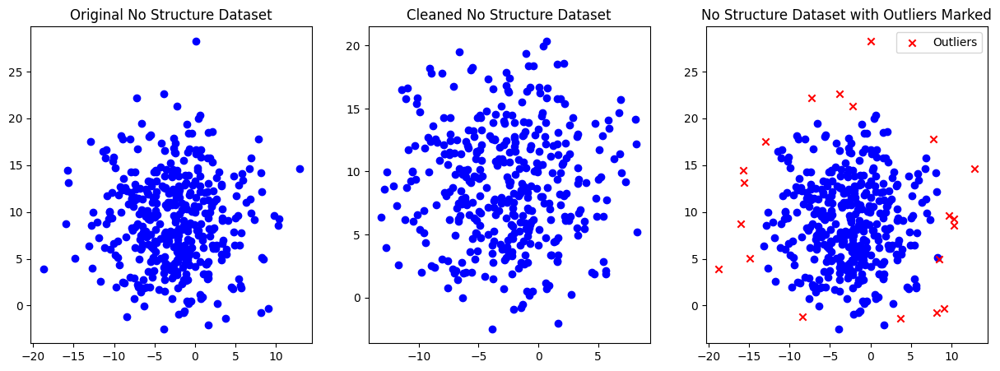

In [ ]:
# Generate a no_structure dataset with 400 samples and random state 42
data, labels = make_blobs(n_samples=400, centers=1, cluster_std=5.0, random_state=42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original No Structure Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue', cmap='viridis')
axes[0].set_title("Original No Structure Dataset")

# Cleaned No Structure Dataset
cleaned_data, cleaned_indices = remove_outliers(data)
cleaned_labels = labels[cleaned_indices]

axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1],c='blue', cmap='viridis')
axes[1].set_title("Cleaned No Structure Dataset")

# No Structure Dataset with Outliers Marked
outlier_indices = find_outliers(data)[0]  # Get the first element of the tuple
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue', cmap='viridis')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("No Structure Dataset with Outliers Marked")
axes[2].legend()

plt.show()

<ipython-input-4-97f4477737ef>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0].scatter(data[:, 0], data[:, 1], c='blue', cmap='viridis')
<ipython-input-4-97f4477737ef>:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1], c='blue', cmap='viridis')
<ipython-input-4-97f4477737ef>:30: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue', cmap='viridis')


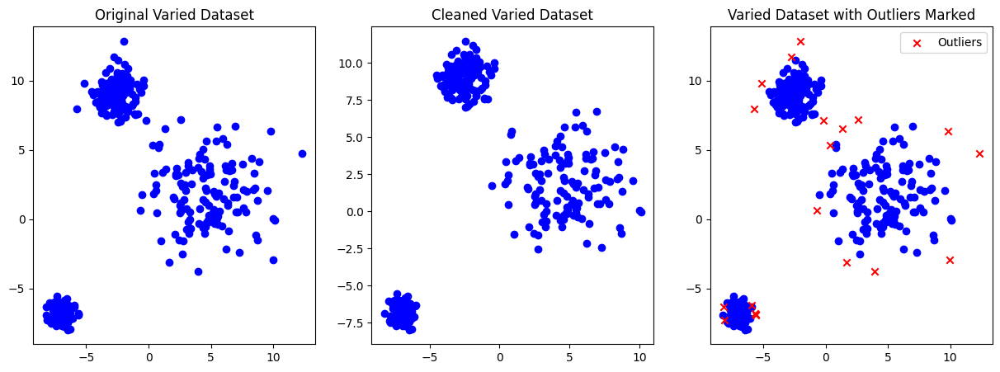

In [ ]:
from sklearn.datasets import make_blobs
import numpy as np
import matplotlib.pyplot as plt

n_samples = 400
random_state = 42
varied = make_blobs(n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state)

data, labels = varied

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Varied Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue', cmap='viridis')
axes[0].set_title("Original Varied Dataset")

# Cleaned Varied Dataset
cleaned_data, cleaned_indices = remove_outliers(data)
cleaned_labels = labels[cleaned_indices]

axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1], c='blue', cmap='viridis')
axes[1].set_title("Cleaned Varied Dataset")

# Varied Dataset with Outliers Marked
outlier_indices = find_outliers(data)[0]  # Get the first element of the tuple
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue', cmap='viridis')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Varied Dataset with Outliers Marked")
axes[2].legend()

plt.show()


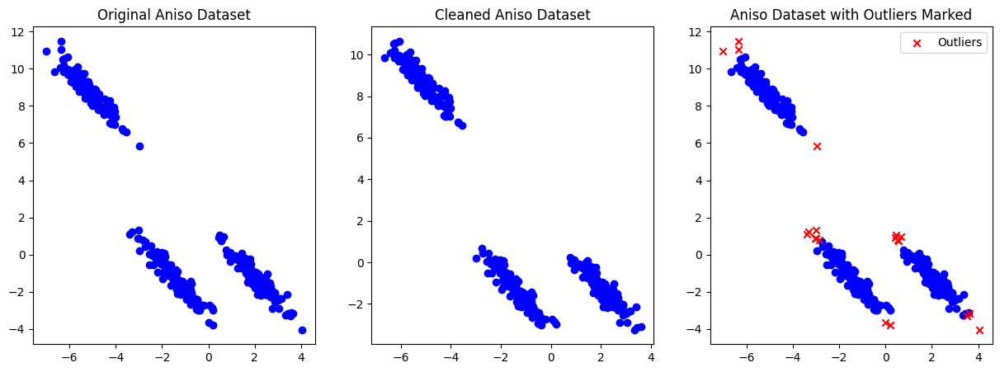

In [ ]:
from sklearn.datasets import make_blobs

# Create an aniso dataset with 400 samples and random state 42
data, labels = make_blobs(n_samples=400, centers=3, random_state=42)

# Apply an anisotropic transformation to the data
transformation = [[0.6, -0.6], [-0.4, 0.8]]
data = np.dot(data, transformation)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Aniso Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue')
axes[0].set_title("Original Aniso Dataset")

# Cleaned Aniso Dataset
cleaned_data, cleaned_indices = remove_outliers(data)
cleaned_labels = labels[cleaned_indices]
axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1], c='blue')
axes[1].set_title("Cleaned Aniso Dataset")

# Aniso Dataset with Outliers Marked
outlier_indices = find_outliers(data)[0]
inlier_data = data[cleaned_indices]
outlier_data = data[outlier_indices]
axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Aniso Dataset with Outliers Marked")
axes[2].legend()

plt.show()


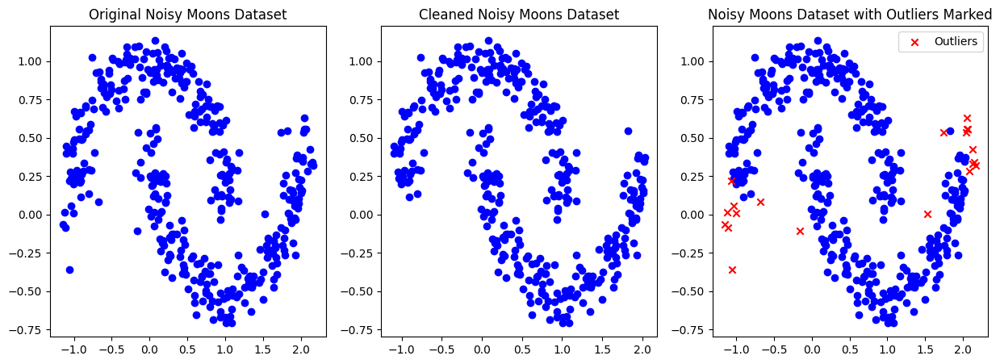

In [ ]:
from sklearn.datasets import make_moons

# Create a noisy_moons dataset with 200 samples and noise=0.1
data, labels = make_moons(n_samples=400, noise=0.1, random_state=42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Noisy Moons Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue')
axes[0].set_title("Original Noisy Moons Dataset")

# Cleaned Noisy Moons Dataset
cleaned_data, cleaned_indices = remove_outliers(data)
cleaned_labels = labels[cleaned_indices]
axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1], c='blue')
axes[1].set_title("Cleaned Noisy Moons Dataset")

# Noisy Moons Dataset with Outliers Marked
outlier_indices = find_outliers(data)[0]
inlier_data = data[cleaned_indices]
outlier_data = data[outlier_indices]
axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Noisy Moons Dataset with Outliers Marked")
axes[2].legend()

plt.show()


kmean

In [ ]:
def k_means_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
    kmeans.fit(data)
    cluster_assignments = kmeans.labels_
    cluster_centroids = kmeans.cluster_centers_
    return cluster_assignments, cluster_centroids

def find_optimal_clusters_silhouette(data, max_clusters):
    silhouette_scores = []
    for i in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
        cluster_assignments = kmeans.fit_predict(data)
        silhouette_avg = silhouette_score(data, cluster_assignments)
        silhouette_scores.append(silhouette_avg)
    optimal_clusters = silhouette_scores.index(max(silhouette_scores)) + 2
    return optimal_clusters

def plot_elbow_method(data, max_clusters):
    wcss = []
    for i in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()

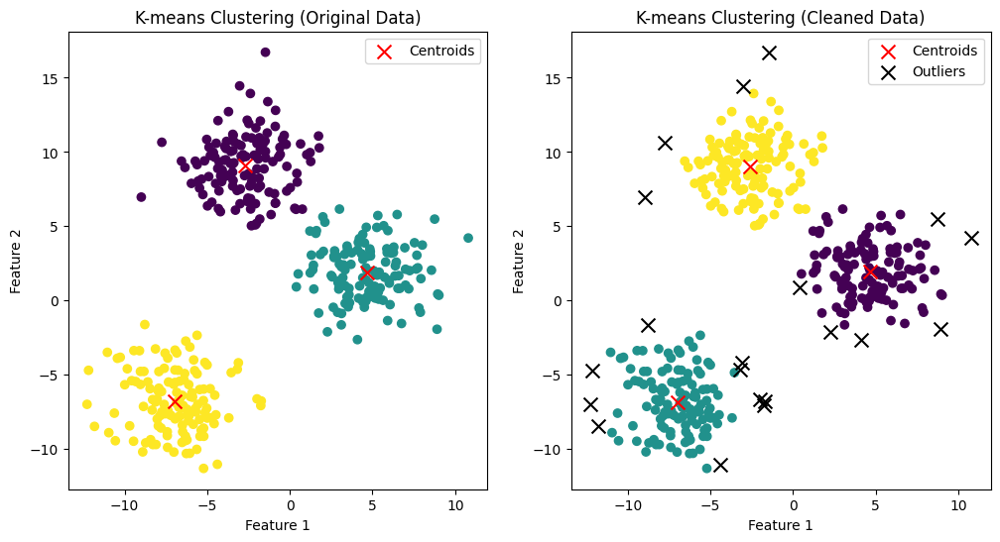

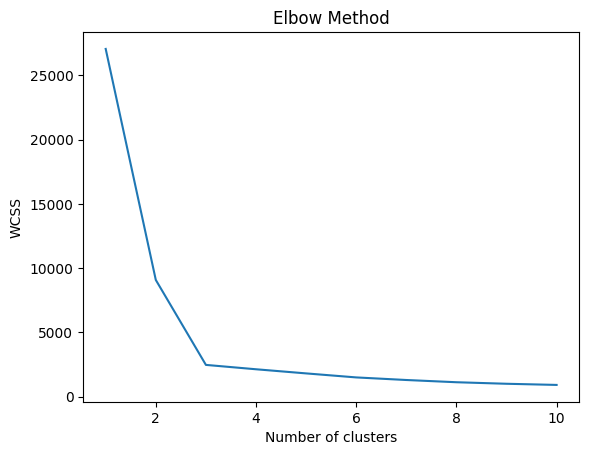

Silhouette score (original data): 0.6948587818717155
Silhouette score (cleaned data): 0.7098555489357474


In [ ]:
# Generate synthetic data with blobs shape
data, labels = make_blobs(n_samples=400, centers=3, random_state=42, cluster_std=2.0)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data)

# Get outlier indices
outlier_indices = find_outliers(data)[0]

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters)

# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters)

# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

# Plot the elbow method for the cleaned data
plot_elbow_method(cleaned_data, max_clusters)

# Calculate the silhouette score for the original data
silhouette_score_original = silhouette_score(data, cluster_assignments_original)

# Calculate the silhouette score for the cleaned data
silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)

print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)

+----------------------+-----------------+----------------+
|   Number of clusters |   Original data |   Cleaned data |
+======================+=================+================+
|                    2 |        0.619711 |       0.635068 |
+----------------------+-----------------+----------------+
|                    3 |        0.694859 |       0.709856 |
+----------------------+-----------------+----------------+
|                    4 |        0.561043 |       0.584377 |
+----------------------+-----------------+----------------+
|                    5 |        0.449893 |       0.467704 |
+----------------------+-----------------+----------------+
|                    6 |        0.346787 |       0.364167 |
+----------------------+-----------------+----------------+
|                    7 |        0.350383 |       0.373573 |
+----------------------+-----------------+----------------+
|                    8 |        0.347376 |       0.372098 |
+----------------------+----------------

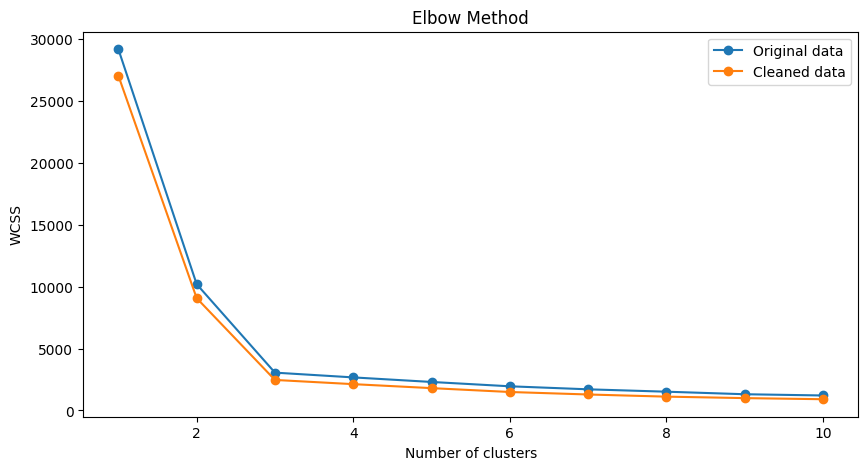

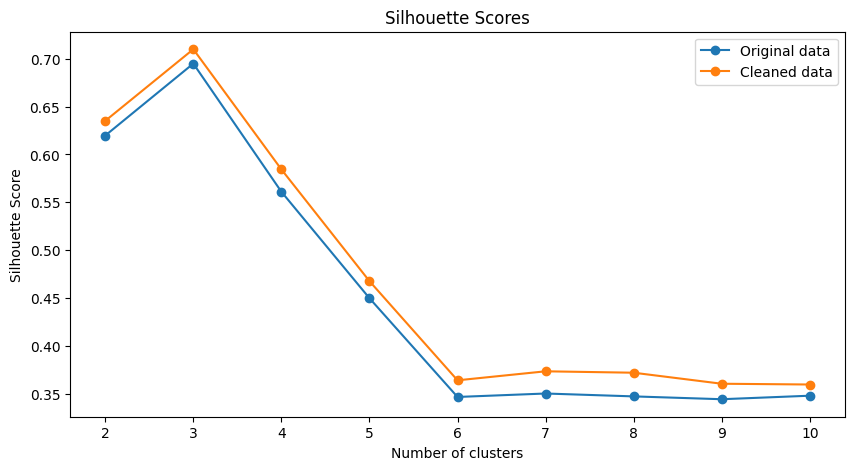

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tabulate import tabulate

# Generate synthetic data with blobs shape
data, labels = make_blobs(n_samples=400, centers=3, random_state=42, cluster_std=2.0)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data)

# Get outlier indices
outlier_indices = find_outliers(data)[0]

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

# Initialize table data for silhouette scores
table_data = []

# Loop through different numbers of clusters (from 2 to 10)
for n_clusters in range(2, max_clusters + 1):
    # Apply k-means clustering to the original data
    cluster_assignments_original, _ = k_means_clustering(data, n_clusters)
    # Apply k-means clustering to the cleaned data
    cluster_assignments_cleaned, _ = k_means_clustering(cleaned_data, n_clusters)

    # Calculate the silhouette score for the original data
    silhouette_score_original = silhouette_score(data, cluster_assignments_original)
    # Calculate the silhouette score for the cleaned data
    silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)

    # Append silhouette scores to the table data
    table_data.append([n_clusters, silhouette_score_original, silhouette_score_cleaned])

# Print silhouette scores in a table format
print(tabulate(table_data, headers=['Number of clusters', 'Original data', 'Cleaned data'], tablefmt='grid'))

# Plot the elbow method for the original and cleaned data
wcss_original = []
wcss_cleaned = []

for i in range(1, max_clusters + 1):
    kmeans_original = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_original.fit(data)
    wcss_original.append(kmeans_original.inertia_)

    kmeans_cleaned = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_cleaned.fit(cleaned_data)
    wcss_cleaned.append(kmeans_cleaned.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(range(1, max_clusters + 1), wcss_original, label='Original data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned data', marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Plot silhouette scores for different numbers of clusters
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters + 1), [row[1] for row in table_data], label='Original data', marker='o')
plt.plot(range(2, max_clusters + 1), [row[2] for row in table_data], label='Cleaned data', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.title('Silhouette Scores')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


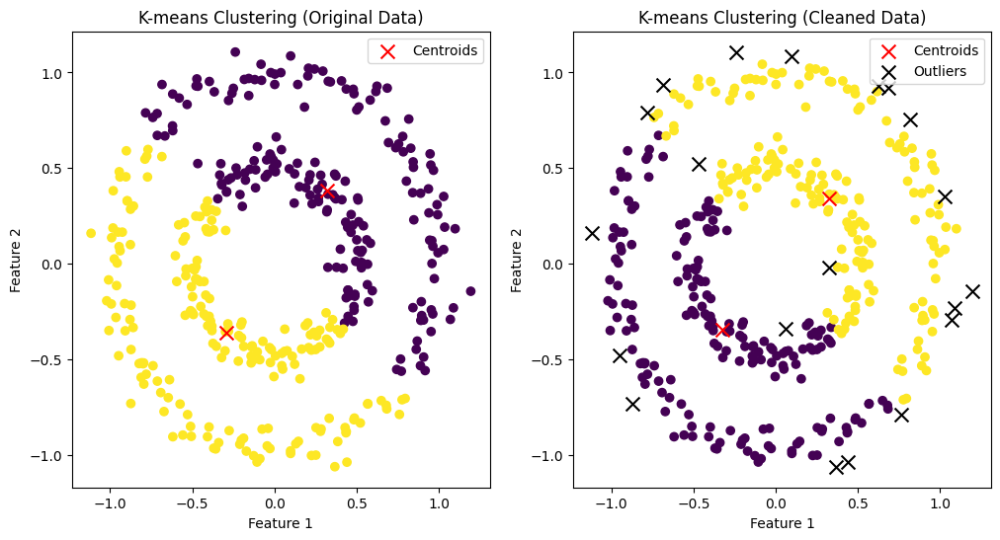

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_circles
from sklearn.metrics import silhouette_score

# Generate synthetic data with noisy circles
data, labels = make_circles(n_samples=400, factor=0.5, noise=0.065, random_state=42)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Optimal number of clusters
optimal_clusters = 2

# Apply k-means clustering to the original data
kmeans_original = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_original.fit(data)
cluster_assignments_original = kmeans_original.labels_
cluster_centroids_original = kmeans_original.cluster_centers_

# Apply k-means clustering to the cleaned data
kmeans_cleaned = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_cleaned.fit(cleaned_data)
cluster_assignments_cleaned = kmeans_cleaned.labels_
cluster_centroids_cleaned = kmeans_cleaned.cluster_centers_

# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()


detect outlier test with no structure

<ipython-input-11-4ee9502f7753>:7: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0].scatter(data[:, 0], data[:, 1], c='blue', cmap='viridis')
<ipython-input-11-4ee9502f7753>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1],c='blue', cmap='viridis')
<ipython-input-11-4ee9502f7753>:23: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue', cmap='viridis')


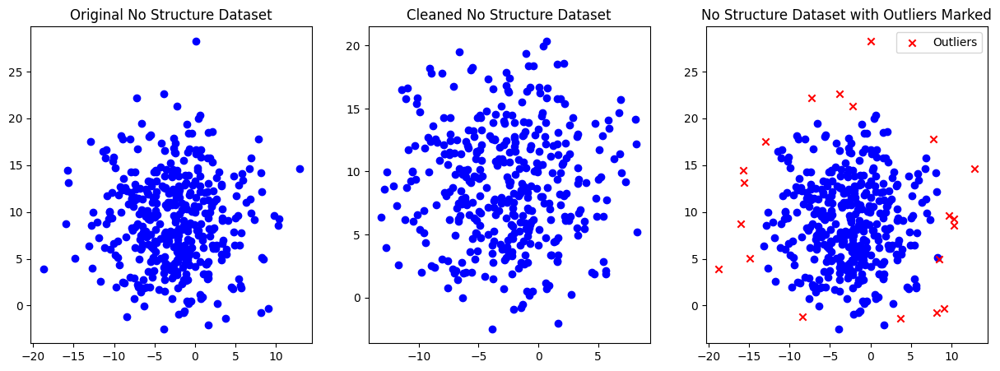

In [ ]:
# Generate a no_structure dataset with 400 samples and random state 42
data, labels = make_blobs(n_samples=400, centers=1, cluster_std=5.0, random_state=42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original No Structure Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue', cmap='viridis')
axes[0].set_title("Original No Structure Dataset")

# Cleaned No Structure Dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
cleaned_labels = labels[cleaned_indices]

axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1],c='blue', cmap='viridis')
axes[1].set_title("Cleaned No Structure Dataset")

# No Structure Dataset with Outliers Marked
outlier_indices = find_outliers(data, percentile=95)[0]  # Get the first element of the tuple
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue', cmap='viridis')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("No Structure Dataset with Outliers Marked")
axes[2].legend()

plt.show()

detect outlier test with varied

<ipython-input-12-e140303a115b>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0].scatter(data[:, 0], data[:, 1],c='blue', cmap='viridis')
<ipython-input-12-e140303a115b>:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1],c='blue',  cmap='viridis')
<ipython-input-12-e140303a115b>:30: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue',cmap='viridis')


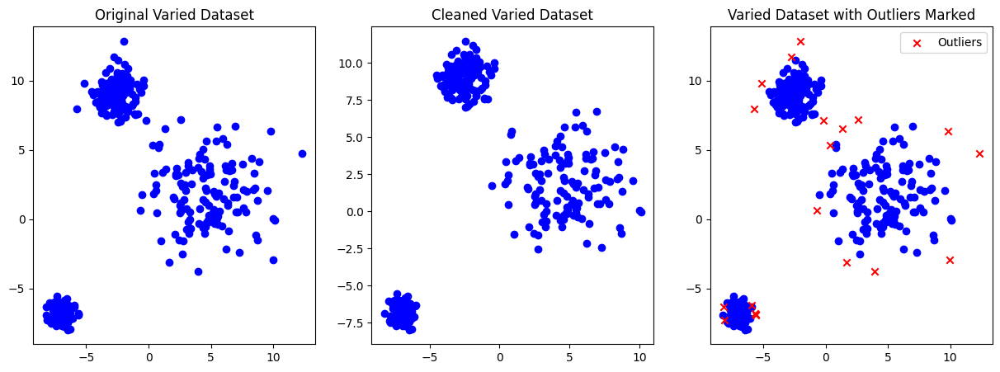

In [ ]:
from sklearn.datasets import make_blobs
import numpy as np
import matplotlib.pyplot as plt

n_samples = 400
random_state = 42
varied = make_blobs(n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state)

data, labels = varied

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Varied Dataset
axes[0].scatter(data[:, 0], data[:, 1],c='blue', cmap='viridis')
axes[0].set_title("Original Varied Dataset")

# Cleaned Varied Dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
cleaned_labels = labels[cleaned_indices]

axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1],c='blue',  cmap='viridis')
axes[1].set_title("Cleaned Varied Dataset")

# Varied Dataset with Outliers Marked
outlier_indices = find_outliers(data, percentile=95)[0]  # Get the first element of the tuple
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue',cmap='viridis')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Varied Dataset with Outliers Marked")
axes[2].legend()

plt.show()


detect outlier test with blobs

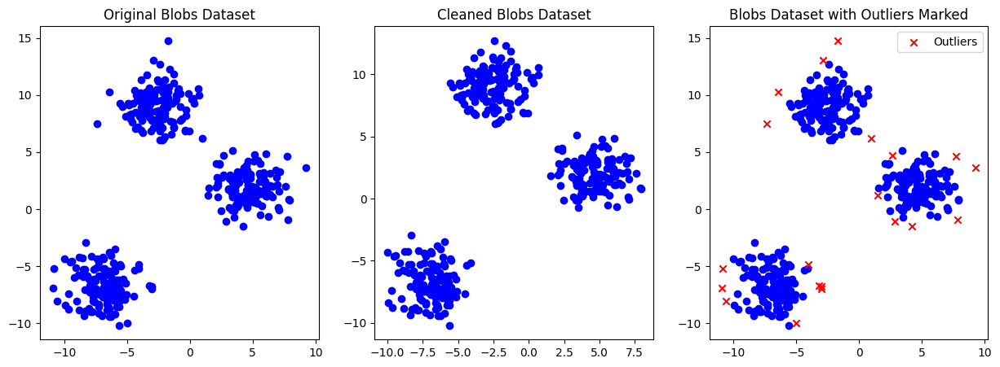

In [ ]:
# Create a blobs dataset with 200 samples and random state 42
data, labels = make_blobs(n_samples=400, centers=3, cluster_std=1.5, random_state=42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Blobs Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue')
axes[0].set_title("Original Blobs Dataset")

# Cleaned Blobs Dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
cleaned_labels = np.delete(labels, find_outliers(data, percentile=95), axis=0)

axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1], c='blue')
axes[1].set_title("Cleaned Blobs Dataset")

# Blobs Dataset with Outliers Marked
outlier_indices = find_outliers(data, percentile=95)
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Blobs Dataset with Outliers Marked")
axes[2].legend()

plt.show()


detect outlier test with aniso


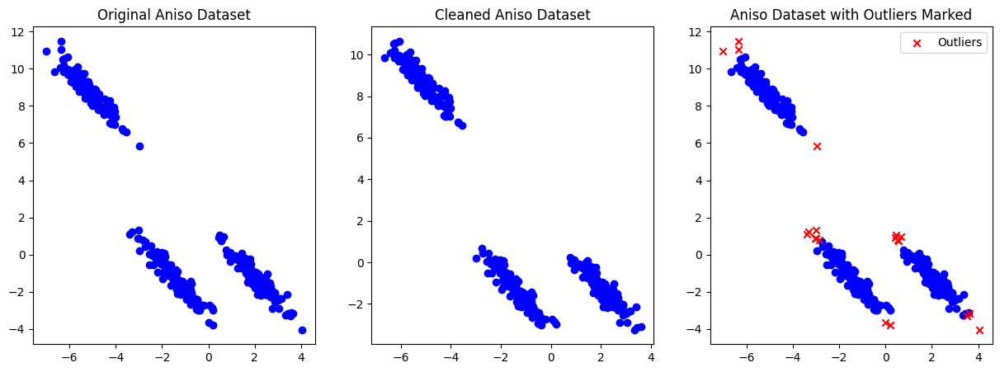

In [ ]:
# Create an aniso dataset with 200 samples and random state 42
data, labels = make_blobs(n_samples=400, centers=3, random_state=42)

# Apply an anisotropic transformation to the data
transformation = [[0.6, -0.6], [-0.4, 0.8]]
data = np.dot(data, transformation)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Aniso Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue')
axes[0].set_title("Original Aniso Dataset")

# Cleaned Aniso Dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
cleaned_labels = np.delete(labels, find_outliers(data, percentile=95), axis=0)
axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1], c='blue')
axes[1].set_title("Cleaned Aniso Dataset")

# Aniso Dataset with Outliers Marked
outlier_indices = find_outliers(data, percentile=95)
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Aniso Dataset with Outliers Marked")
axes[2].legend()

plt.show()


detect outlier test with moons

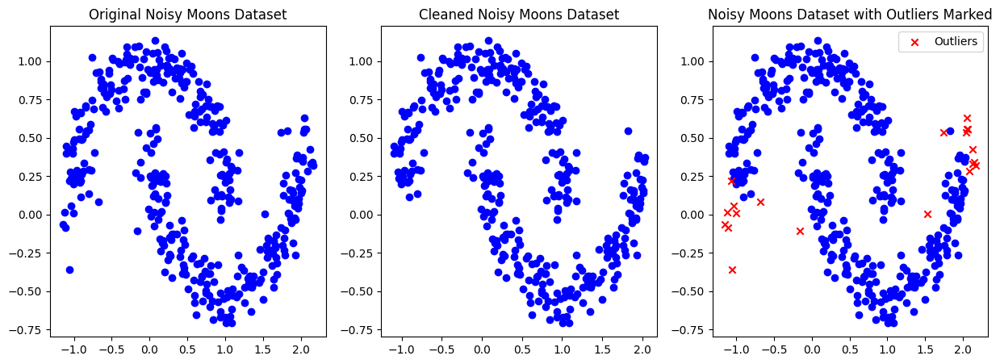

In [ ]:
# Create a noisy_moons dataset with 200 samples and noise=0.1
data, labels = make_moons(n_samples=400, noise=0.1, random_state=42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Noisy Moons Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue')
axes[0].set_title("Original Noisy Moons Dataset")

# Cleaned Noisy Moons Dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
cleaned_labels = np.delete(labels, find_outliers(data, percentile=95), axis=0)

axes[1].scatter(cleaned_data[:, 0], cleaned_data[:, 1], c='blue')
axes[1].set_title("Cleaned Noisy Moons Dataset")

# Noisy Moons Dataset with Outliers Marked
outlier_indices = find_outliers(data, percentile=95)
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Noisy Moons Dataset with Outliers Marked")
axes[2].legend()

plt.show()

detect outlier test with noisy circle

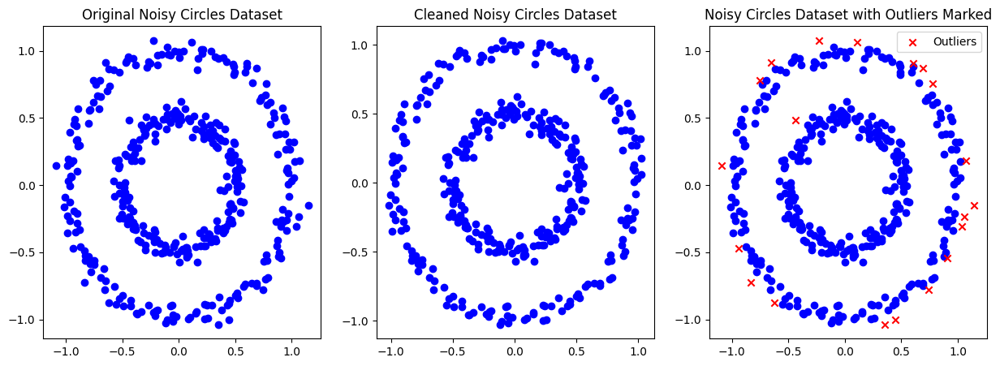

In [ ]:
# Create a noisy_circles dataset with 400 samples and noise=0.5
data, labels = make_circles(n_samples=400, noise=0.05,factor = 0.5, random_state=42)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Original Noisy Circles Dataset
axes[0].scatter(data[:, 0], data[:, 1], c='blue')
axes[0].set_title("Original Noisy Circles Dataset")

# Cleaned Noisy Circles Dataset
cleaned_data = remove_outliers(data, percentile=95)
cleaned_labels = np.delete(labels, find_outliers(data, percentile=95), axis=0)

axes[1].scatter(cleaned_data[0][:, 0], cleaned_data[0][:, 1], c='blue')
axes[1].set_title("Cleaned Noisy Circles Dataset")

# Noisy Circles Dataset with Outliers Marked
outlier_indices = find_outliers(data, percentile=95)
inlier_data = np.delete(data, outlier_indices, axis=0)
inlier_labels = np.delete(labels, outlier_indices, axis=0)
outlier_data = data[outlier_indices]

axes[2].scatter(inlier_data[:, 0], inlier_data[:, 1], c='blue')
axes[2].scatter(outlier_data[:, 0], outlier_data[:, 1], c='red', marker='x', label='Outliers')
axes[2].set_title("Noisy Circles Dataset with Outliers Marked")
axes[2].legend()

plt.show()

test with k-mean

In [ ]:
def k_means_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)

    # Fit the model to the data
    kmeans.fit(data)

    # Get the cluster assignments for each data point
    cluster_assignments = kmeans.labels_

    # Get the cluster centroids
    cluster_centroids = kmeans.cluster_centers_

    return cluster_assignments, cluster_centroids

def find_optimal_clusters_silhouette(data, max_clusters):
    cleaned_data, _ = remove_outliers(data, percentile=95)
    # Calculate the silhouette scores for different cluster numbers
    silhouette_scores = []
    for i in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
        cluster_assignments = kmeans.fit_predict(cleaned_data)
        silhouette_avg = silhouette_score(cleaned_data, cluster_assignments)
        silhouette_scores.append(silhouette_avg)

    optimal_clusters = silhouette_scores.index(max(silhouette_scores)) + 2
    return optimal_clusters

def plot_elbow_method(data, max_clusters):
    # Calculate the Within-Cluster-Sum-of-Squares (WCSS) for different cluster numbers
    wcss = []
    for i in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)

    # Plot the WCSS values for different cluster numbers
    plt.plot(range(1, max_clusters + 1), wcss)
    plt.title('Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('WCSS')
    plt.show()

test k-mean with blobs shape

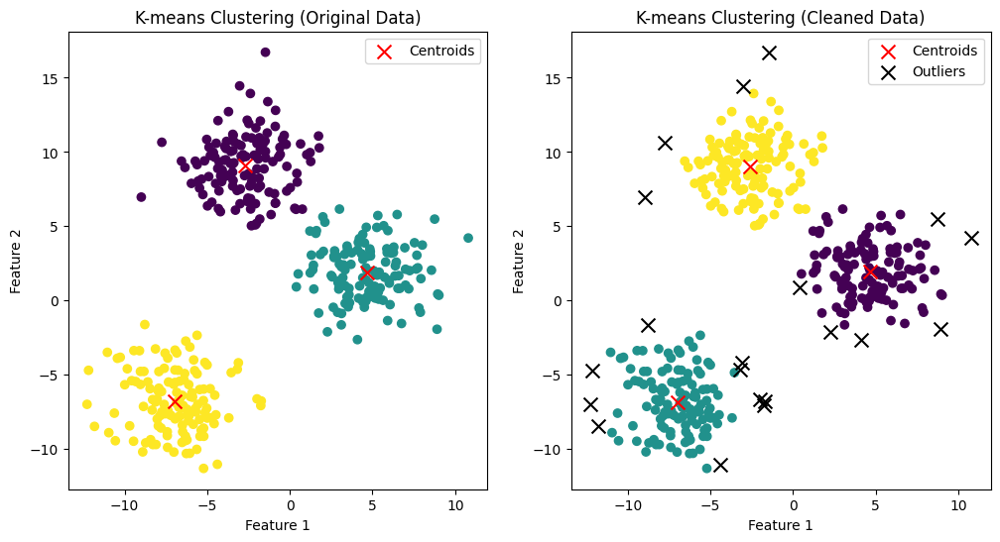

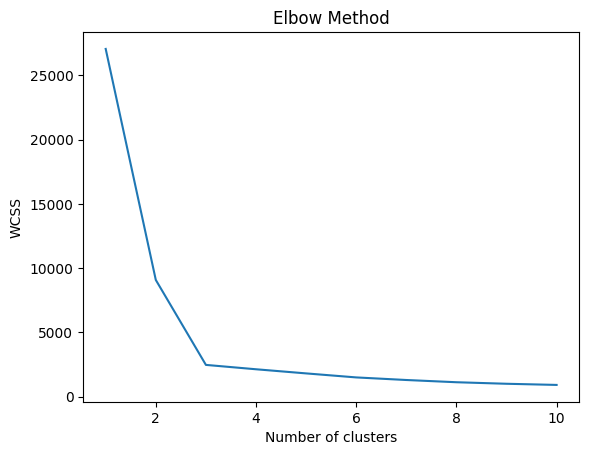

Silhouette score (original data): 0.6948587818717155
Silhouette score (cleaned data): 0.7098555489357474


In [ ]:
# Generate synthetic data with blobs shape
data, labels = make_blobs(n_samples=400, centers=3, random_state=42, cluster_std=2.0)
# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)
# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters = find_optimal_clusters_silhouette(cleaned_data, max_clusters)
# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters)
# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters)
# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()
# Plot the elbow method for the cleaned data
plot_elbow_method(cleaned_data, max_clusters)
# Calculate the silhouette score for the original data
silhouette_score_original = silhouette_score(data, cluster_assignments_original)
# Calculate the silhouette score for the cleaned data
silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)
print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)

+----------------------+-----------------+----------------+
|   Number of clusters |   Original data |   Cleaned data |
+======================+=================+================+
|                    2 |        0.619711 |       0.635068 |
+----------------------+-----------------+----------------+
|                    3 |        0.694859 |       0.709856 |
+----------------------+-----------------+----------------+
|                    4 |        0.561043 |       0.584377 |
+----------------------+-----------------+----------------+
|                    5 |        0.449893 |       0.467704 |
+----------------------+-----------------+----------------+
|                    6 |        0.346787 |       0.364167 |
+----------------------+-----------------+----------------+
|                    7 |        0.350383 |       0.373573 |
+----------------------+-----------------+----------------+
|                    8 |        0.347376 |       0.372098 |
+----------------------+----------------

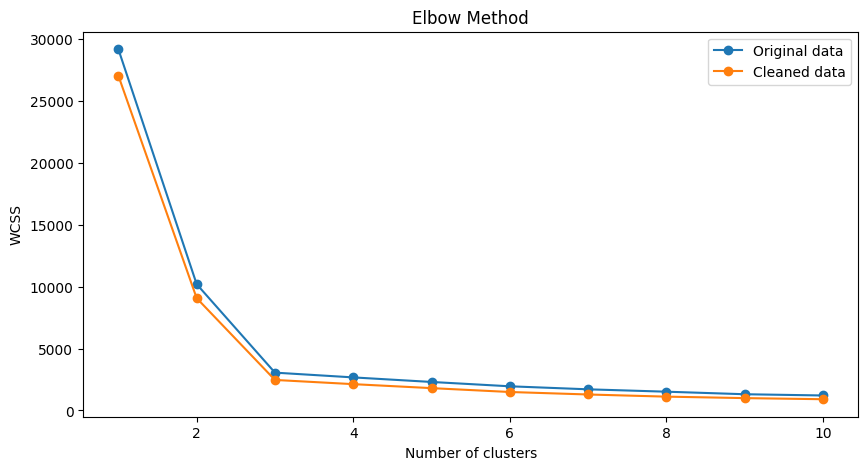

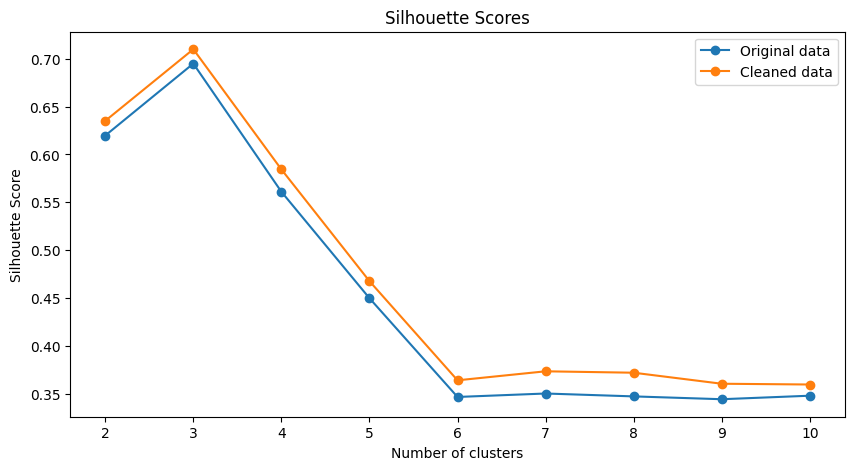

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tabulate import tabulate

# Generate synthetic data with blobs shape
data, labels = make_blobs(n_samples=400, centers=3, random_state=42, cluster_std=2.0)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

# Initialize table data for silhouette scores
table_data = []

# Loop through different numbers of clusters (from 2 to 10)
for n_clusters in range(2, max_clusters + 1):
    # Apply k-means clustering to the original data
    cluster_assignments_original, _ = k_means_clustering(data, n_clusters)
    # Apply k-means clustering to the cleaned data
    cluster_assignments_cleaned, _ = k_means_clustering(cleaned_data, n_clusters)

    # Calculate the silhouette score for the original data
    silhouette_score_original = silhouette_score(data, cluster_assignments_original)
    # Calculate the silhouette score for the cleaned data
    silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)

    # Append silhouette scores to the table data
    table_data.append([n_clusters, silhouette_score_original, silhouette_score_cleaned])

# Print silhouette scores in a table format
print(tabulate(table_data, headers=['Number of clusters', 'Original data', 'Cleaned data'], tablefmt='grid'))

# Plot the elbow method for the original and cleaned data
wcss_original = []
wcss_cleaned = []

for i in range(1, max_clusters + 1):
    kmeans_original = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_original.fit(data)
    wcss_original.append(kmeans_original.inertia_)

    kmeans_cleaned = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_cleaned.fit(cleaned_data)
    wcss_cleaned.append(kmeans_cleaned.inertia_)

plt.figure(figsize=(10, 5))
plt.plot(range(1, max_clusters + 1), wcss_original, label='Original data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned data', marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Plot silhouette scores for different numbers of clusters
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters + 1), [row[1] for row in table_data], label='Original data', marker='o')
plt.plot(range(2, max_clusters + 1), [row[2] for row in table_data], label='Cleaned data', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.title('Silhouette Scores')
plt.show()


In [ ]:
"""
data1, labels1 = make_blobs(n_samples=400, centers=3, random_state=42, cluster_std=2.0)
data2, labels2 = make_circles(n_samples=400, factor=0.5, noise=0.05, random_state=42)
data3, labels3 = make_blobs(n_samples=400, centers=1, cluster_std=5.0, random_state=42)
data4, labels4 = make_moons(n_samples=400, noise=0.1, random_state=42)
data5, labels5 = make_blobs(n_samples=500, centers=3, random_state=42, cluster_std=2.0)
transformation = np.array([[0.6, -0.6], [-0.4, 0.8]])
data = np.dot(data5, transformation)
"""

In [ ]:
"""
# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters = 2
# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters)
# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters)
# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()
# Calculate the silhouette score for the original data
silhouette_score_original = silhouette_score(data, cluster_assignments_original)
# Calculate the silhouette score for the cleaned data
silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)
print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)
"""

test k-mean with noisy circle

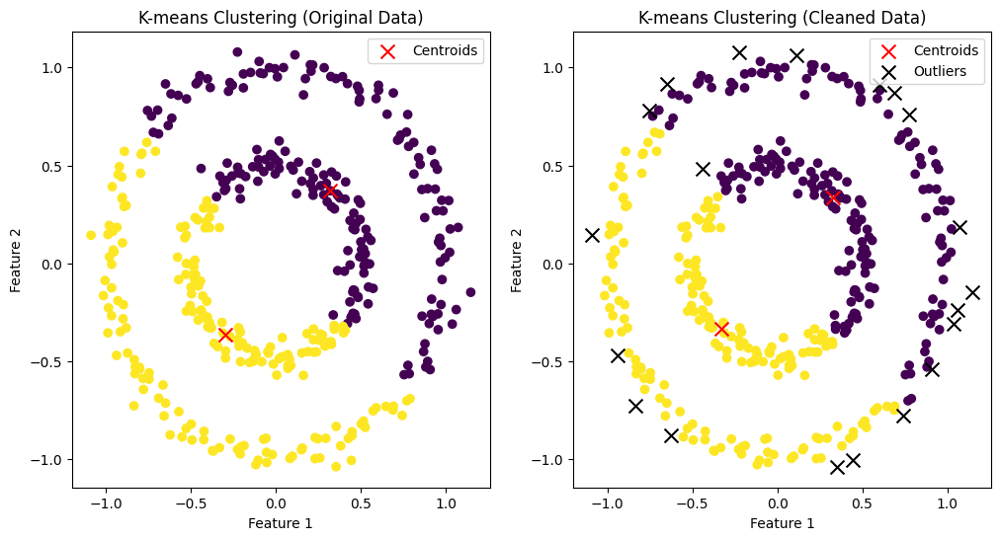

Silhouette score (original data): 0.3545351751803083
Silhouette score (cleaned data): 0.3579107105236524
WCSS (original data): 1213.1649958948733
WCSS (cleaned data): 910.4113953422648


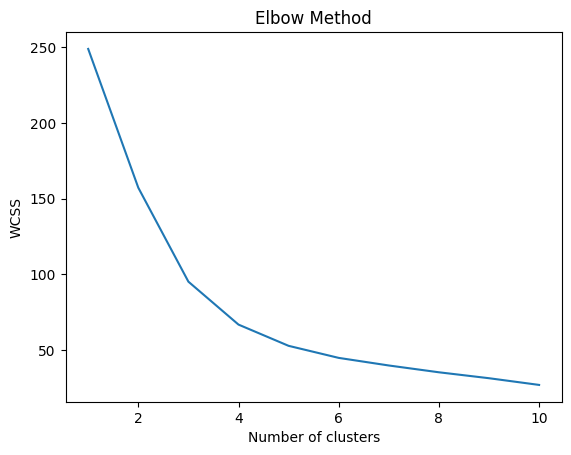

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_circles
from sklearn.metrics import silhouette_score

# Generate synthetic data with noisy circles
data, labels = make_circles(n_samples=400, factor=0.5, noise=0.05, random_state=42)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters = 2
# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters)
# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters)
# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()
# Calculate the silhouette score for the original data
silhouette_score_original = silhouette_score(data, cluster_assignments_original)
# Calculate the silhouette score for the cleaned data
silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)
print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)

# Calculate the WCSS (inertia) for the original data
wcss_original = kmeans_original.inertia_

# Calculate the WCSS (inertia) for the cleaned data
wcss_cleaned = kmeans_cleaned.inertia_

print("WCSS (original data):", wcss_original)
print("WCSS (cleaned data):", wcss_cleaned)

# Plot the elbow method for the original data
plot_elbow_method(data, max_clusters)


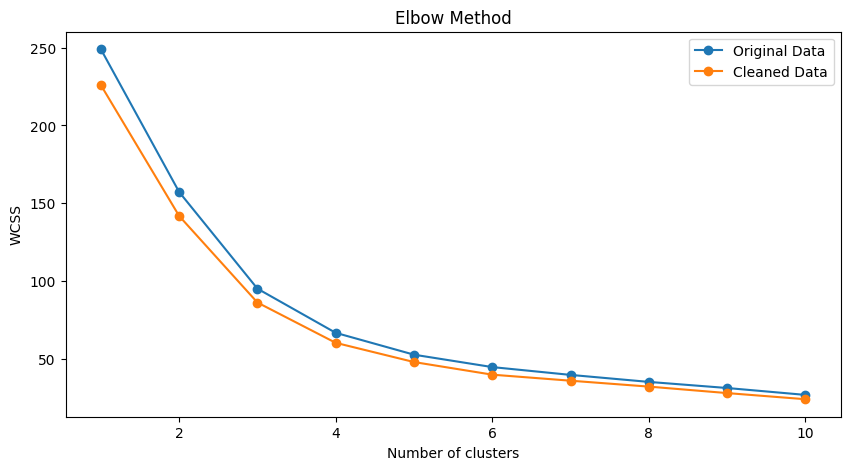

+----------------------+-----------------+----------------+
|   Number of clusters |   Original data |   Cleaned data |
+======================+=================+================+
|                    2 |        0.354535 |       0.357911 |
+----------------------+-----------------+----------------+
|                    3 |        0.389376 |       0.389668 |
+----------------------+-----------------+----------------+
|                    4 |        0.380968 |       0.382804 |
+----------------------+-----------------+----------------+
|                    5 |        0.358617 |       0.356441 |
+----------------------+-----------------+----------------+
|                    6 |        0.33395  |       0.341467 |
+----------------------+-----------------+----------------+
|                    7 |        0.315615 |       0.353352 |
+----------------------+-----------------+----------------+
|                    8 |        0.353334 |       0.352627 |
+----------------------+----------------

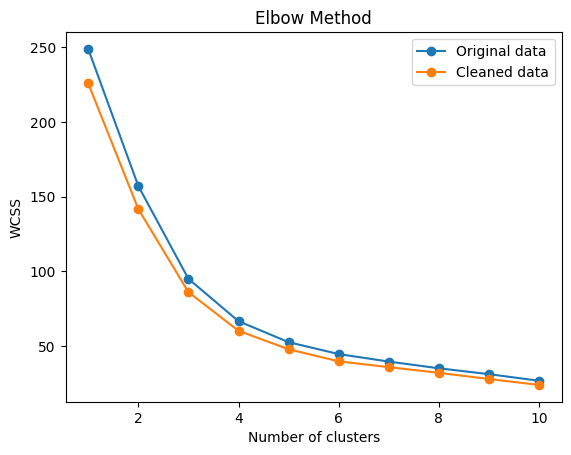

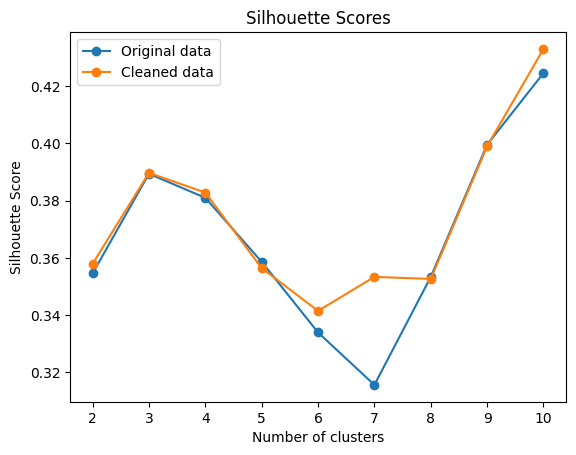

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_circles
from sklearn.metrics import silhouette_score
from tabulate import tabulate

# Generate synthetic data with noisy circles
data, labels = make_circles(n_samples=400, factor=0.5, noise=0.05, random_state=42)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10

# Calculate the WCSS and silhouette scores for different cluster numbers
wcss_original = []
wcss_cleaned = []
silhouette_scores_original = []
silhouette_scores_cleaned = []
for i in range(1, max_clusters + 1):
    kmeans_original = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_cleaned = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)

    kmeans_original.fit(data)
    kmeans_cleaned.fit(cleaned_data)

    wcss_original.append(kmeans_original.inertia_)
    wcss_cleaned.append(kmeans_cleaned.inertia_)

    if i > 1:
        cluster_assignments_original = kmeans_original.labels_
        cluster_assignments_cleaned = kmeans_cleaned.labels_

        silhouette_scores_original.append(silhouette_score(data, cluster_assignments_original))
        silhouette_scores_cleaned.append(silhouette_score(cleaned_data, cluster_assignments_cleaned))

# Plot the WCSS values for both original and cleaned data
plt.figure(figsize=(10, 5))
plt.plot(range(1, max_clusters + 1), wcss_original, label='Original Data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned Data', marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Print silhouette scores in a table format
table_data = list(zip(range(2, max_clusters + 1), silhouette_scores_original, silhouette_scores_cleaned))
print(tabulate(table_data, headers=['Number of clusters', 'Original data', 'Cleaned data'], tablefmt='grid'))

# Plot the elbow method for the original and cleaned data
plt.plot(range(1, max_clusters + 1), wcss_original, label='Original data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned data', marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Plot the silhouette scores for the original and cleaned data
plt.plot(range(2, max_clusters + 1), silhouette_scores_original, label='Original data', marker='o')
plt.plot(range(2, max_clusters + 1), silhouette_scores_cleaned, label='Cleaned data', marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.show()


test k-mean with no structure

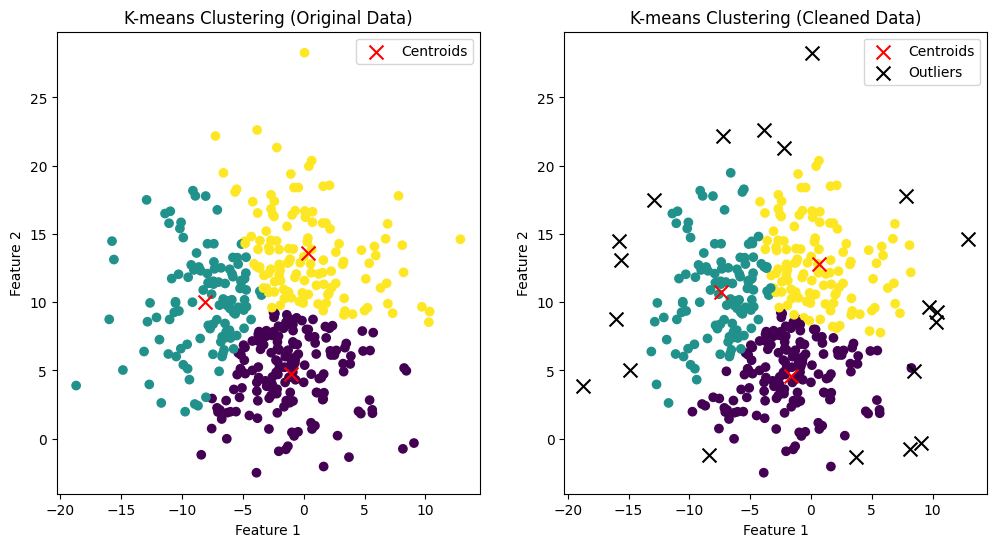

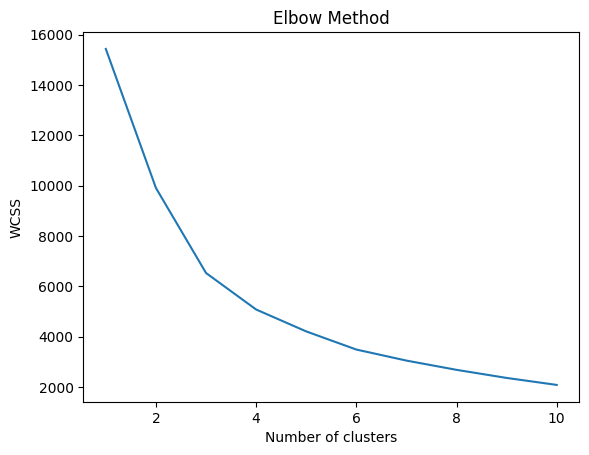

Silhouette score (original data): 0.34799605722366744
Silhouette score (cleaned data): 0.3570260488890223


NameError: ignored

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score

# Generate synthetic data with no specific structure
data, labels = make_blobs(n_samples=400, centers=1, cluster_std=5.0, random_state=42)
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)
max_clusters = 10
optimal_clusters_original = find_optimal_clusters_silhouette(data, max_clusters)
optimal_clusters_cleaned = find_optimal_clusters_silhouette(cleaned_data, max_clusters)
# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters_original)
# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters_cleaned)
# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.show()

# Calculate the silhouette score for the original data
if optimal_clusters_original > 1:
    silhouette_score_original = silhouette_score(data, cluster_assignments_original)
else:
    silhouette_score_original = None
# Calculate the silhouette score for the cleaned data
if optimal_clusters_cleaned > 1:
    silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)
else:
    silhouette_score_cleaned = None
# Plot the elbow method for the cleaned data
plot_elbow_method(cleaned_data, max_clusters)
print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)



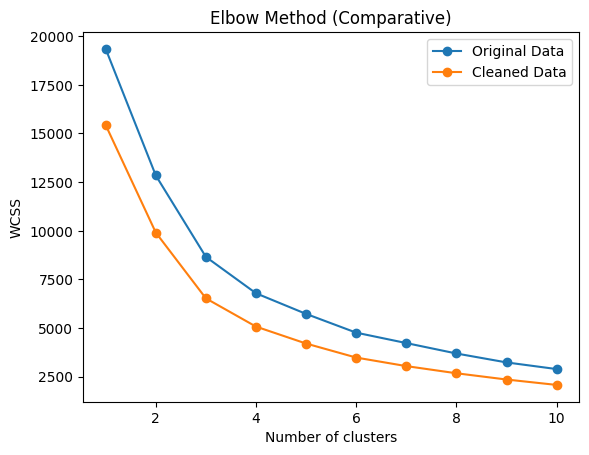

+----------------------+-----------------+----------------+
|   Number of clusters |   Original Data |   Cleaned Data |
+======================+=================+================+
|                    2 |        0.321255 |       0.335734 |
+----------------------+-----------------+----------------+
|                    3 |        0.347996 |       0.357026 |
+----------------------+-----------------+----------------+
|                    4 |        0.329396 |       0.32989  |
+----------------------+-----------------+----------------+
|                    5 |        0.31162  |       0.320025 |
+----------------------+-----------------+----------------+
|                    6 |        0.321324 |       0.331296 |
+----------------------+-----------------+----------------+
|                    7 |        0.317981 |       0.331525 |
+----------------------+-----------------+----------------+
|                    8 |        0.324691 |       0.33209  |
+----------------------+----------------

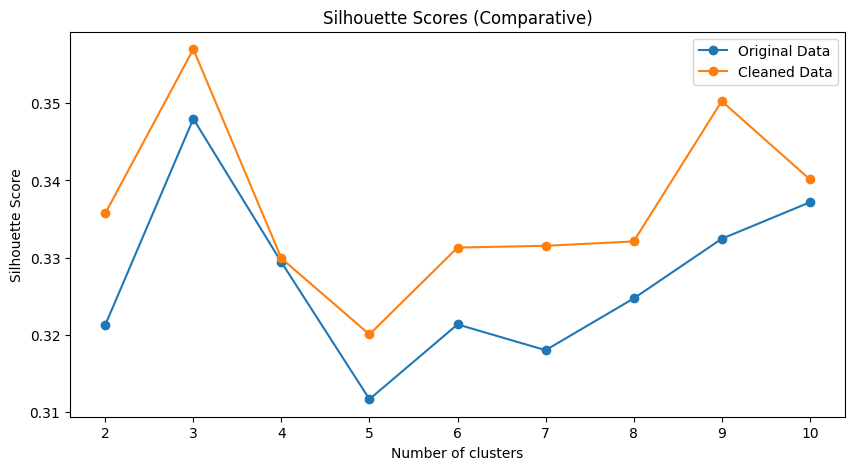

In [ ]:
# Generate synthetic data with no specific structure
data, labels = make_blobs(n_samples=400, centers=1, cluster_std=5.0, random_state=42)
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)
max_clusters = 10
optimal_clusters_original = find_optimal_clusters_silhouette(data, max_clusters)
optimal_clusters_cleaned = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters_original)

# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters_cleaned)

# Plot the comparative elbow method for the original and cleaned data
wcss_original = []
wcss_cleaned = []
for i in range(1, max_clusters + 1):
    kmeans_original = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_original.fit(data)
    wcss_original.append(kmeans_original.inertia_)

    kmeans_cleaned = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_cleaned.fit(cleaned_data)
    wcss_cleaned.append(kmeans_cleaned.inertia_)

plt.plot(range(1, max_clusters + 1), wcss_original, label='Original Data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned Data', marker='o')
plt.title('Elbow Method (Comparative)')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Calculate the silhouette scores for the original and cleaned data
silhouette_scores_original = []
silhouette_scores_cleaned = []
for i in range(2, max_clusters + 1):
    kmeans_original = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    cluster_assignments_original = kmeans_original.fit_predict(data)
    silhouette_avg_original = silhouette_score(data, cluster_assignments_original)
    silhouette_scores_original.append(silhouette_avg_original)

    kmeans_cleaned = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    cluster_assignments_cleaned = kmeans_cleaned.fit_predict(cleaned_data)
    silhouette_avg_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)
    silhouette_scores_cleaned.append(silhouette_avg_cleaned)

# Print silhouette scores in a table format
table_data = []
for i, (original, cleaned) in enumerate(zip(silhouette_scores_original, silhouette_scores_cleaned)):
    table_data.append([i + 2, original, cleaned])

print(tabulate(table_data, headers=['Number of clusters', 'Original Data', 'Cleaned Data'], tablefmt='grid'))

# Plot silhouette scores for different numbers of clusters
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters + 1), silhouette_scores_original, label='Original Data', marker='o')
plt.plot(range(2, max_clusters + 1), silhouette_scores_cleaned, label='Cleaned Data', marker='o')
plt.title('Silhouette Scores (Comparative)')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.show()


In [ ]:
"""
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score

# Generate synthetic data with no specific structure
n_samples = 400
no_structure = np.random.rand(n_samples, 2), None

# Combine the original data and no_structure data
datasets = {'Original Data': data, 'No Structure Data': no_structure[0]}

# Iterate over the datasets and apply clustering and plotting
for title, dataset in datasets.items():
    # Remove outliers from the dataset
    cleaned_data, cleaned_indices = remove_outliers(dataset, percentile=95)

    # Get outlier indices
    outlier_indices = np.setdiff1d(np.arange(dataset.shape[0]), cleaned_indices)

    # Determine the optimal number of clusters using the Silhouette Method
    max_clusters = 10
    optimal_clusters_original = find_optimal_clusters_silhouette(dataset, max_clusters)
    optimal_clusters_cleaned = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

    # Apply k-means clustering to the original data
    cluster_assignments_original, cluster_centroids_original = k_means_clustering(dataset, optimal_clusters_original)

    # Apply k-means clustering to the cleaned data
    cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters_cleaned)

    # Plot the original data
    plt.figure(figsize=(12, 6))
    plt.suptitle(title)

    plt.subplot(1, 2, 1)
    plt.scatter(dataset[:, 0], dataset[:, 1], c=cluster_assignments_original, cmap='viridis')
    plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.title('K-means Clustering (Original Data)')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()

    # Plot the cleaned data
    plt.subplot(1, 2, 2)
    plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
    plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.scatter(dataset[outlier_indices, 0], dataset[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
    plt.title('K-means Clustering (Cleaned Data)')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()

    plt.show()

    # Calculate the silhouette score for the original data
    if optimal_clusters_original > 1:
        silhouette_score_original = silhouette_score(dataset, cluster_assignments_original)
    else:
        silhouette_score_original = None

    # Calculate the silhouette score for the cleaned data
    if optimal_clusters_cleaned > 1:
        silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)
    else:
        silhouette_score_cleaned = None

    # Plot the elbow method
    # for the cleaned data
    plot_elbow_method(cleaned_data, max_clusters)

    print(f"Silhouette score ({title} - original data):", silhouette_score_original)
    print(f"Silhouette score ({title} - cleaned data):", silhouette_score_cleaned)

    # Calculate the WCSS (inertia) for the original data
    wcss_original = cluster_centroids_original.inertia_

    # Calculate the WCSS (inertia) for the cleaned data
    wcss_cleaned = cluster_centroids_cleaned.inertia_

    print(f"WCSS ({title} - original data):", wcss_original)
    print(f"WCSS ({title} - cleaned data):", wcss_cleaned)

"""

'\nimport numpy as np\nimport matplotlib.pyplot as plt\nfrom sklearn.cluster import KMeans\nfrom sklearn.datasets import make_blobs\nfrom sklearn.metrics import silhouette_score\n\n# Generate synthetic data with no specific structure\nn_samples = 400\nno_structure = np.random.rand(n_samples, 2), None\n\n# Combine the original data and no_structure data\ndatasets = {\'Original Data\': data, \'No Structure Data\': no_structure[0]}\n\n# Iterate over the datasets and apply clustering and plotting\nfor title, dataset in datasets.items():\n    # Remove outliers from the dataset\n    cleaned_data, cleaned_indices = remove_outliers(dataset, percentile=95)\n\n    # Get outlier indices\n    outlier_indices = np.setdiff1d(np.arange(dataset.shape[0]), cleaned_indices)\n\n    # Determine the optimal number of clusters using the Silhouette Method\n    max_clusters = 10\n    optimal_clusters_original = find_optimal_clusters_silhouette(dataset, max_clusters)\n    optimal_clusters_cleaned = find_optima

test k-mean with noisy moons

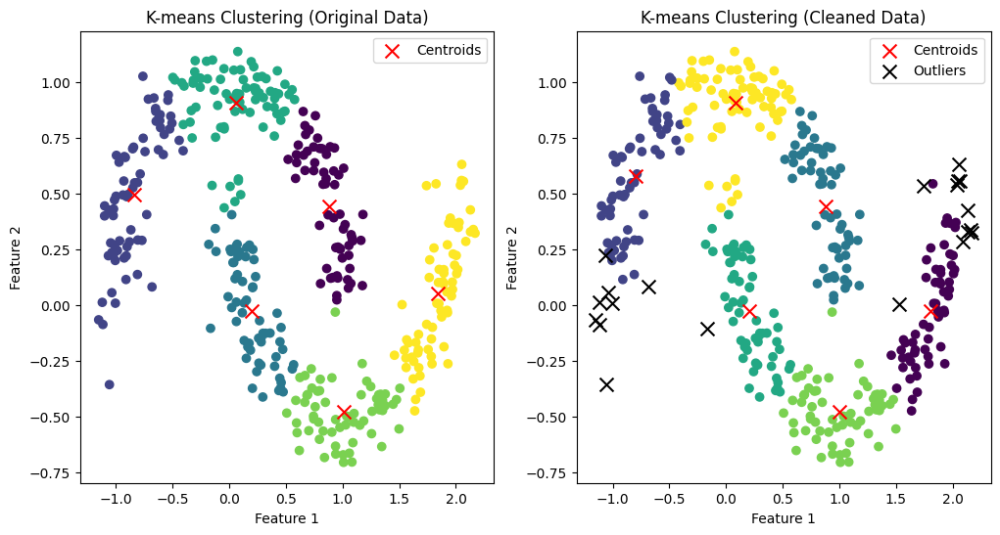

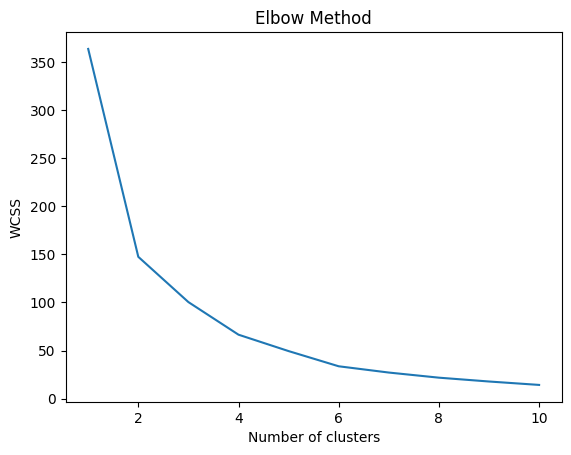

Silhouette score (original data): 0.5067917003210849
Silhouette score (cleaned data): 0.5122418684473331


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_moons
from sklearn.metrics import silhouette_score

# Generate synthetic data with noisy moons shape
data, labels = make_moons(n_samples=400, noise=0.1, random_state=42)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters_original = find_optimal_clusters_silhouette(data, max_clusters)
optimal_clusters_cleaned = find_optimal_clusters_silhouette(cleaned_data, max_clusters)
optimal_clusters_original = 6
optimal_clusters_cleaned = 6

# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters_original)

# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters_cleaned)

# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

plt.show()

# Plot the elbow method for the cleaned data
plot_elbow_method(cleaned_data, max_clusters)

# Calculate the silhouette score for the original data
silhouette_score_original = silhouette_score(data, cluster_assignments_original)

# Calculate the silhouette score for the cleaned data
silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)

print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)


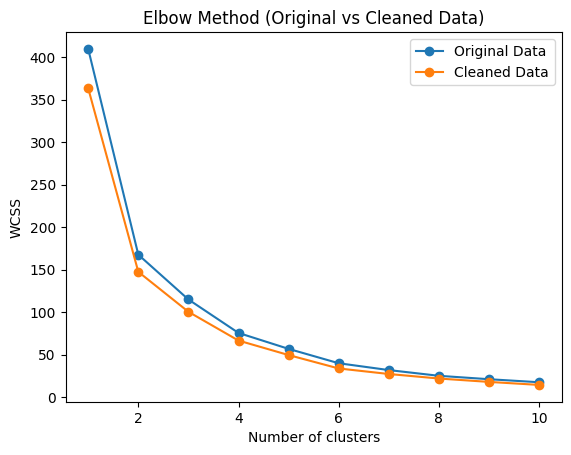

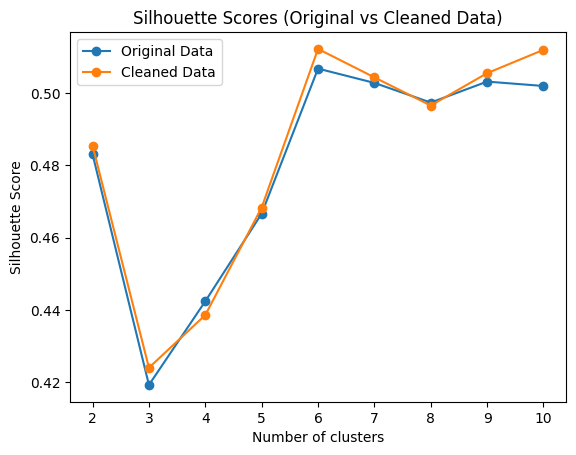

+----------------------+-----------------+----------------+
|   Number of clusters |   Original Data |   Cleaned Data |
+======================+=================+================+
|                    2 |        0.483084 |       0.485458 |
+----------------------+-----------------+----------------+
|                    3 |        0.419239 |       0.423987 |
+----------------------+-----------------+----------------+
|                    4 |        0.442396 |       0.43859  |
+----------------------+-----------------+----------------+
|                    5 |        0.46665  |       0.468346 |
+----------------------+-----------------+----------------+
|                    6 |        0.506792 |       0.512242 |
+----------------------+-----------------+----------------+
|                    7 |        0.502833 |       0.504362 |
+----------------------+-----------------+----------------+
|                    8 |        0.497392 |       0.496576 |
+----------------------+----------------

In [ ]:
# Generate synthetic data with noisy moons shape
data, labels = make_moons(n_samples=400, noise=0.1, random_state=42)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters_original = find_optimal_clusters_silhouette(data, max_clusters)
optimal_clusters_cleaned = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

# Plot the elbow method for both original and cleaned data
wcss_original = []
wcss_cleaned = []
for i in range(1, max_clusters + 1):
    kmeans_original = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_original.fit(data)
    wcss_original.append(kmeans_original.inertia_)

    kmeans_cleaned = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_cleaned.fit(cleaned_data)
    wcss_cleaned.append(kmeans_cleaned.inertia_)

plt.figure()
plt.plot(range(1, max_clusters + 1), wcss_original, label='Original Data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned Data', marker='o')
plt.title('Elbow Method (Original vs Cleaned Data)')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Calculate silhouette scores for different numbers of clusters
silhouette_scores_original = []
silhouette_scores_cleaned = []
for i in range(2, max_clusters + 1):
    cluster_assignments_original, _ = k_means_clustering(data, i)
    silhouette_scores_original.append(silhouette_score(data, cluster_assignments_original))

    cluster_assignments_cleaned, _ = k_means_clustering(cleaned_data, i)
    silhouette_scores_cleaned.append(silhouette_score(cleaned_data, cluster_assignments_cleaned))

# Plot silhouette scores for different numbers of clusters
plt.figure()
plt.plot(range(2, max_clusters + 1), silhouette_scores_original, label='Original Data', marker='o')
plt.plot(range(2, max_clusters + 1), silhouette_scores_cleaned, label='Cleaned Data', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.title('Silhouette Scores (Original vs Cleaned Data)')
plt.show()

# Print silhouette scores in a table format
table_data = [[i, score_original, score_cleaned] for i, score_original, score_cleaned in zip(range(2, max_clusters + 1), silhouette_scores_original, silhouette_scores_cleaned)]
print(tabulate(table_data, headers=['Number of clusters', 'Original Data', 'Cleaned Data'], tablefmt='grid'))


test k-mean with aniso shape

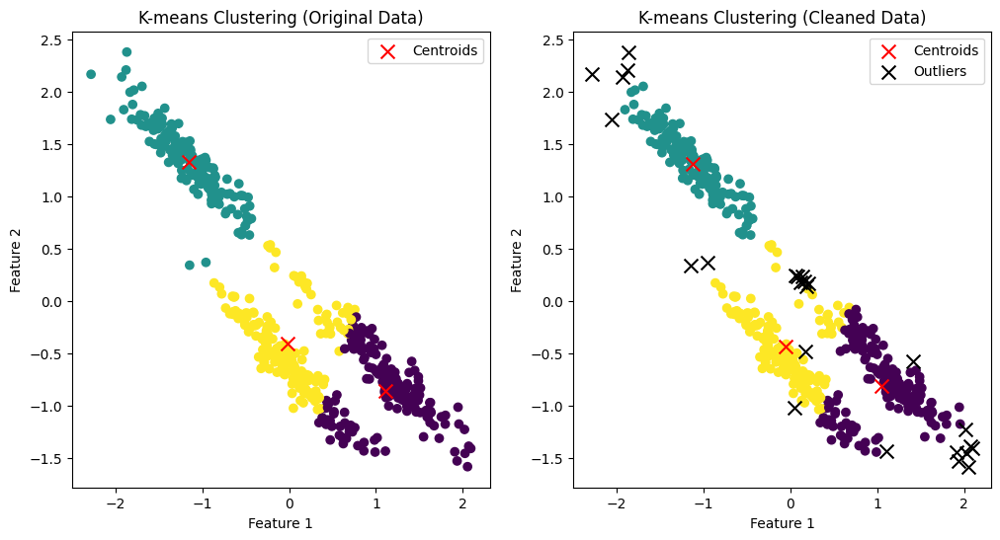

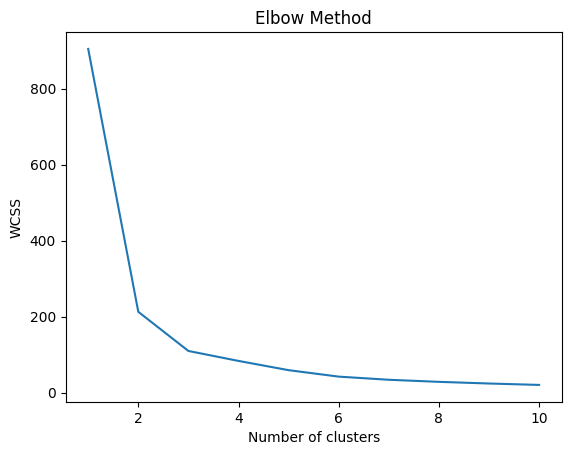

Silhouette score (original data): 0.5428418020049478
Silhouette score (cleaned data): 0.5566305195547846


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Generate synthetic data with blobs shape
data, labels = make_blobs(n_samples=400, centers=3, random_state=42, cluster_std=2.0)

# Apply a transformation to create an anisotropic shape
transformation = np.array([[0.6, -0.6], [-0.4, 0.8]])
data = np.dot(data, transformation)

# Scale the data
scaler = StandardScaler()
data = scaler.fit_transform(data)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters_original = find_optimal_clusters_silhouette(data, max_clusters)
optimal_clusters_cleaned = find_optimal_clusters_silhouette(cleaned_data, max_clusters)
optimal_clusters_original = 3
optimal_clusters_cleaned = 3

# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters_original)

# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters_cleaned)

# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

plt.show()

# Plot the elbow method for the cleaned data
plot_elbow_method(cleaned_data, max_clusters)

# Calculate the silhouette score for the original data
silhouette_score_original = silhouette_score(data, cluster_assignments_original)

# Calculate the silhouette score for the cleaned data
silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)

print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)


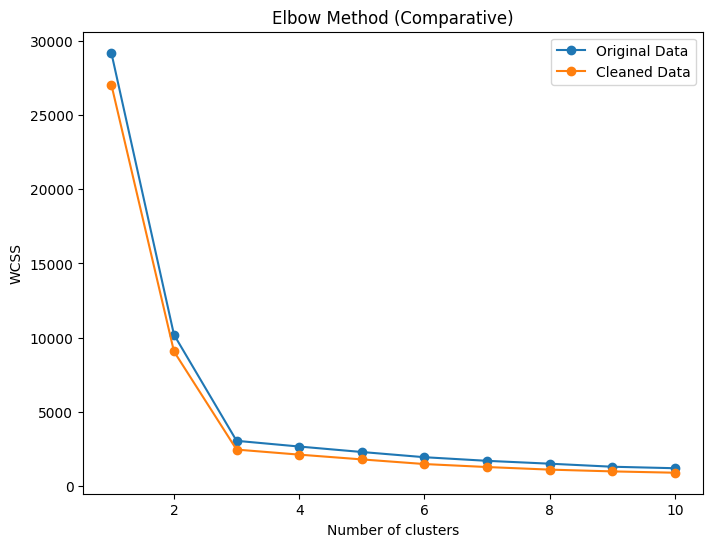

+----------------------+-----------------+----------------+
|   Number of clusters |   Original Data |   Cleaned Data |
+======================+=================+================+
|                    2 |        0.619711 |       0.635068 |
+----------------------+-----------------+----------------+
|                    3 |        0.694859 |       0.709856 |
+----------------------+-----------------+----------------+
|                    4 |        0.561043 |       0.584377 |
+----------------------+-----------------+----------------+
|                    5 |        0.449893 |       0.467704 |
+----------------------+-----------------+----------------+
|                    6 |        0.346787 |       0.364167 |
+----------------------+-----------------+----------------+
|                    7 |        0.350383 |       0.373573 |
+----------------------+-----------------+----------------+
|                    8 |        0.347376 |       0.372098 |
+----------------------+----------------

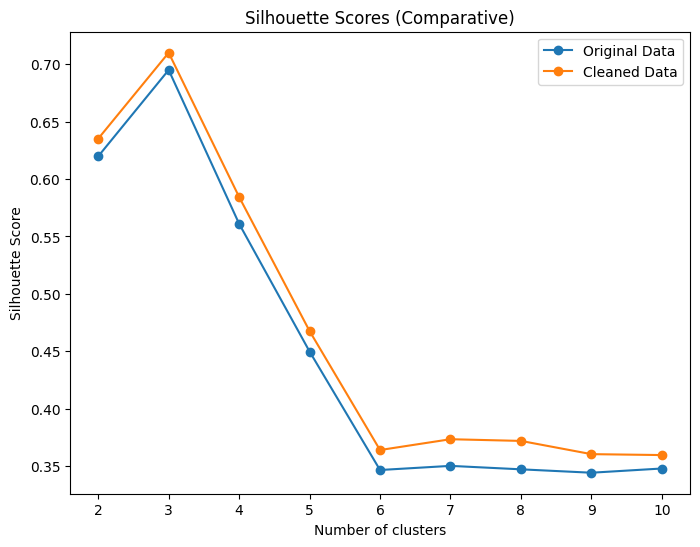

In [ ]:
# Generate synthetic data with blobs shape
data, labels = make_blobs(n_samples=400, centers=3, random_state=42, cluster_std=2.0)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters_original = find_optimal_clusters_silhouette(data, max_clusters)
optimal_clusters_cleaned = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

# Plot the elbow method for the original and cleaned data in a single graph
plt.figure(figsize=(8, 6))
wcss_original = [KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42).fit(data).inertia_ for i in range(1, max_clusters + 1)]
wcss_cleaned = [KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42).fit(cleaned_data).inertia_ for i in range(1, max_clusters + 1)]
plt.plot(range(1, max_clusters + 1), wcss_original, label='Original Data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned Data', marker='o')
plt.title('Elbow Method (Comparative)')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Calculate the silhouette score for the original and cleaned data
silhouette_scores_original = [silhouette_score(data, KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42).fit_predict(data)) for i in range(2, max_clusters + 1)]
silhouette_scores_cleaned = [silhouette_score(cleaned_data, KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42).fit_predict(cleaned_data)) for i in range(2, max_clusters + 1)]

# Print comparative silhouette scores in a table format
table_data = [[i, score_original, score_cleaned] for i, (score_original, score_cleaned) in enumerate(zip(silhouette_scores_original, silhouette_scores_cleaned), start=2)]
print(tabulate(table_data, headers=['Number of clusters', 'Original Data', 'Cleaned Data'], tablefmt='grid'))

# Plot the comparative silhouette scores in a single graph
plt.figure(figsize=(8, 6))
plt.plot(range(2, max_clusters + 1), silhouette_scores_original, label='Original Data', marker='o')
plt.plot(range(2, max_clusters + 1), silhouette_scores_cleaned, label='Cleaned Data', marker='o')
plt.title('Silhouette Scores (Comparative)')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.show()


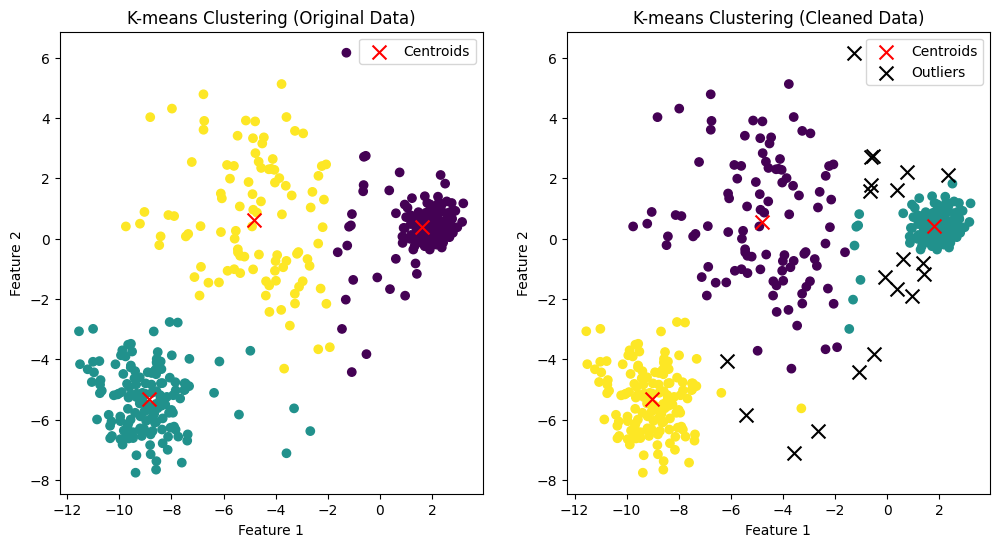

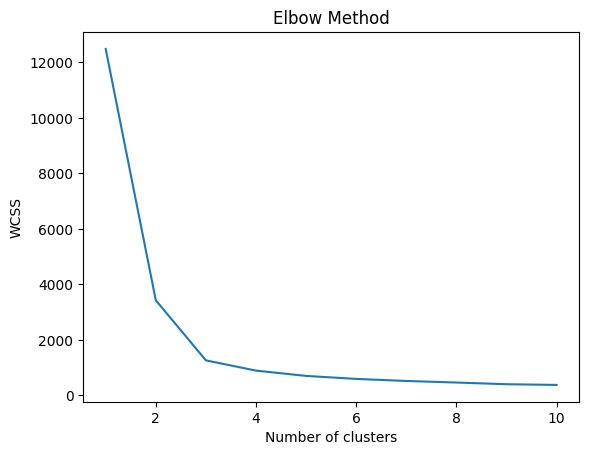

Silhouette score (original data): 0.6574595709570282
Silhouette score (cleaned data): 0.6841657894395852


In [ ]:
from sklearn.datasets import make_blobs

# Generate synthetic data with varied cluster standard deviations
data, labels = make_blobs(n_samples=400, centers=3, cluster_std=[1.0, 2.5, 0.5], random_state=170)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10
optimal_clusters = find_optimal_clusters_silhouette(cleaned_data, max_clusters)

# Apply k-means clustering to the original data
cluster_assignments_original, cluster_centroids_original = k_means_clustering(data, optimal_clusters)

# Apply k-means clustering to the cleaned data
cluster_assignments_cleaned, cluster_centroids_cleaned = k_means_clustering(cleaned_data, optimal_clusters)

# Plot the original data
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(data[:, 0], data[:, 1], c=cluster_assignments_original, cmap='viridis')
plt.scatter(cluster_centroids_original[:, 0], cluster_centroids_original[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.title('K-means Clustering (Original Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Plot the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=cluster_assignments_cleaned, cmap='viridis')
plt.scatter(cluster_centroids_cleaned[:, 0], cluster_centroids_cleaned[:, 1], c='red', marker='x', s=100, label='Centroids')
plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='black', marker='x', s=100, label='Outliers')
plt.title('K-means Clustering (Cleaned Data)')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

plt.show()

# Plot the elbow method for the cleaned data
plot_elbow_method(cleaned_data, max_clusters)

# Calculate the silhouette score for the original data
silhouette_score_original = silhouette_score(data, cluster_assignments_original)

# Calculate the silhouette score for the cleaned data
silhouette_score_cleaned = silhouette_score(cleaned_data, cluster_assignments_cleaned)

print("Silhouette score (original data):", silhouette_score_original)
print("Silhouette score (cleaned data):", silhouette_score_cleaned)


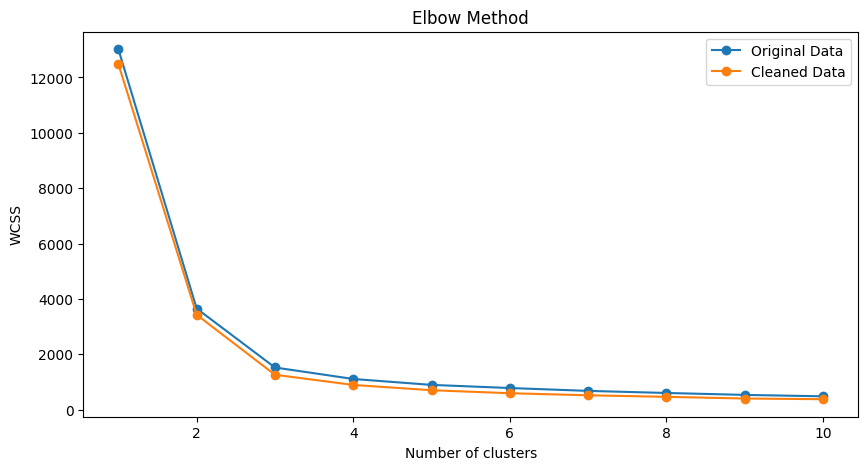

+----------------------+-----------------+----------------+
|   Number of clusters |   Original Data |   Cleaned Data |
+======================+=================+================+
|                    2 |        0.62684  |       0.632856 |
+----------------------+-----------------+----------------+
|                    3 |        0.65746  |       0.684166 |
+----------------------+-----------------+----------------+
|                    4 |        0.640302 |       0.661183 |
+----------------------+-----------------+----------------+
|                    5 |        0.626965 |       0.646385 |
+----------------------+-----------------+----------------+
|                    6 |        0.502464 |       0.527057 |
+----------------------+-----------------+----------------+
|                    7 |        0.485319 |       0.503159 |
+----------------------+-----------------+----------------+
|                    8 |        0.482554 |       0.524598 |
+----------------------+----------------

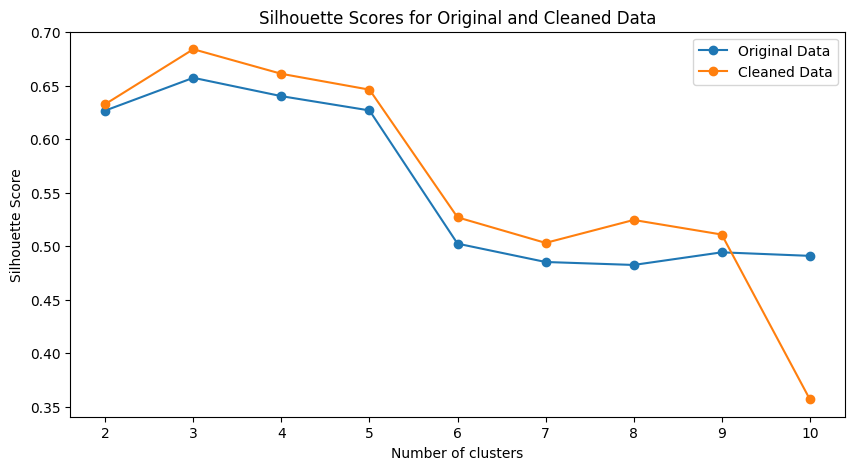

In [ ]:
from sklearn.metrics import silhouette_score
from tabulate import tabulate
# Generate synthetic data with varied cluster standard deviations
data, labels = make_blobs(n_samples=400, centers=3, cluster_std=[1.0, 2.5, 0.5], random_state=170)

# Remove outliers from the dataset
cleaned_data, cleaned_indices = remove_outliers(data, percentile=95)

# Get outlier indices
outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)

# Determine the optimal number of clusters using the Silhouette Method
max_clusters = 10

# Calculate the WCSS and silhouette scores for different cluster numbers
wcss_original = []
wcss_cleaned = []
silhouette_scores_original = []
silhouette_scores_cleaned = []
for i in range(1, max_clusters + 1):
    kmeans_original = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans_cleaned = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)

    kmeans_original.fit(data)
    kmeans_cleaned.fit(cleaned_data)

    wcss_original.append(kmeans_original.inertia_)
    wcss_cleaned.append(kmeans_cleaned.inertia_)

    if i > 1:
        cluster_assignments_original = kmeans_original.labels_
        cluster_assignments_cleaned = kmeans_cleaned.labels_

        silhouette_scores_original.append(silhouette_score(data, cluster_assignments_original))
        silhouette_scores_cleaned.append(silhouette_score(cleaned_data, cluster_assignments_cleaned))

# Plot the WCSS values for both original and cleaned data
plt.figure(figsize=(10, 5))
plt.plot(range(1, max_clusters + 1), wcss_original, label='Original Data', marker='o')
plt.plot(range(1, max_clusters + 1), wcss_cleaned, label='Cleaned Data', marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.legend()
plt.show()

# Print silhouette scores in a table format
table_data = []
for i in range(max_clusters - 1):
    table_data.append([i + 2, silhouette_scores_original[i], silhouette_scores_cleaned[i]])

print(tabulate(table_data, headers=['Number of clusters', 'Original Data', 'Cleaned Data'], tablefmt='grid'))

# Plot silhouette scores for different numbers of clusters
plt.figure(figsize=(10, 5))
plt.plot(range(2, max_clusters + 1), silhouette_scores_original, label='Original Data', marker='o')
plt.plot(range(2, max_clusters + 1), silhouette_scores_cleaned, label='Cleaned Data', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.title("Silhouette Scores for Original and Cleaned Data")
plt.show()


Hierarchical Clustering(ward)

In [ ]:
def plot_dendrogram(linkage_matrix, **kwargs):
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

def hierarchical_clustering(data, n_clusters, linkage_method='ward', plot_dendro=False):
    # Compute the linkage matrix
    linkage_matrix = linkage(data, method=linkage_method)

    # Create an instance of AgglomerativeClustering with the desired number of clusters and linkage method
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_method, distance_threshold=None)

    # Fit the model to the data
    model = model.fit(data)

    if plot_dendro:
        plt.figure(figsize=(12, 6))
        plot_dendrogram(linkage_matrix, truncate_mode='level', p=400)
        plt.xlabel("Index of data points")
        plt.ylabel("Euclidean distance")
        plt.show()

    # Return the cluster labels for each data point
    return model.labels_

# Visualization function
def plot_clusters(data, cleaned_data, cleaned_indices, labels):
    plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=labels, cmap='viridis', s=10)

    outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)
    plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='red', marker='x', s=50, label='Outliers')

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

test with various synthesis data

Dataset 1:
Without eliminating outliers:


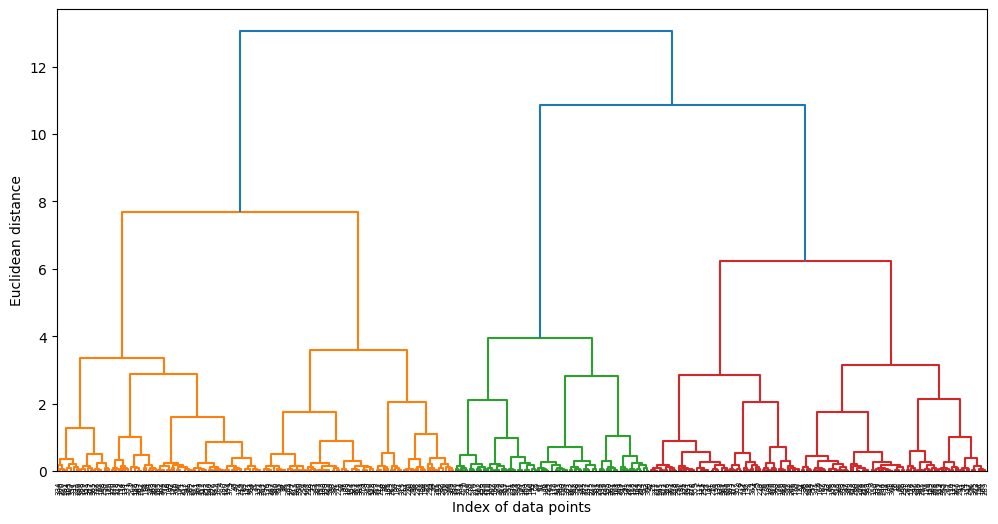

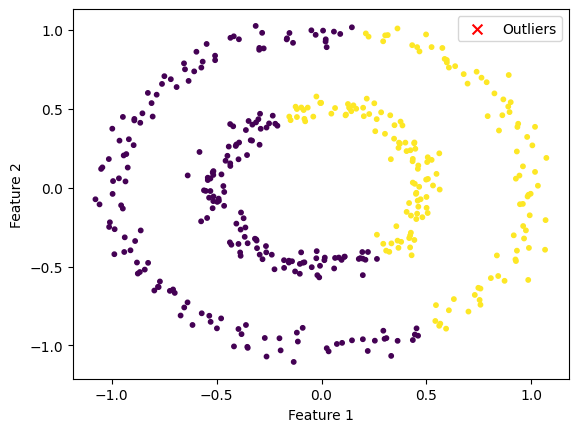

Silhouette Score: 0.3282
With eliminating outliers:


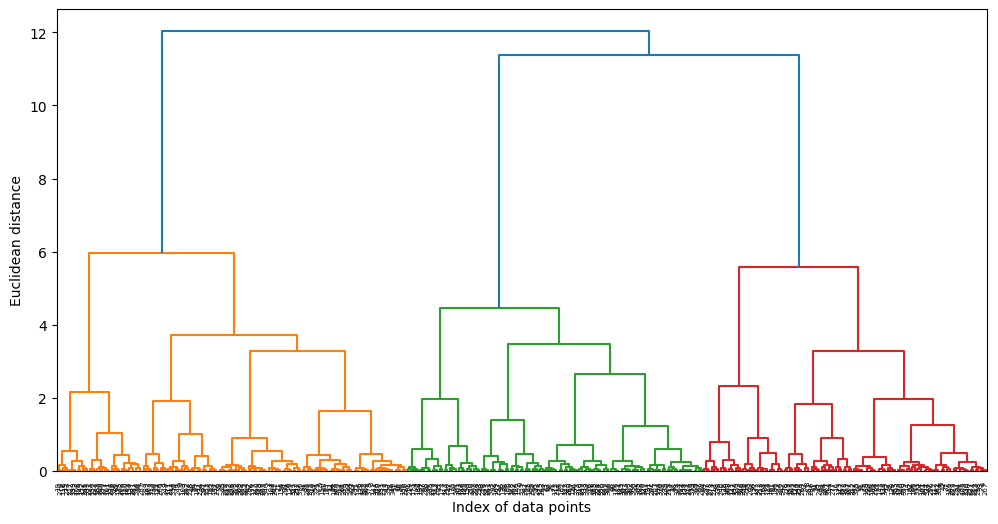

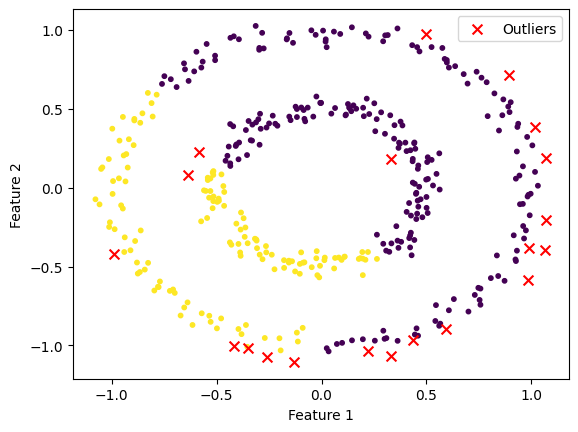

Silhouette Score: 0.3092
Dataset 2:
Without eliminating outliers:


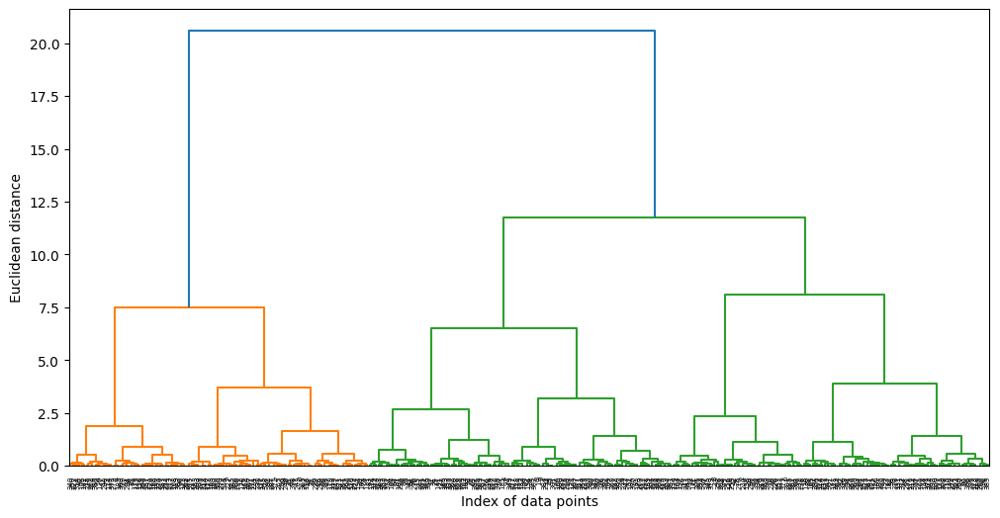

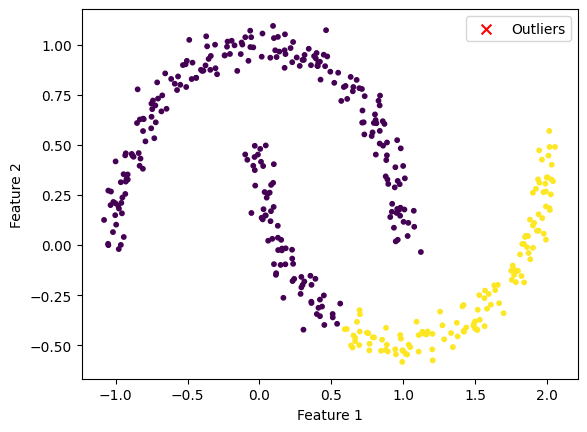

Silhouette Score: 0.4483
With eliminating outliers:


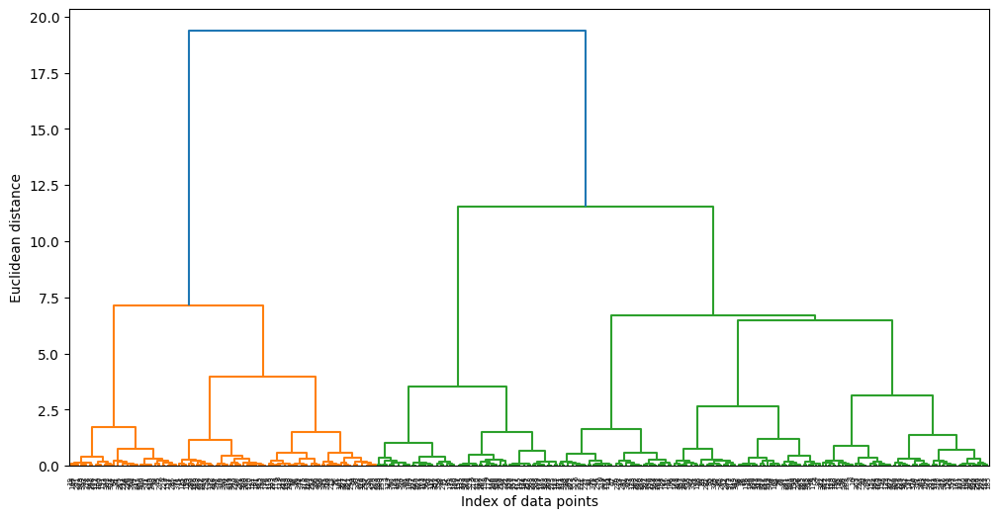

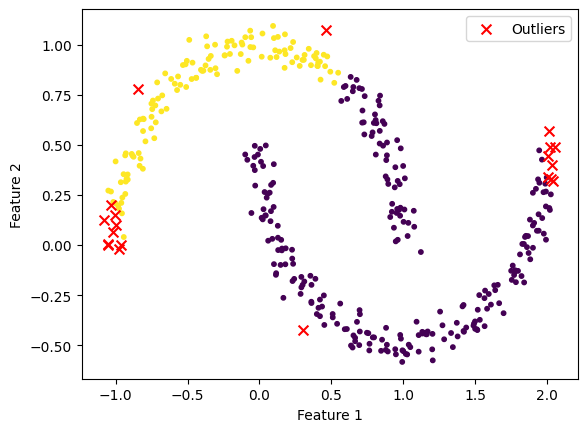

Silhouette Score: 0.4424
Dataset 3:
Without eliminating outliers:


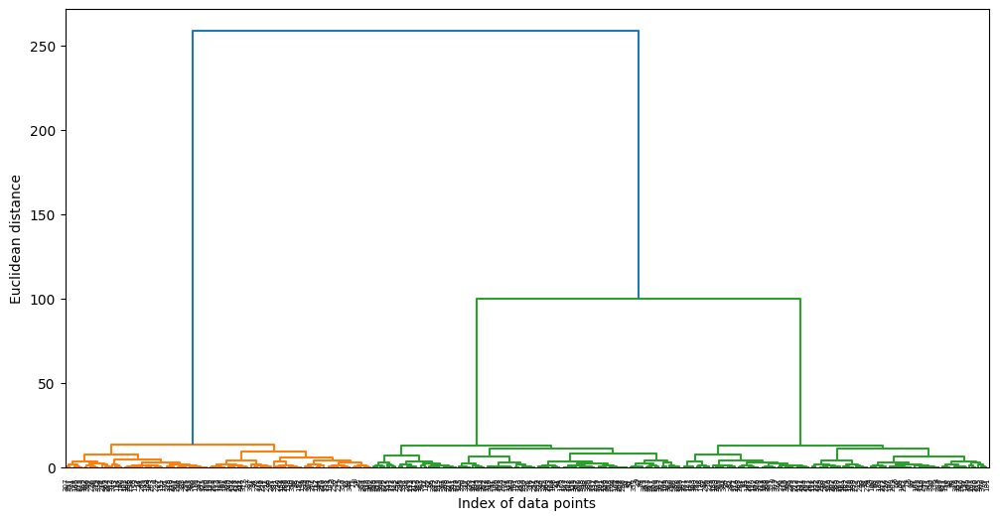

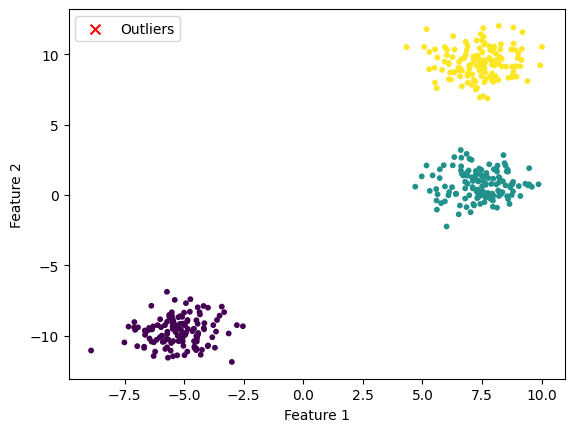

Silhouette Score: 0.8212
With eliminating outliers:


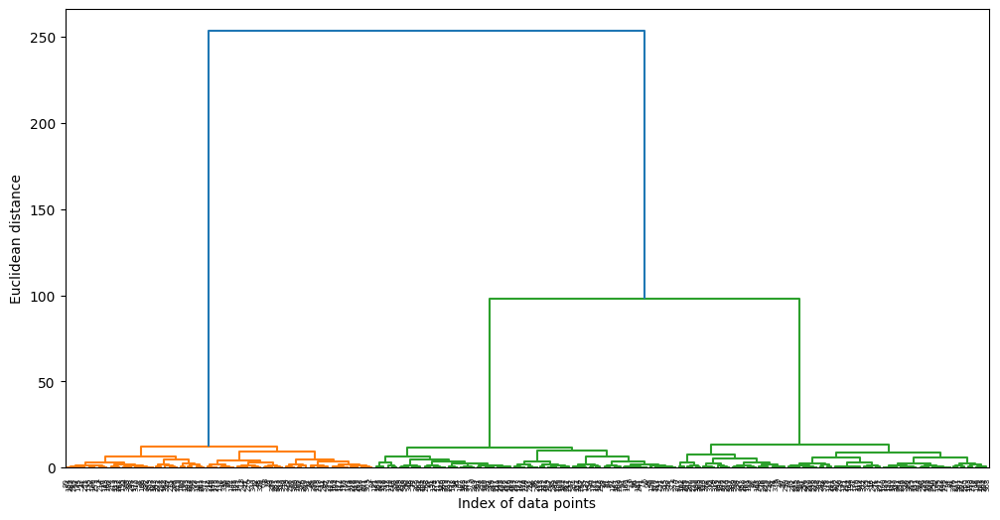

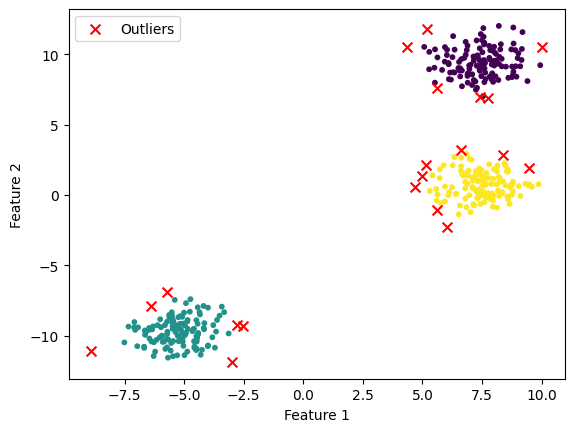

Silhouette Score: 0.8340
Dataset 4:
Without eliminating outliers:


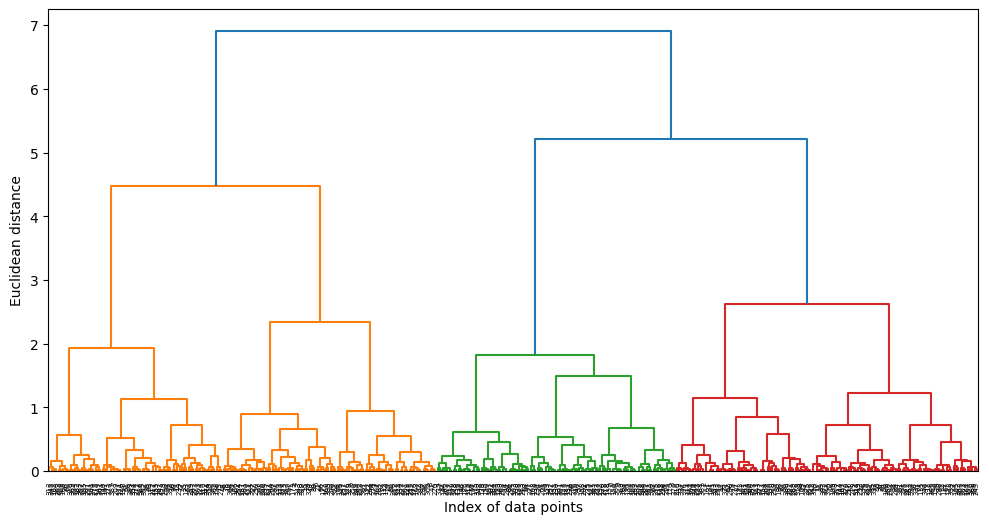

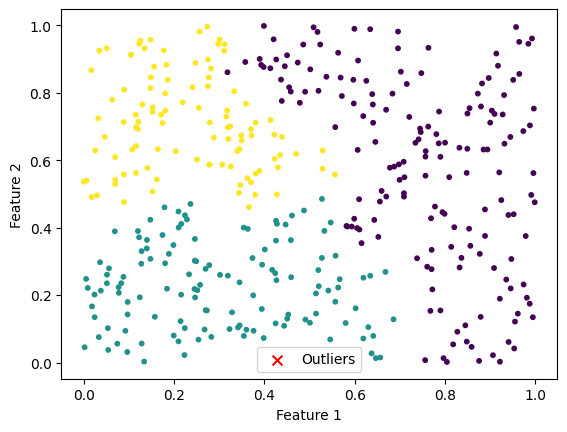

Silhouette Score: 0.3473
With eliminating outliers:


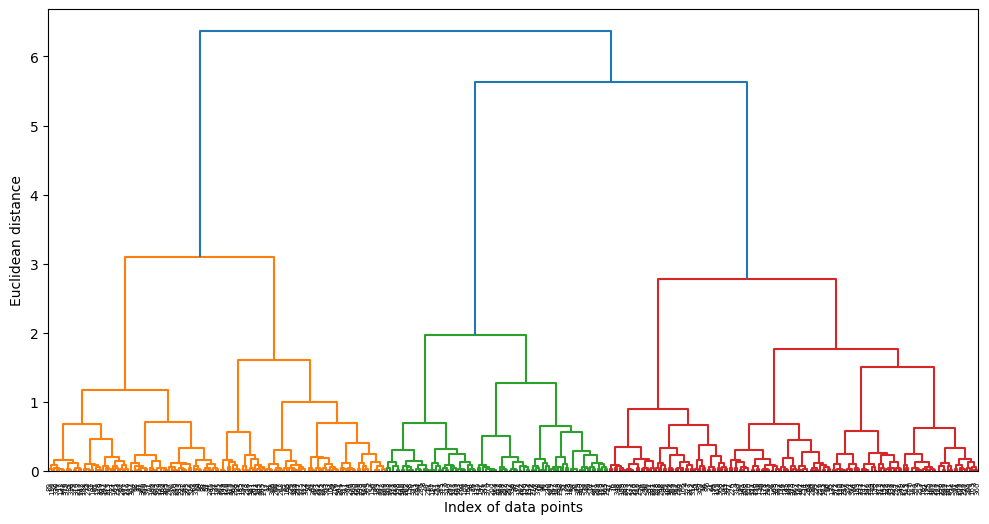

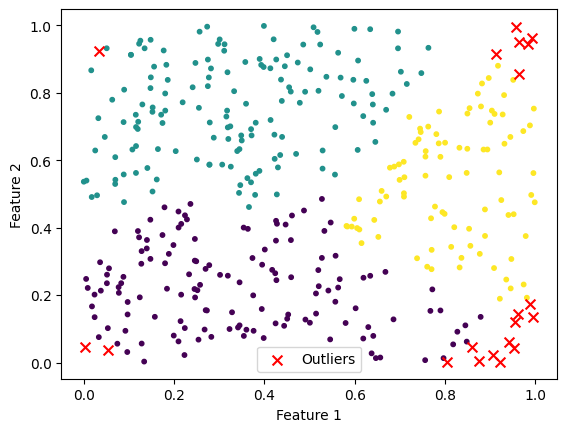

Silhouette Score: 0.3998
Dataset 5:
Without eliminating outliers:


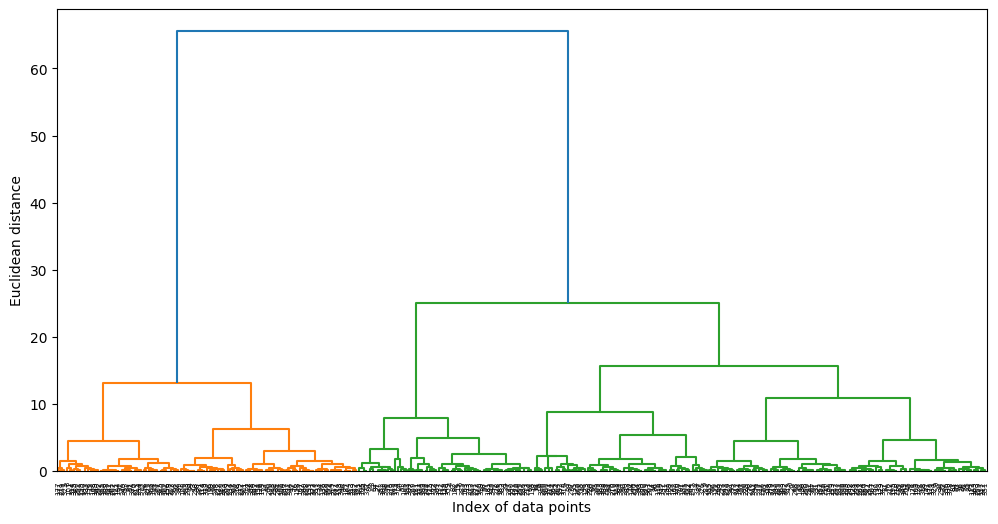

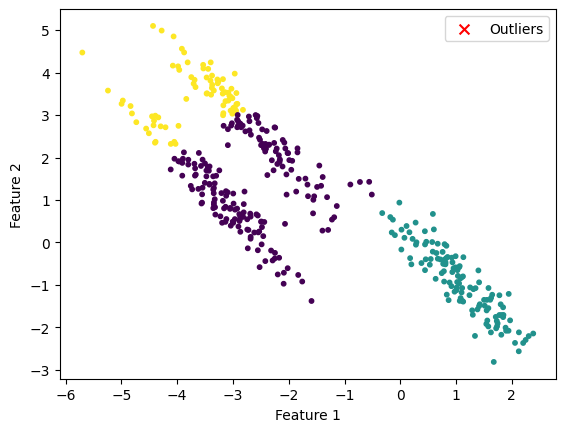

Silhouette Score: 0.5020
With eliminating outliers:


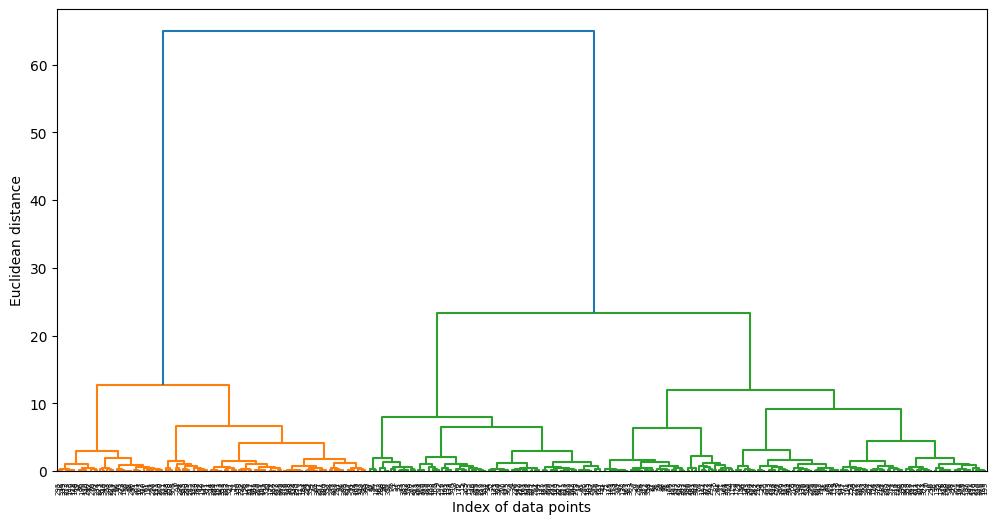

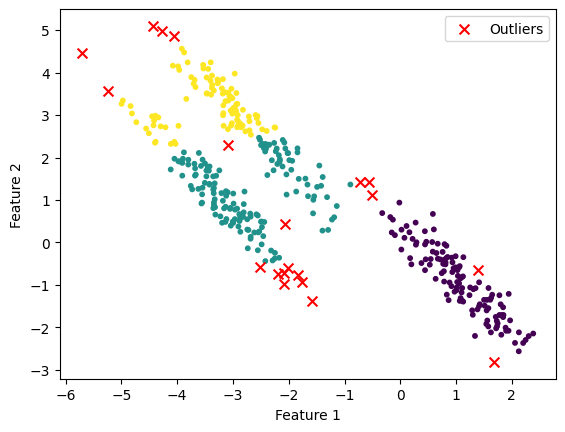

Silhouette Score: 0.5395
Dataset 6:
Without eliminating outliers:


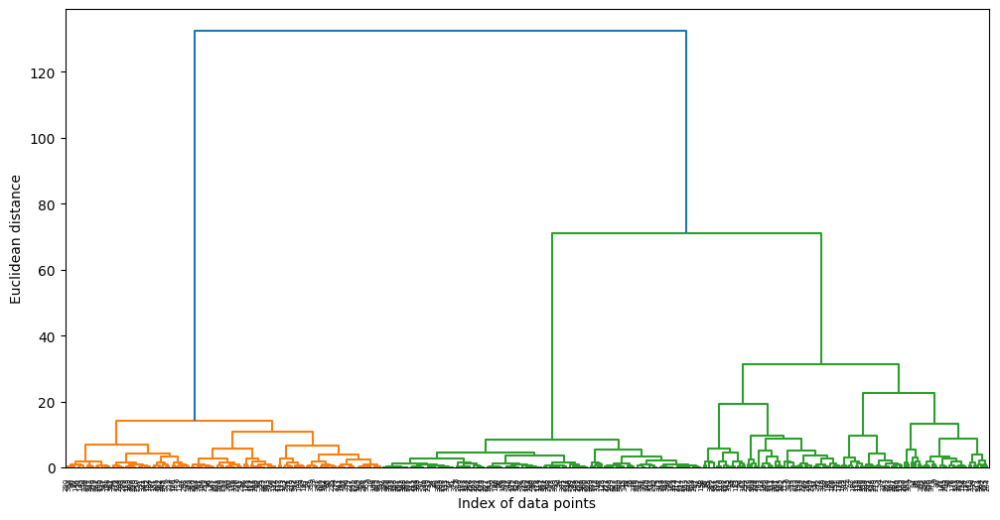

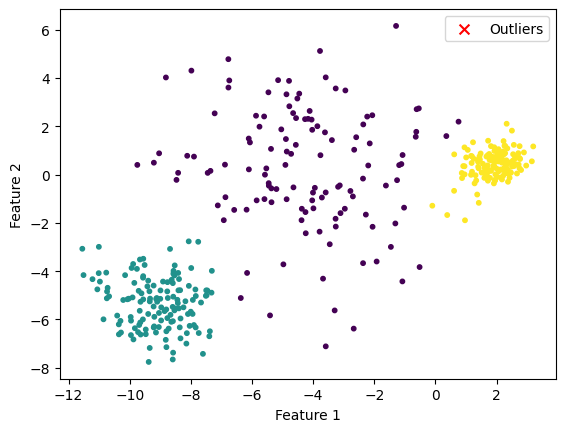

Silhouette Score: 0.6320
With eliminating outliers:


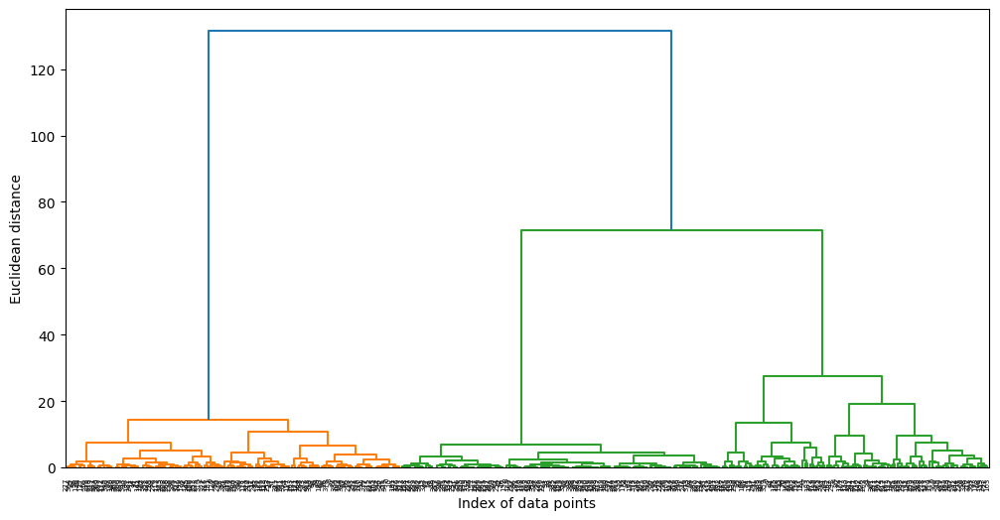

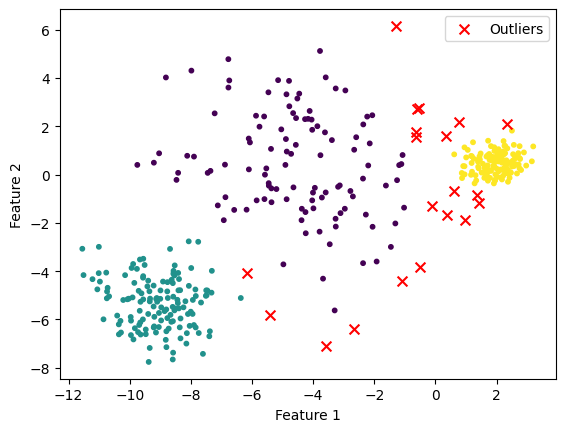

Silhouette Score: 0.6821


In [ ]:
import numpy as np
from sklearn import datasets
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Generate datasets
n_samples = 400
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

datasets = [noisy_circles, noisy_moons, blobs, no_structure, aniso, varied]

# Loop through each dataset, perform clustering, and visualize the results
for i, dataset in enumerate(datasets):
    print(f"Dataset {i + 1}:")
    X, y = dataset

    # Set a flag to indicate whether the dataset is either noisy_circles or noisy_moons
    is_noisy_circles_or_moons = i in [0, 1]

    # Set n_clusters to 2 if the dataset is either noisy_circles or noisy_moons, otherwise 3
    n_clusters = 2 if is_noisy_circles_or_moons else 3

    print("Without eliminating outliers:")
    labels_without_outliers_removed = hierarchical_clustering(X, n_clusters=n_clusters, linkage_method='ward', plot_dendro=True)
    plot_clusters(X, X, np.arange(X.shape[0]), labels_without_outliers_removed)
    silhouette_score_without_outliers_removed = silhouette_score(X, labels_without_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_without_outliers_removed:.4f}")

    print("With eliminating outliers:")
    cleaned_data, cleaned_indices = remove_outliers(X, percentile=95)
    labels_with_outliers_removed = hierarchical_clustering(cleaned_data, n_clusters=n_clusters, linkage_method='ward',plot_dendro=True)

    plot_clusters(X, cleaned_data, cleaned_indices, labels_with_outliers_removed)
    silhouette_score_with_outliers_removed = silhouette_score(cleaned_data, labels_with_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_with_outliers_removed:.4f}")

Hierarchical Clustering(single)

In [ ]:
def plot_dendrogram(linkage_matrix, **kwargs):
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
def hierarchical_clustering(data, n_clusters, linkage_method='single', plot_dendro=False):
    # Compute the linkage matrix
    linkage_matrix = linkage(data, method=linkage_method)
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_method, distance_threshold=None)
    # Fit the model to the data
    model = model.fit(data)
    if plot_dendro:
        plt.figure(figsize=(12, 6))
        plot_dendrogram(linkage_matrix, truncate_mode='level', p=400)
        plt.xlabel("Index of data points")
        plt.ylabel("Euclidean distance")
        plt.show()
    # Return the cluster labels for each data point
    return model.labels_
# Visualization function
def plot_clusters(data, cleaned_data, cleaned_indices, labels):
    plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=labels, cmap='viridis', s=10)

    outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)
    plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='red', marker='x', s=50, label='Outliers')

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

Dataset 1:
Without eliminating outliers:


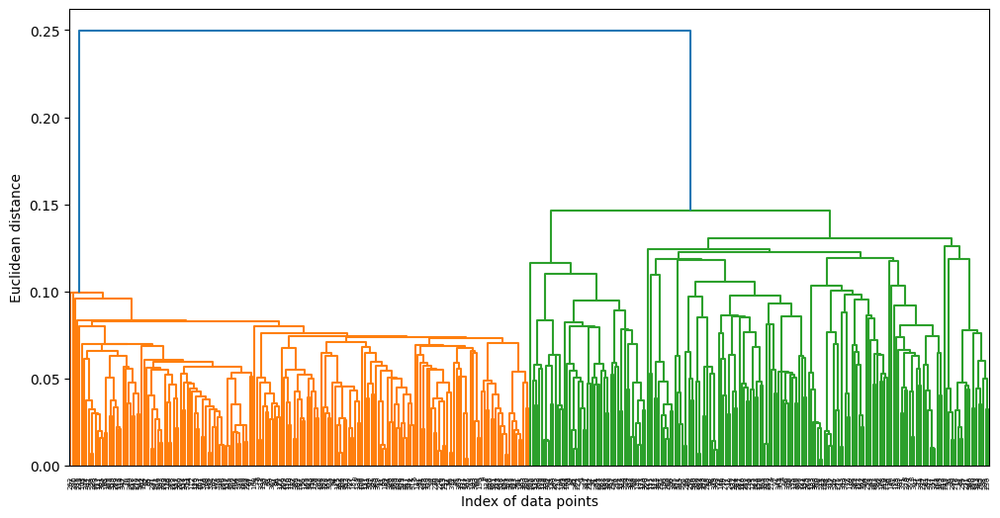

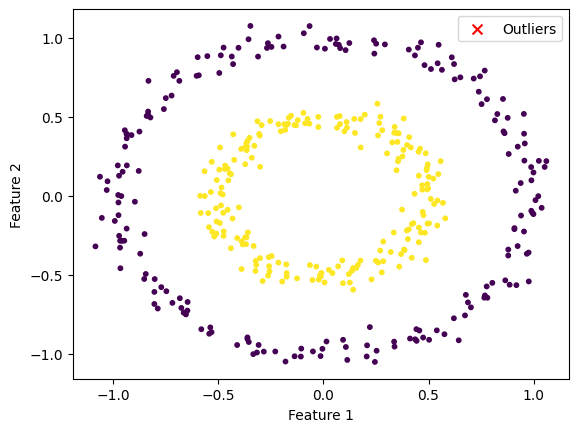

Silhouette Score: 0.1103
With eliminating outliers:


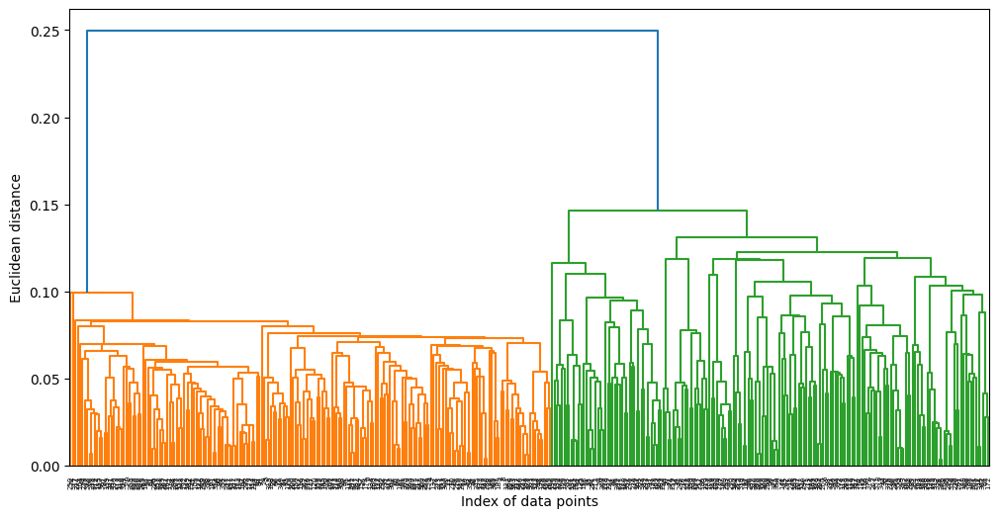

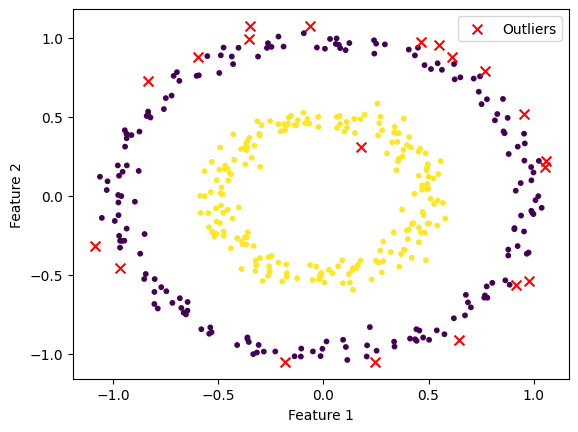

Silhouette Score: 0.1213
Dataset 2:
Without eliminating outliers:


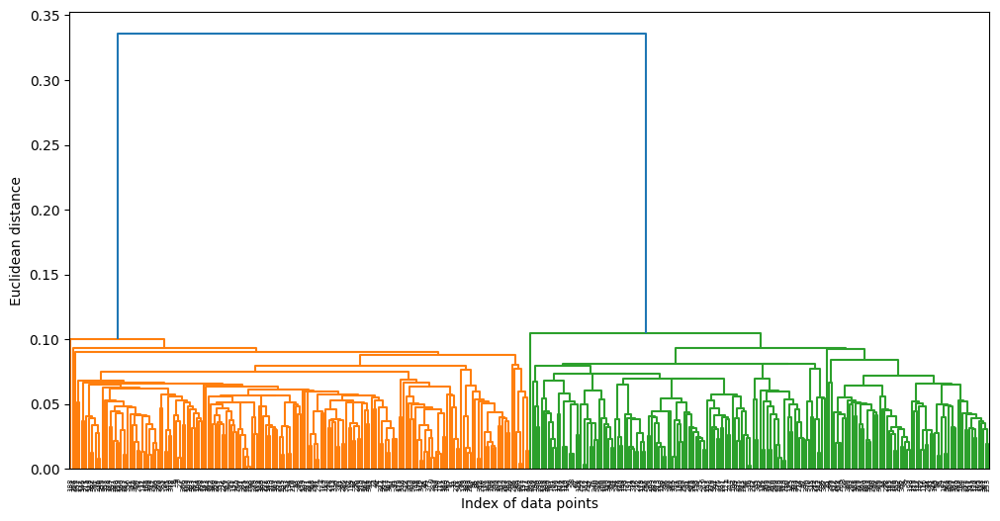

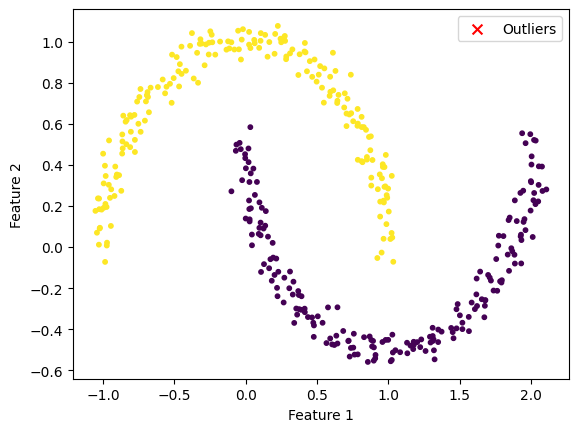

Silhouette Score: 0.3281
With eliminating outliers:


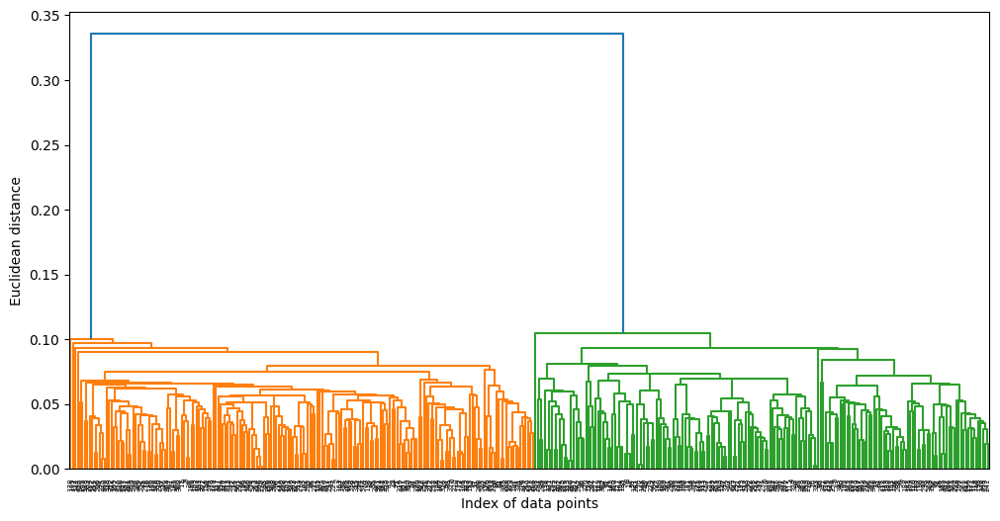

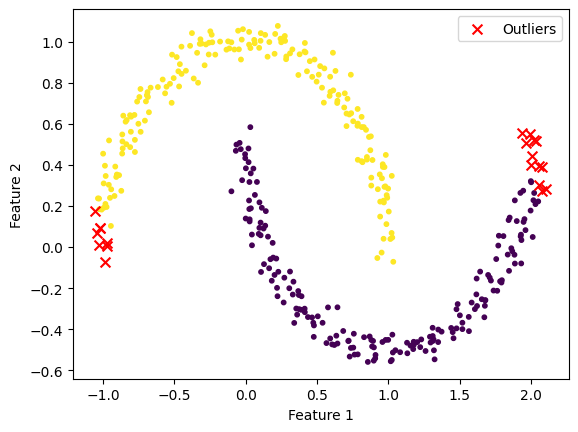

Silhouette Score: 0.3325
Dataset 3:
Without eliminating outliers:


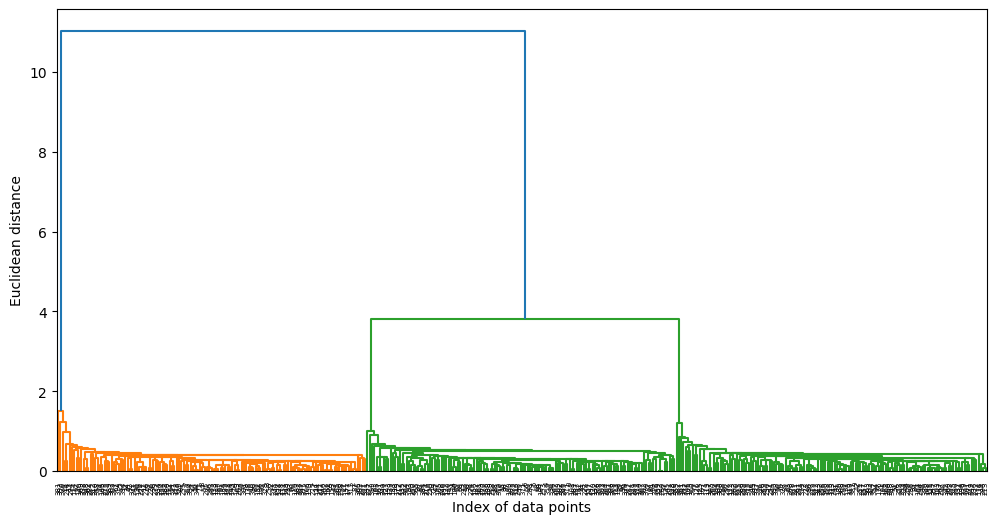

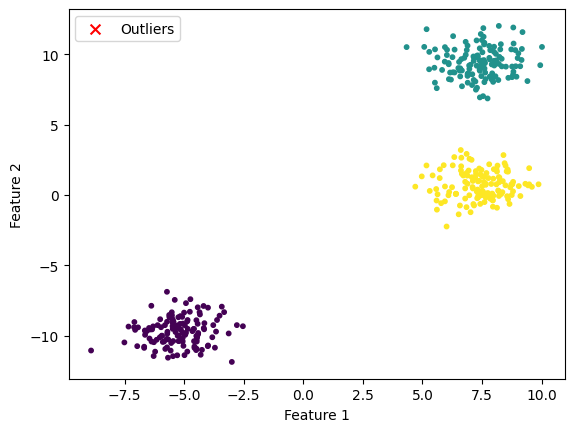

Silhouette Score: 0.8212
With eliminating outliers:


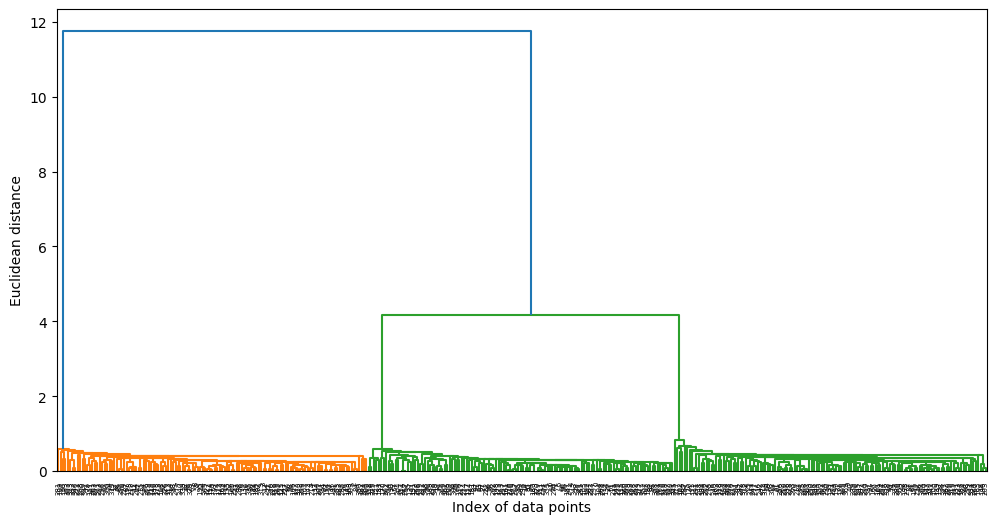

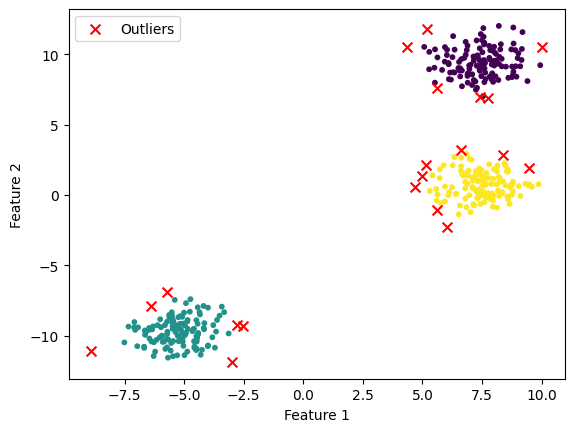

Silhouette Score: 0.8340
Dataset 4:
Without eliminating outliers:


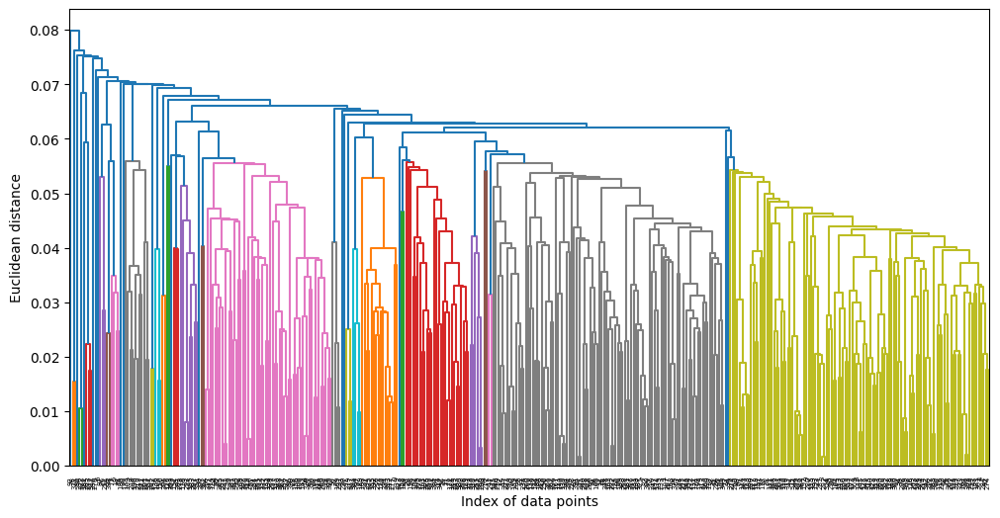

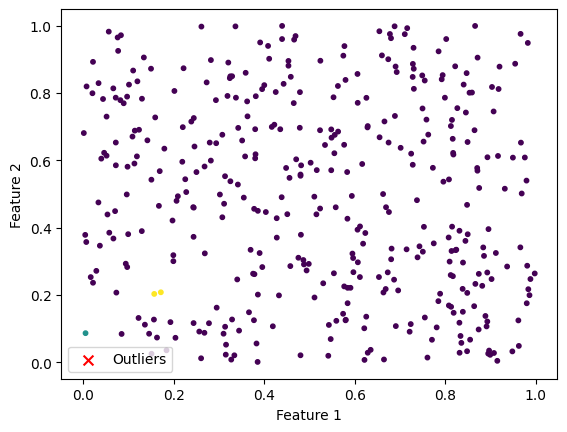

Silhouette Score: 0.0368
With eliminating outliers:


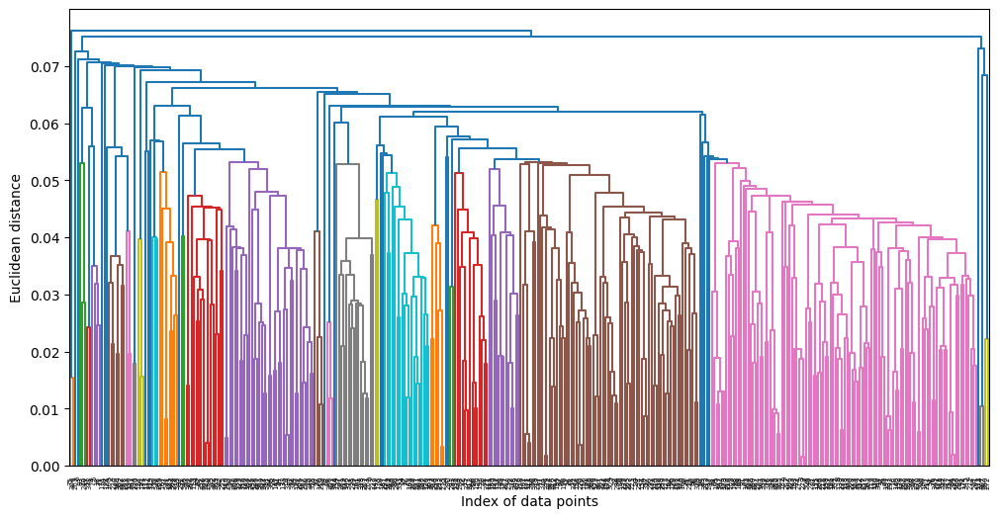

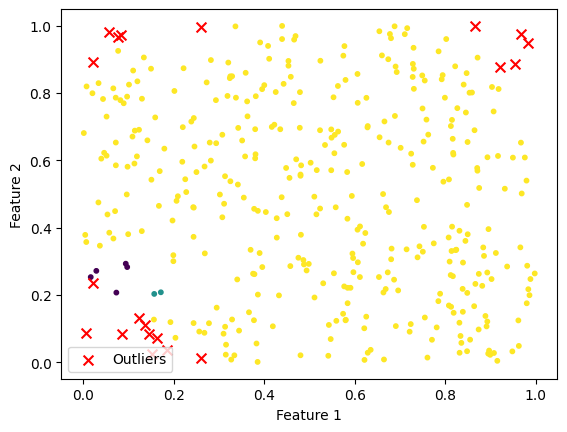

Silhouette Score: 0.0673
Dataset 5:
Without eliminating outliers:


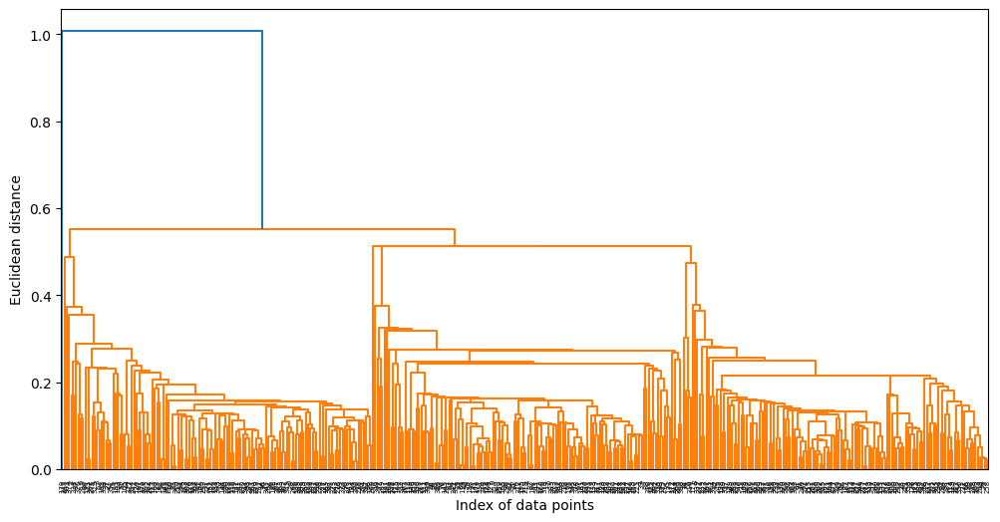

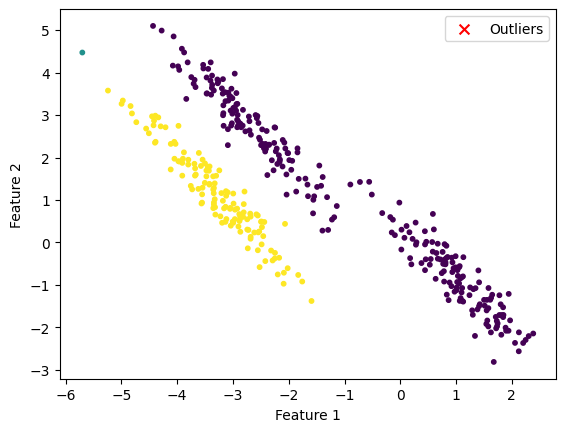

Silhouette Score: 0.1529
With eliminating outliers:


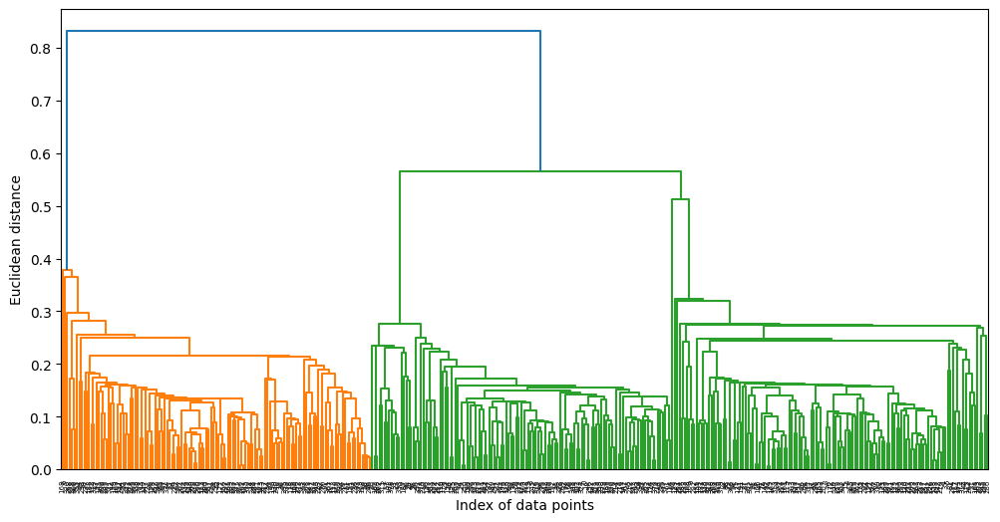

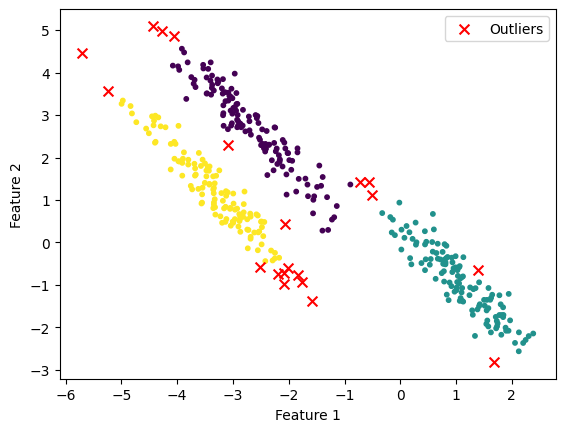

Silhouette Score: 0.4928
Dataset 6:
Without eliminating outliers:


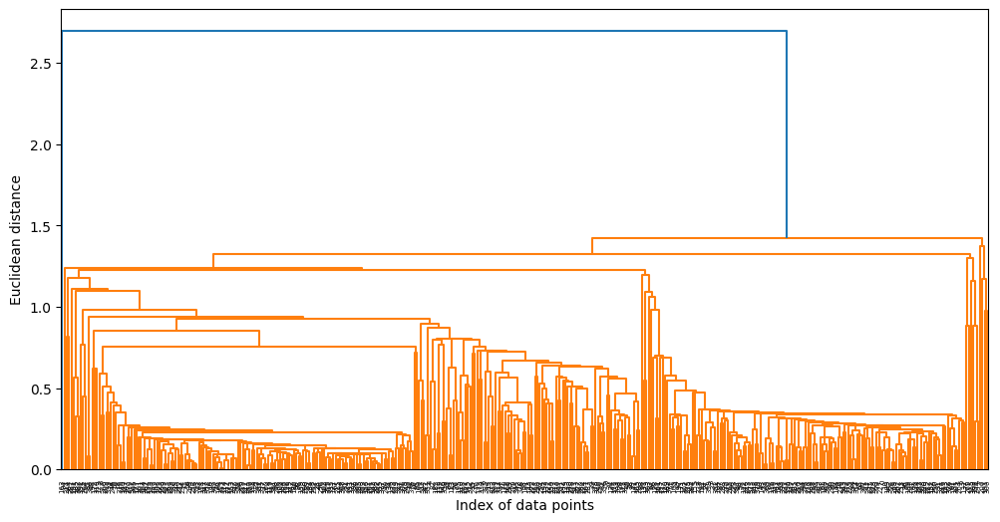

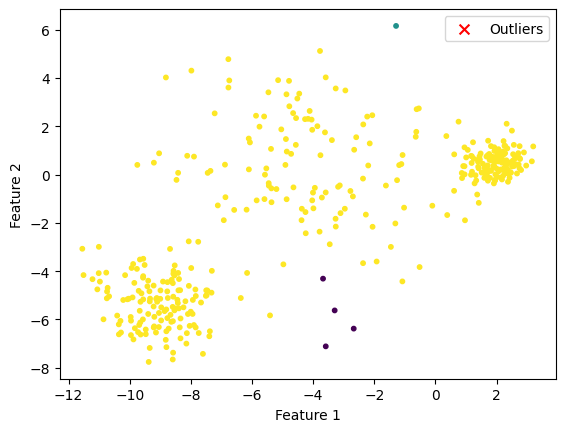

Silhouette Score: -0.1165
With eliminating outliers:


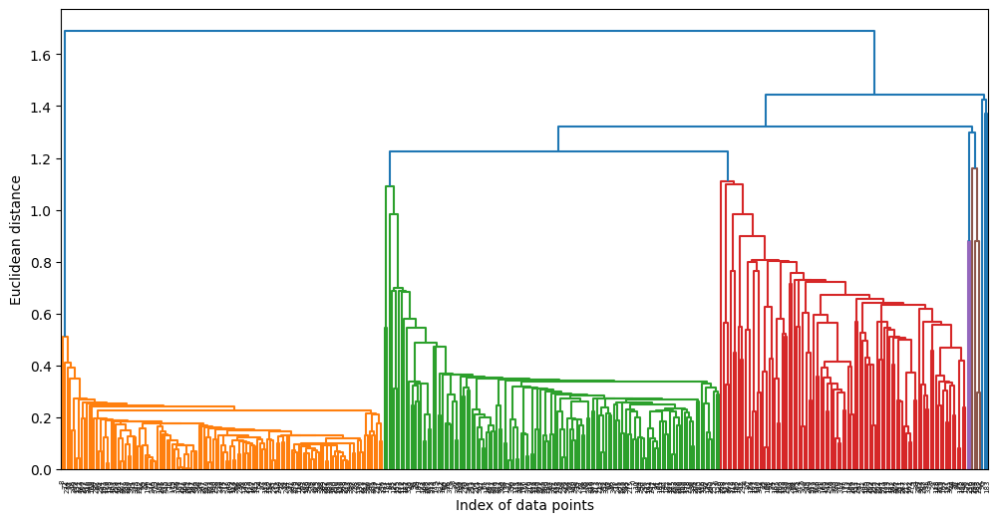

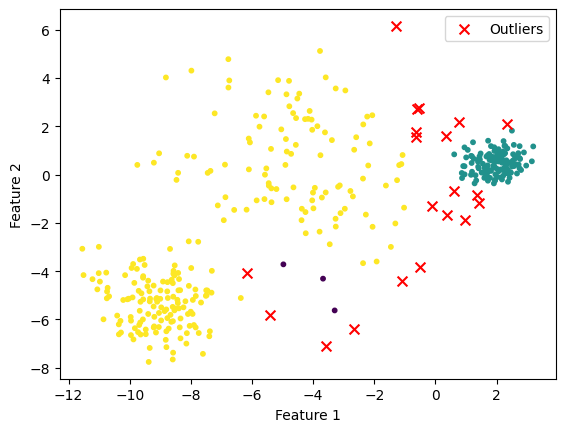

Silhouette Score: 0.3301


In [ ]:
import numpy as np
from sklearn import datasets
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Generate datasets
n_samples = 400
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

datasets = [noisy_circles, noisy_moons, blobs, no_structure, aniso, varied]

# Loop through each dataset, perform clustering, and visualize the results
for i, dataset in enumerate(datasets):
    print(f"Dataset {i + 1}:")
    X, y = dataset

    # Set a flag to indicate whether the dataset is either noisy_circles or noisy_moons
    is_noisy_circles_or_moons = i in [0, 1]


    n_clusters = 2 if is_noisy_circles_or_moons else 3

    print("Without eliminating outliers:")
    labels_without_outliers_removed = hierarchical_clustering(X, n_clusters=n_clusters, linkage_method='single', plot_dendro=True)
    plot_clusters(X, X, np.arange(X.shape[0]), labels_without_outliers_removed)
    silhouette_score_without_outliers_removed = silhouette_score(X, labels_without_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_without_outliers_removed:.4f}")

    print("With eliminating outliers:")
    cleaned_data, cleaned_indices = remove_outliers(X, percentile=95)
    labels_with_outliers_removed = hierarchical_clustering(cleaned_data, n_clusters=n_clusters, linkage_method='single',plot_dendro=True)

    plot_clusters(X, cleaned_data, cleaned_indices, labels_with_outliers_removed)
    silhouette_score_with_outliers_removed = silhouette_score(cleaned_data, labels_with_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_with_outliers_removed:.4f}")

Dataset 1:
Number of clusters: 2
Without eliminating outliers:
Silhouette Score: 0.1103
With eliminating outliers:
Silhouette Score: 0.1213
Number of clusters: 3
Without eliminating outliers:
Silhouette Score: 0.1427
With eliminating outliers:
Silhouette Score: 0.1413
Number of clusters: 4
Without eliminating outliers:
Silhouette Score: 0.1154
With eliminating outliers:
Silhouette Score: 0.1116
Number of clusters: 5
Without eliminating outliers:
Silhouette Score: 0.0690
With eliminating outliers:
Silhouette Score: 0.1708
Number of clusters: 6
Without eliminating outliers:
Silhouette Score: -0.0145
With eliminating outliers:
Silhouette Score: 0.1640
Number of clusters: 7
Without eliminating outliers:
Silhouette Score: 0.0526
With eliminating outliers:
Silhouette Score: 0.1344
Number of clusters: 8
Without eliminating outliers:
Silhouette Score: 0.0867
With eliminating outliers:
Silhouette Score: 0.0923
Number of clusters: 9
Without eliminating outliers:
Silhouette Score: 0.0678
With eli

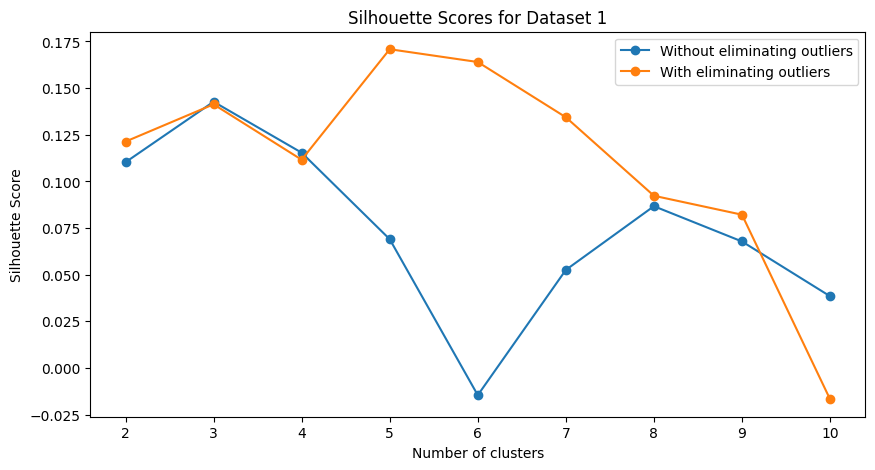

Dataset 2:
Number of clusters: 2
Without eliminating outliers:
Silhouette Score: 0.3281
With eliminating outliers:
Silhouette Score: 0.3325
Number of clusters: 3
Without eliminating outliers:
Silhouette Score: -0.0381
With eliminating outliers:
Silhouette Score: -0.0359
Number of clusters: 4
Without eliminating outliers:
Silhouette Score: -0.1458
With eliminating outliers:
Silhouette Score: -0.1430
Number of clusters: 5
Without eliminating outliers:
Silhouette Score: -0.3790
With eliminating outliers:
Silhouette Score: -0.2024
Number of clusters: 6
Without eliminating outliers:
Silhouette Score: -0.1820
With eliminating outliers:
Silhouette Score: -0.4429
Number of clusters: 7
Without eliminating outliers:
Silhouette Score: -0.2336
With eliminating outliers:
Silhouette Score: -0.2397
Number of clusters: 8
Without eliminating outliers:
Silhouette Score: -0.2402
With eliminating outliers:
Silhouette Score: -0.2772
Number of clusters: 9
Without eliminating outliers:
Silhouette Score: -0.2

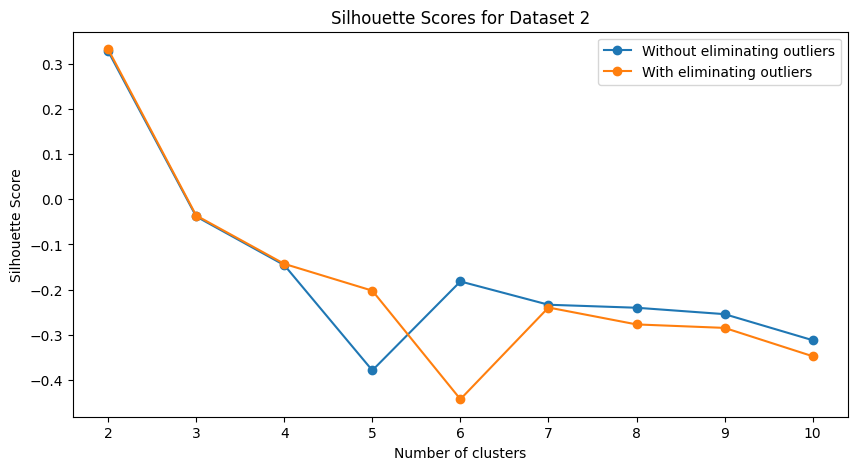

Dataset 3:
Number of clusters: 2
Without eliminating outliers:
Silhouette Score: 0.7826
With eliminating outliers:
Silhouette Score: 0.7877
Number of clusters: 3
Without eliminating outliers:
Silhouette Score: 0.8212
With eliminating outliers:
Silhouette Score: 0.8340
Number of clusters: 4
Without eliminating outliers:
Silhouette Score: 0.7034
With eliminating outliers:
Silhouette Score: 0.6662
Number of clusters: 5
Without eliminating outliers:
Silhouette Score: 0.6494
With eliminating outliers:
Silhouette Score: 0.6505
Number of clusters: 6
Without eliminating outliers:
Silhouette Score: 0.5256
With eliminating outliers:
Silhouette Score: 0.6011
Number of clusters: 7
Without eliminating outliers:
Silhouette Score: 0.4066
With eliminating outliers:
Silhouette Score: 0.5474
Number of clusters: 8
Without eliminating outliers:
Silhouette Score: 0.3255
With eliminating outliers:
Silhouette Score: 0.5418
Number of clusters: 9
Without eliminating outliers:
Silhouette Score: 0.2331
With elim

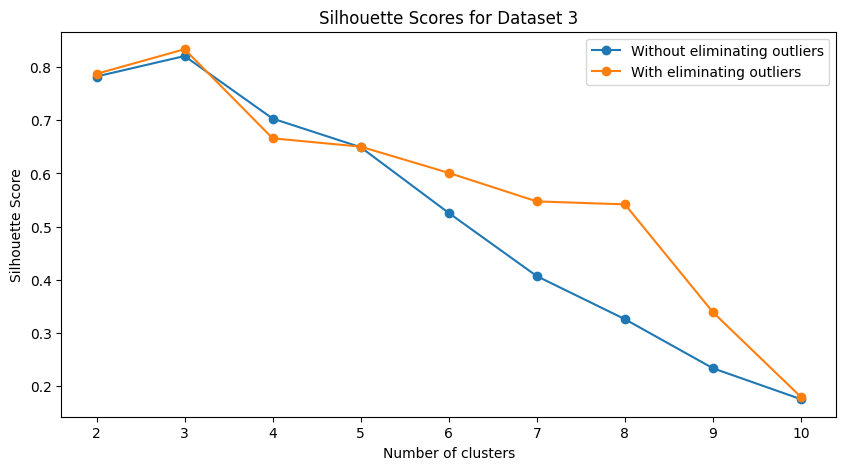

Dataset 4:
Number of clusters: 2
Without eliminating outliers:
Silhouette Score: 0.2183
With eliminating outliers:
Silhouette Score: 0.0644
Number of clusters: 3
Without eliminating outliers:
Silhouette Score: 0.0368
With eliminating outliers:
Silhouette Score: 0.0673
Number of clusters: 4
Without eliminating outliers:
Silhouette Score: -0.1537
With eliminating outliers:
Silhouette Score: 0.0596
Number of clusters: 5
Without eliminating outliers:
Silhouette Score: -0.1378
With eliminating outliers:
Silhouette Score: -0.1383
Number of clusters: 6
Without eliminating outliers:
Silhouette Score: -0.2400
With eliminating outliers:
Silhouette Score: -0.4281
Number of clusters: 7
Without eliminating outliers:
Silhouette Score: -0.2483
With eliminating outliers:
Silhouette Score: -0.4396
Number of clusters: 8
Without eliminating outliers:
Silhouette Score: -0.4709
With eliminating outliers:
Silhouette Score: -0.4816
Number of clusters: 9
Without eliminating outliers:
Silhouette Score: -0.4622

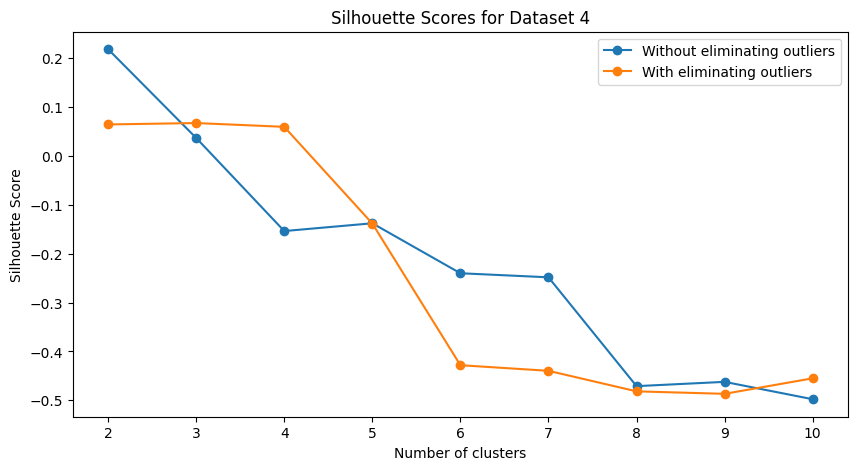

Dataset 5:
Number of clusters: 2
Without eliminating outliers:
Silhouette Score: 0.3015
With eliminating outliers:
Silhouette Score: 0.6728
Number of clusters: 3
Without eliminating outliers:
Silhouette Score: 0.1529
With eliminating outliers:
Silhouette Score: 0.4928
Number of clusters: 4
Without eliminating outliers:
Silhouette Score: -0.0613
With eliminating outliers:
Silhouette Score: 0.3671
Number of clusters: 5
Without eliminating outliers:
Silhouette Score: 0.2949
With eliminating outliers:
Silhouette Score: 0.3057
Number of clusters: 6
Without eliminating outliers:
Silhouette Score: 0.2449
With eliminating outliers:
Silhouette Score: 0.2628
Number of clusters: 7
Without eliminating outliers:
Silhouette Score: 0.2056
With eliminating outliers:
Silhouette Score: 0.0871
Number of clusters: 8
Without eliminating outliers:
Silhouette Score: 0.1693
With eliminating outliers:
Silhouette Score: 0.0286
Number of clusters: 9
Without eliminating outliers:
Silhouette Score: -0.0786
With el

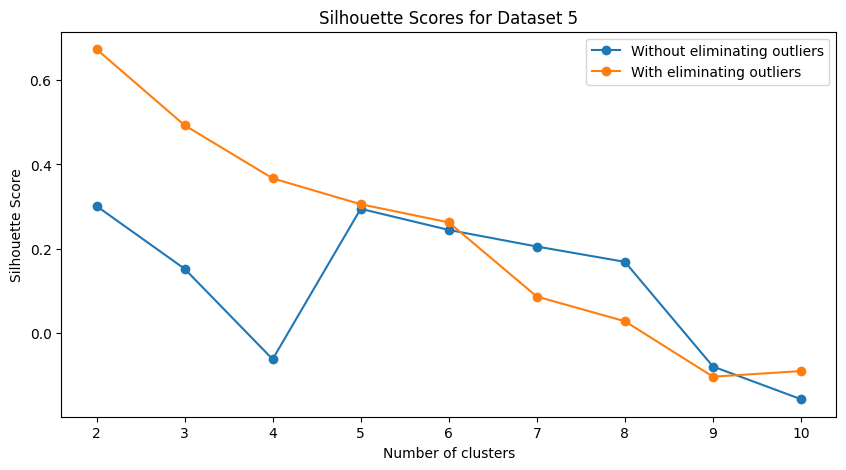

Dataset 6:
Number of clusters: 2
Without eliminating outliers:
Silhouette Score: 0.1750
With eliminating outliers:
Silhouette Score: 0.5797
Number of clusters: 3
Without eliminating outliers:
Silhouette Score: -0.1165
With eliminating outliers:
Silhouette Score: 0.3301
Number of clusters: 4
Without eliminating outliers:
Silhouette Score: -0.1838
With eliminating outliers:
Silhouette Score: 0.2402
Number of clusters: 5
Without eliminating outliers:
Silhouette Score: -0.1969
With eliminating outliers:
Silhouette Score: 0.2359
Number of clusters: 6
Without eliminating outliers:
Silhouette Score: -0.2091
With eliminating outliers:
Silhouette Score: 0.2150
Number of clusters: 7
Without eliminating outliers:
Silhouette Score: -0.2662
With eliminating outliers:
Silhouette Score: 0.2013
Number of clusters: 8
Without eliminating outliers:
Silhouette Score: 0.2755
With eliminating outliers:
Silhouette Score: 0.4988
Number of clusters: 9
Without eliminating outliers:
Silhouette Score: 0.2468
With

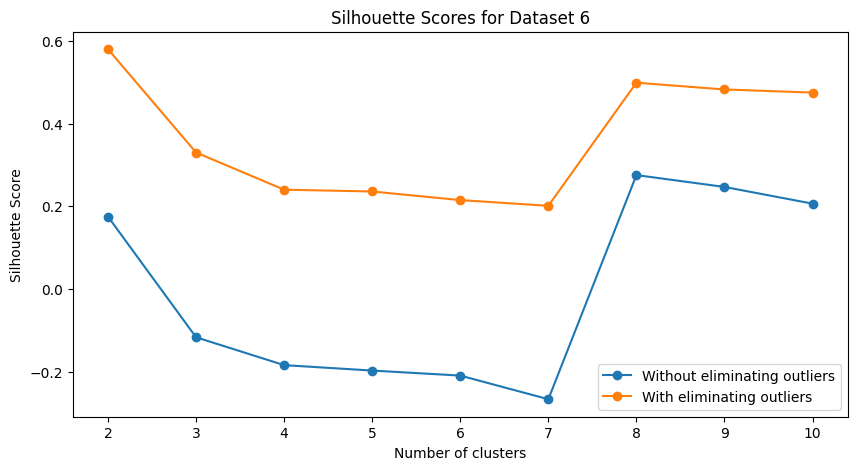

In [ ]:
import numpy as np
from sklearn import datasets
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
from tabulate import tabulate

datasets = [noisy_circles, noisy_moons, blobs, no_structure, aniso, varied]

n_clusters_range = range(2, 11)

# Loop through each dataset
for i, dataset in enumerate(datasets):
    print(f"Dataset {i + 1}:")
    X, y = dataset

    is_noisy_circles_or_moons = i in [0, 1]

    silhouette_scores_without_outliers_removed = []
    silhouette_scores_with_outliers_removed = []

    cleaned_data, cleaned_indices = remove_outliers(X, percentile=95)

    table_data = []

    # Loop through different numbers of clusters (from 2 to 10)
    for n_clusters in n_clusters_range:
        print(f"Number of clusters: {n_clusters}")

        print("Without eliminating outliers:")
        labels_without_outliers_removed = hierarchical_clustering(X, n_clusters=n_clusters, linkage_method='single')
        silhouette_score_without_outliers_removed = silhouette_score(X, labels_without_outliers_removed)
        print(f"Silhouette Score: {silhouette_score_without_outliers_removed:.4f}")
        silhouette_scores_without_outliers_removed.append(silhouette_score_without_outliers_removed)

        print("With eliminating outliers:")
        labels_with_outliers_removed = hierarchical_clustering(cleaned_data, n_clusters=n_clusters, linkage_method='single')
        silhouette_score_with_outliers_removed = silhouette_score(cleaned_data, labels_with_outliers_removed)
        print(f"Silhouette Score: {silhouette_score_with_outliers_removed:.4f}")
        silhouette_scores_with_outliers_removed.append(silhouette_score_with_outliers_removed)

        # Append silhouette scores to the table data
        table_data.append([n_clusters, silhouette_score_without_outliers_removed, silhouette_score_with_outliers_removed])

    # Print silhouette scores in a table format
    print(tabulate(table_data, headers=['Number of clusters', 'Without eliminating outliers', 'With eliminating outliers'], tablefmt='grid'))

    # Plot silhouette scores for different numbers of clusters
    plt.figure(figsize=(10, 5))
    plt.plot(n_clusters_range, silhouette_scores_without_outliers_removed, label='Without eliminating outliers', marker='o')
    plt.plot(n_clusters_range, silhouette_scores_with_outliers_removed, label='With eliminating outliers', marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.legend()
    plt.title(f"Silhouette Scores for Dataset {i + 1}")
    plt.show()


Hierarchical Clustering(complete)

In [ ]:
def plot_dendrogram(linkage_matrix, **kwargs):
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

def hierarchical_clustering(data, n_clusters, linkage_method='complete', plot_dendro=False):
    # Compute the linkage matrix
    linkage_matrix = linkage(data, method=linkage_method)

    # Create an instance of AgglomerativeClustering with the desired number of clusters and linkage method
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_method, distance_threshold=None)

    # Fit the model to the data
    model = model.fit(data)

    if plot_dendro:
        plt.figure(figsize=(12, 6))
        plot_dendrogram(linkage_matrix, truncate_mode='level', p=400)
        plt.xlabel("Index of data points")
        plt.ylabel("Euclidean distance")
        plt.show()

    # Return the cluster labels for each data point
    return model.labels_

# Visualization function
def plot_clusters(data, cleaned_data, cleaned_indices, labels):
    plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=labels, cmap='viridis', s=10)

    outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)
    plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='red', marker='x', s=50, label='Outliers')

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

Dataset 1:
Without eliminating outliers:


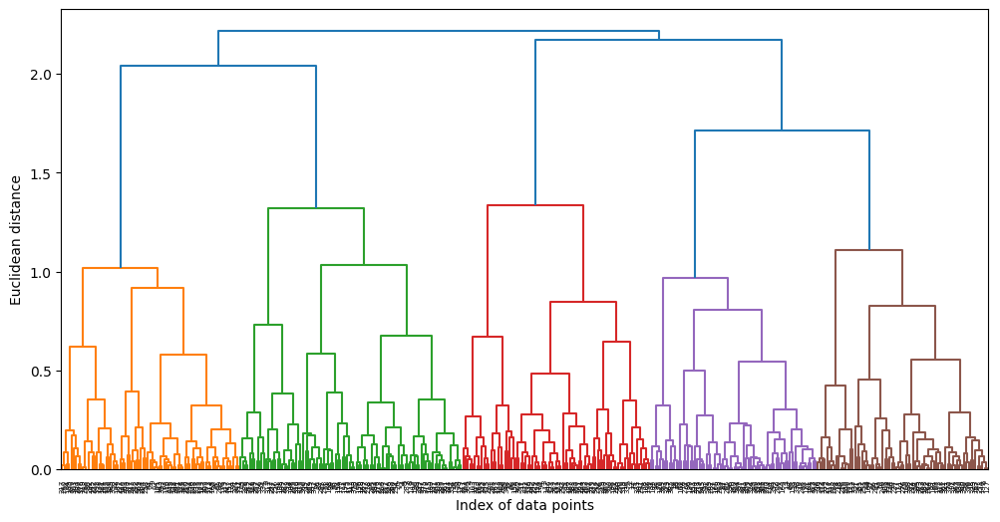

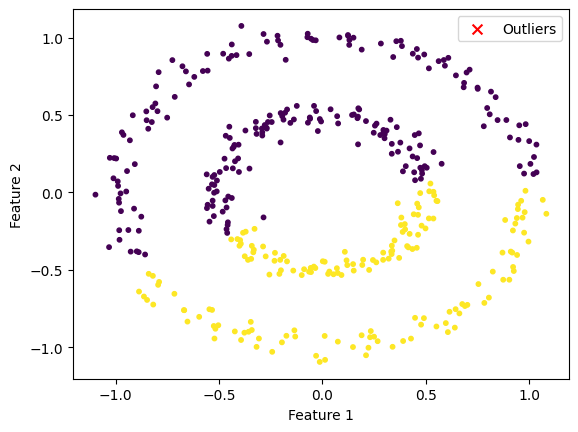

Silhouette Score: 0.3451
With eliminating outliers:


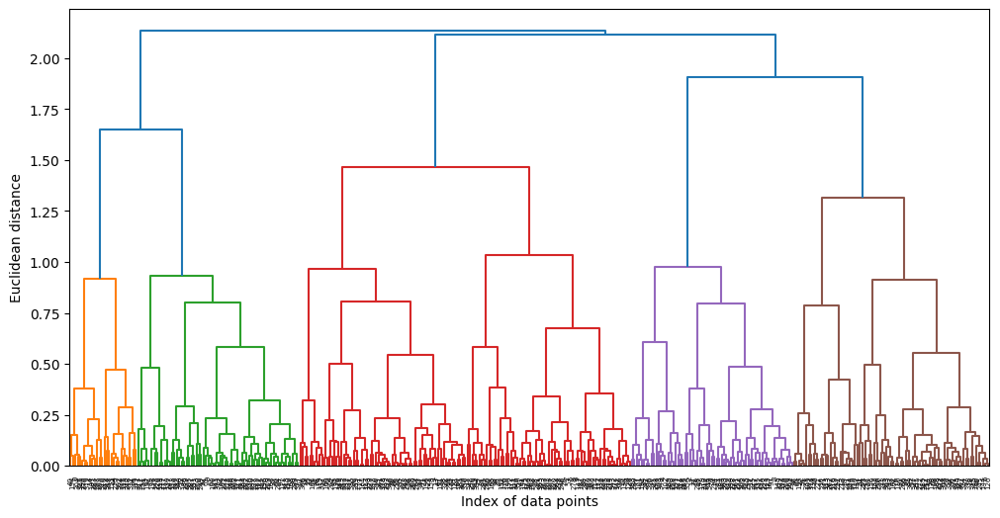

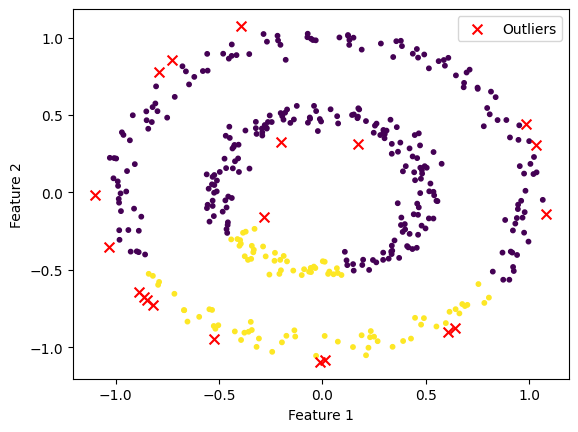

Silhouette Score: 0.2606
Dataset 2:
Without eliminating outliers:


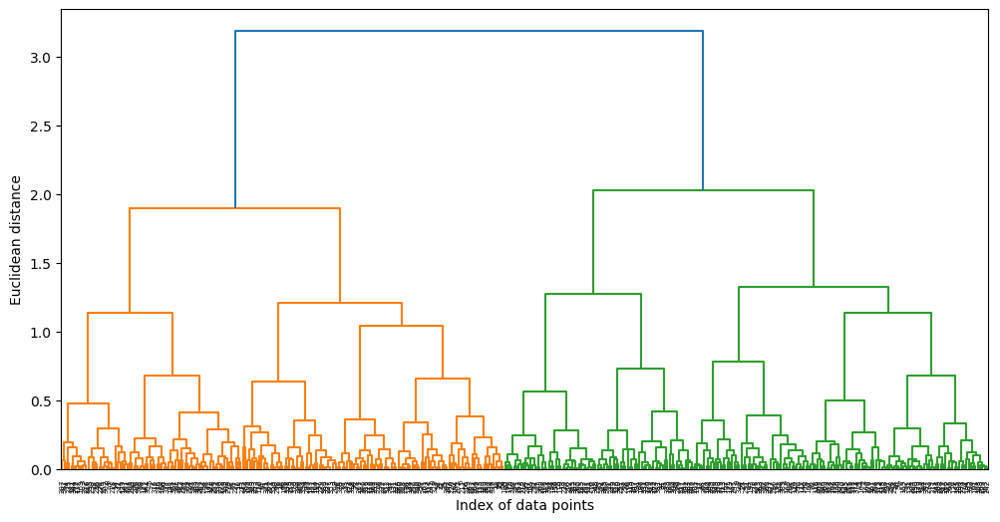

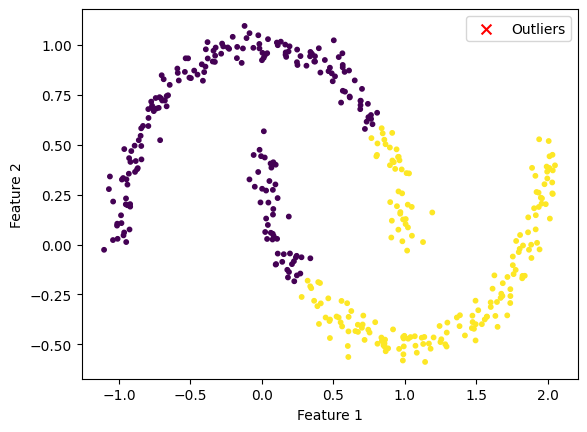

Silhouette Score: 0.4915
With eliminating outliers:


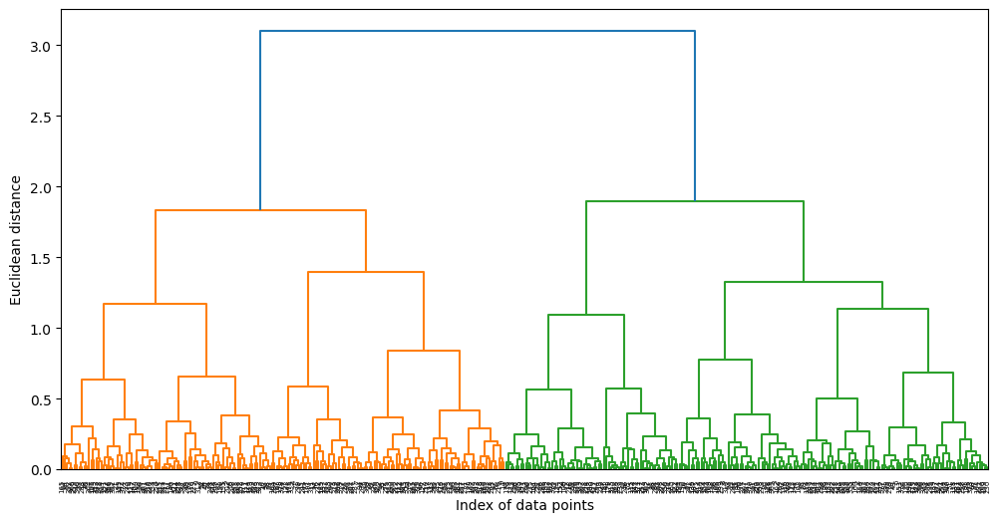

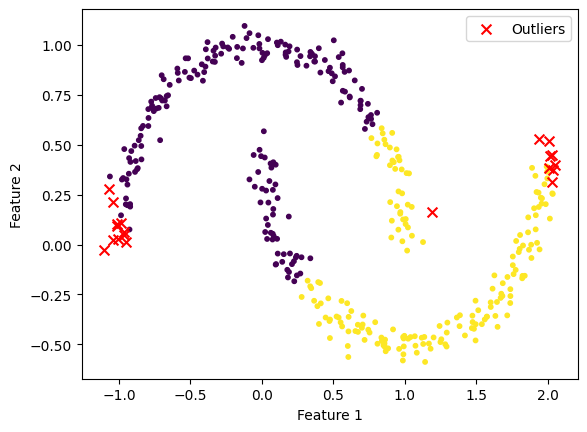

Silhouette Score: 0.4924
Dataset 3:
Without eliminating outliers:


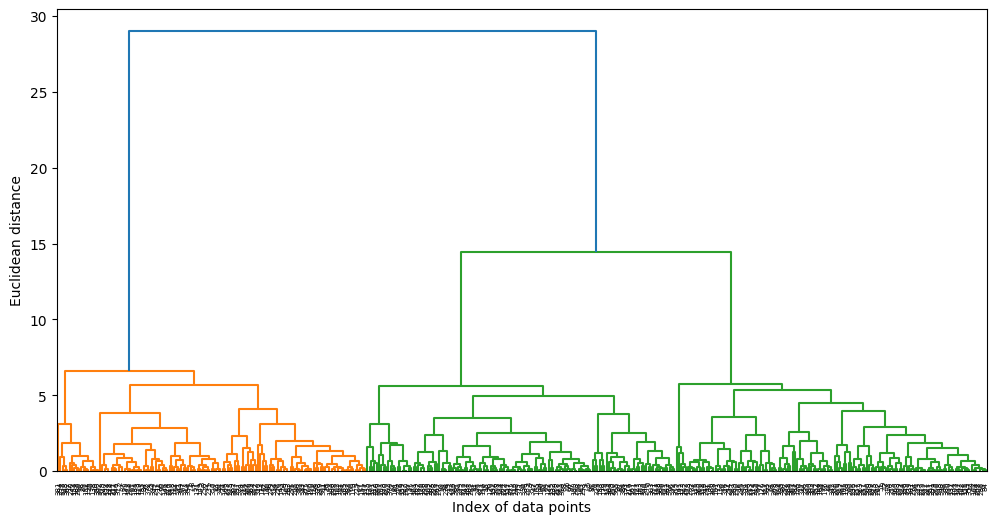

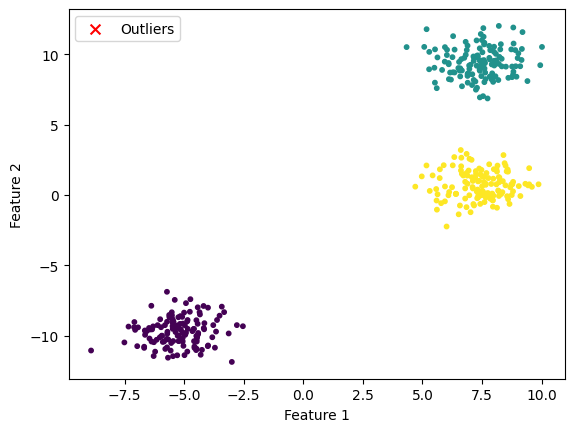

Silhouette Score: 0.8212
With eliminating outliers:


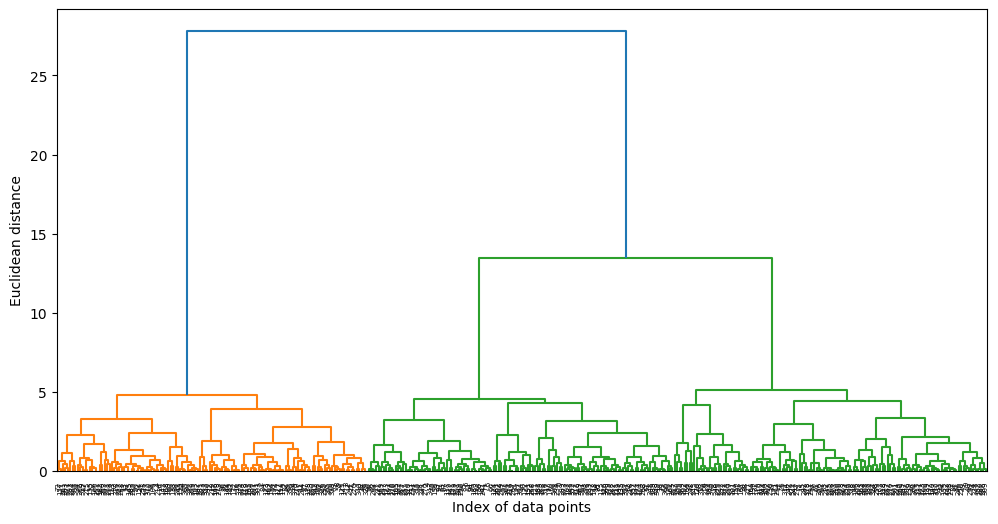

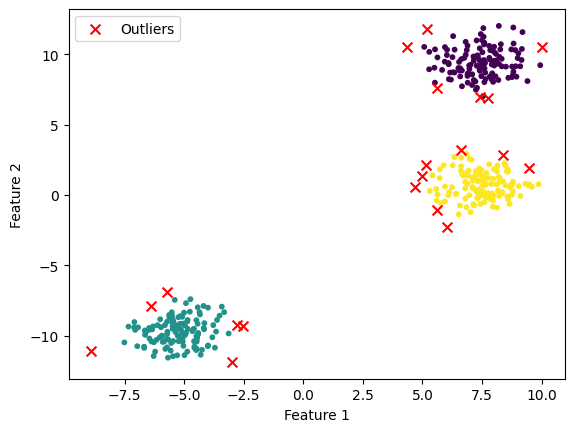

Silhouette Score: 0.8340
Dataset 4:
Without eliminating outliers:


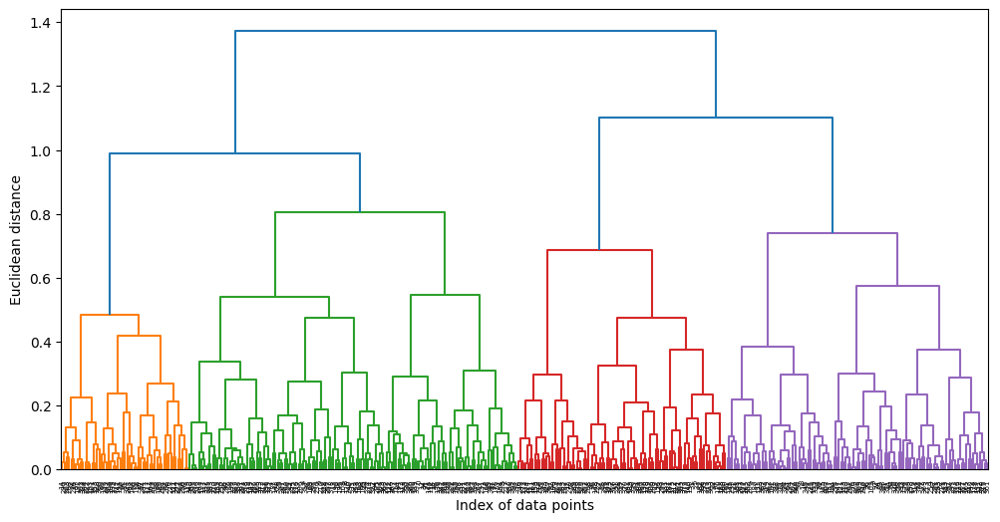

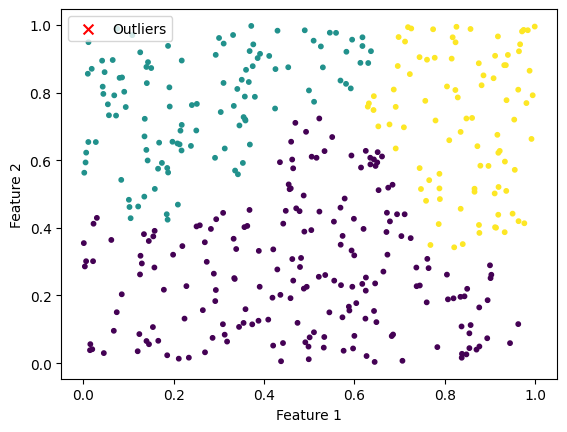

Silhouette Score: 0.3510
With eliminating outliers:


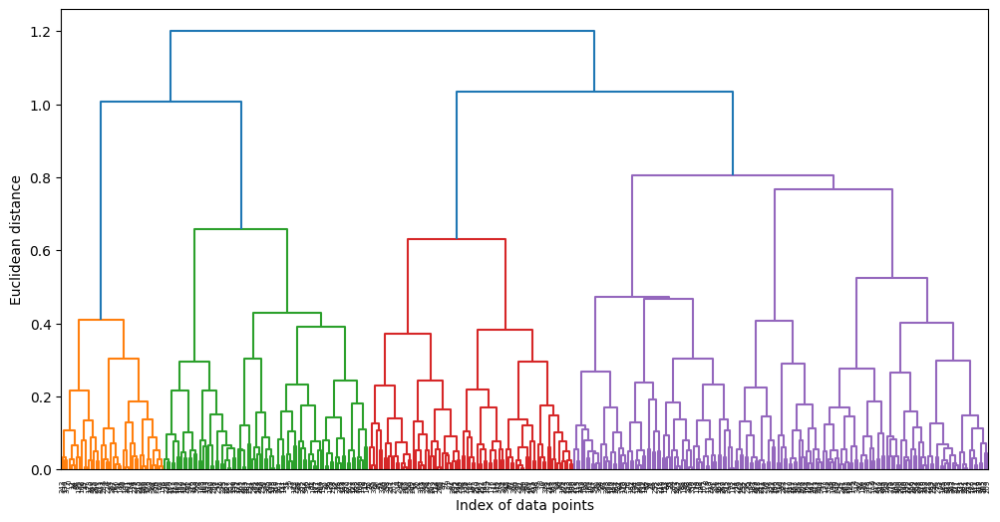

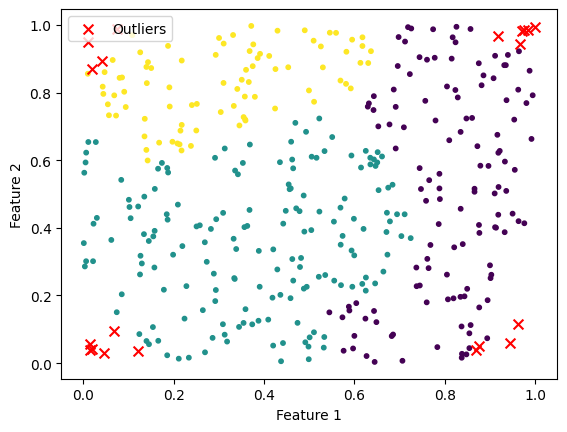

Silhouette Score: 0.2813
Dataset 5:
Without eliminating outliers:


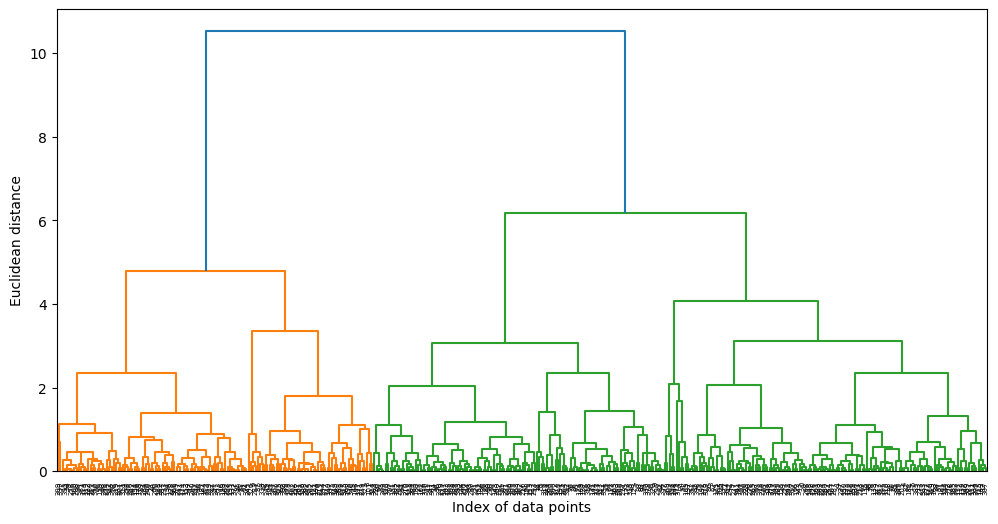

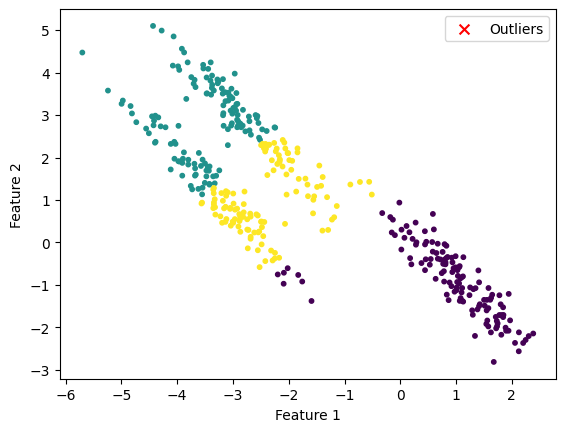

Silhouette Score: 0.4786
With eliminating outliers:


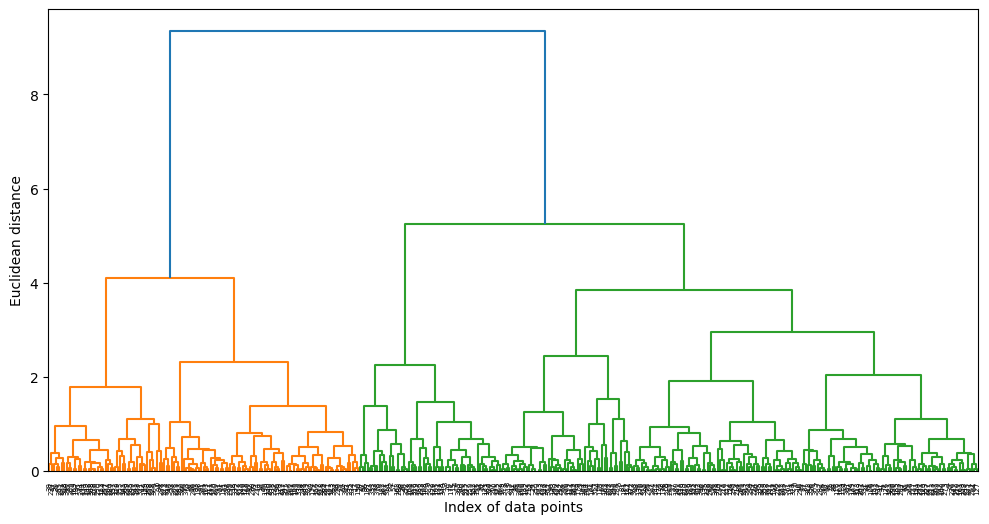

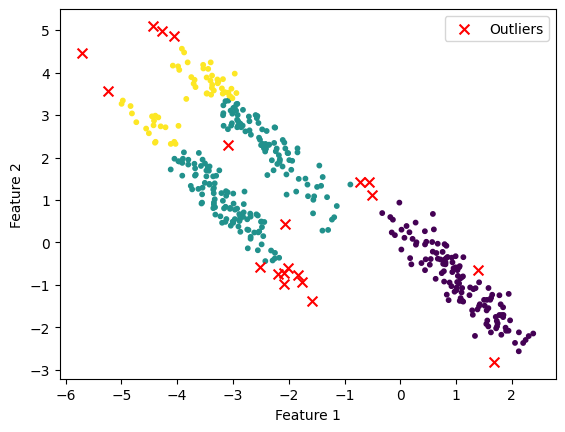

Silhouette Score: 0.4911
Dataset 6:
Without eliminating outliers:


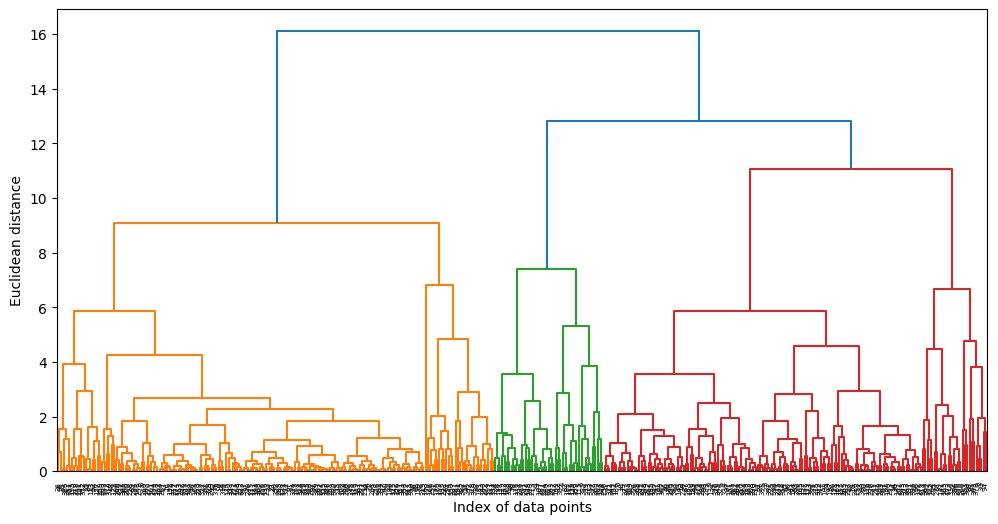

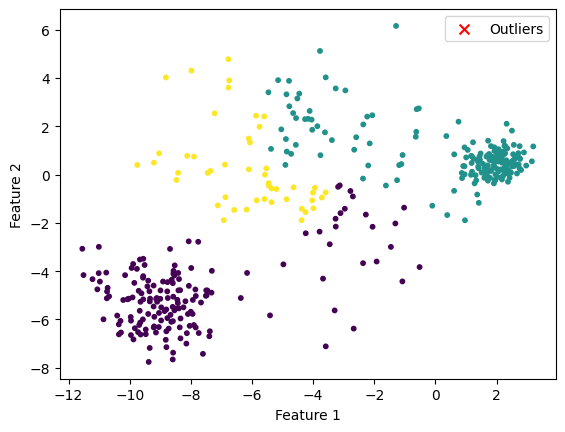

Silhouette Score: 0.4981
With eliminating outliers:


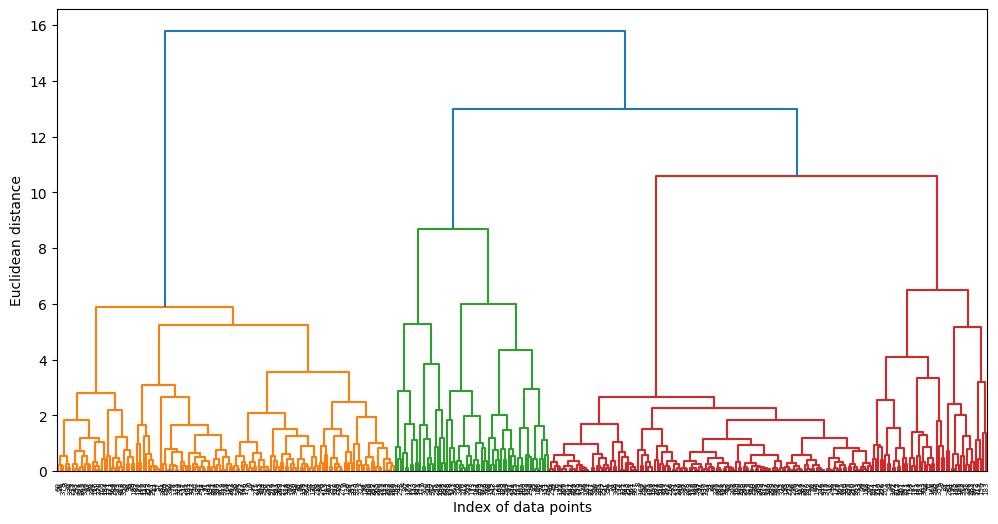

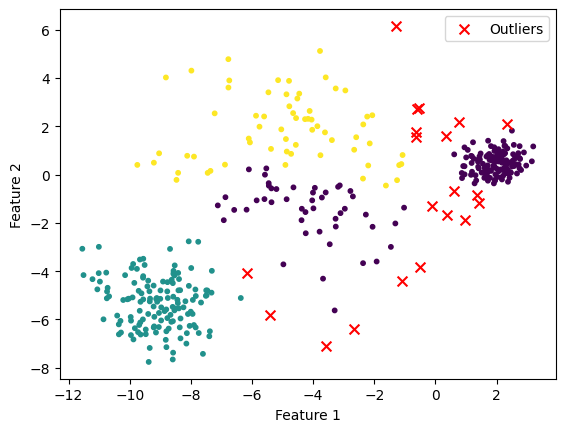

Silhouette Score: 0.5614


In [ ]:
import numpy as np
from sklearn import datasets
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Generate datasets
n_samples = 400
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

datasets = [noisy_circles, noisy_moons, blobs, no_structure, aniso, varied]

# Loop through each dataset, perform clustering, and visualize the results
for i, dataset in enumerate(datasets):
    print(f"Dataset {i + 1}:")
    X, y = dataset

    # Set a flag to indicate whether the dataset is either noisy_circles or noisy_moons
    is_noisy_circles_or_moons = i in [0, 1]

    # Set n_clusters to 2 if the dataset is either noisy_circles or noisy_moons, otherwise 3
    n_clusters = 2 if is_noisy_circles_or_moons else 3

    print("Without eliminating outliers:")
    labels_without_outliers_removed = hierarchical_clustering(X, n_clusters=n_clusters, linkage_method='complete', plot_dendro=True)
    plot_clusters(X, X, np.arange(X.shape[0]), labels_without_outliers_removed)
    silhouette_score_without_outliers_removed = silhouette_score(X, labels_without_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_without_outliers_removed:.4f}")

    print("With eliminating outliers:")
    cleaned_data, cleaned_indices = remove_outliers(X, percentile=95)
    labels_with_outliers_removed = hierarchical_clustering(cleaned_data, n_clusters=n_clusters, linkage_method='complete',plot_dendro=True)

    plot_clusters(X, cleaned_data, cleaned_indices, labels_with_outliers_removed)
    silhouette_score_with_outliers_removed = silhouette_score(cleaned_data, labels_with_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_with_outliers_removed:.4f}")

Hierarchical Clustering(average)

In [ ]:
def plot_dendrogram(linkage_matrix, **kwargs):
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

def hierarchical_clustering(data, n_clusters, linkage_method='average', plot_dendro=False):
    # Compute the linkage matrix
    linkage_matrix = linkage(data, method=linkage_method)

    # Create an instance of AgglomerativeClustering with the desired number of clusters and linkage method
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_method, distance_threshold=None)

    # Fit the model to the data
    model = model.fit(data)

    if plot_dendro:
        plt.figure(figsize=(12, 6))
        plot_dendrogram(linkage_matrix, truncate_mode='level', p=400)
        plt.xlabel("Index of data points")
        plt.ylabel("Euclidean distance")
        plt.show()

    # Return the cluster labels for each data point
    return model.labels_

# Visualization function
def plot_clusters(data, cleaned_data, cleaned_indices, labels):
    plt.scatter(cleaned_data[:, 0], cleaned_data[:, 1], c=labels, cmap='viridis', s=10)

    outlier_indices = np.setdiff1d(np.arange(data.shape[0]), cleaned_indices)
    plt.scatter(data[outlier_indices, 0], data[outlier_indices, 1], c='red', marker='x', s=50, label='Outliers')

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.show()

Dataset 1:
Without eliminating outliers:


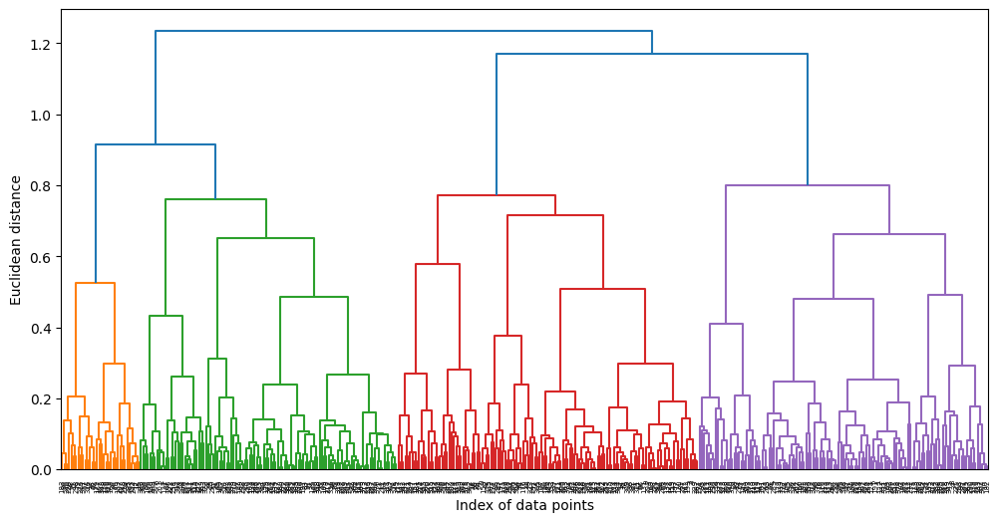

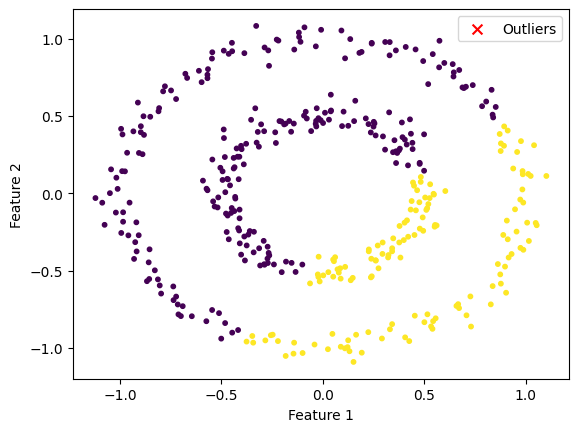

Silhouette Score: 0.3265
With eliminating outliers:


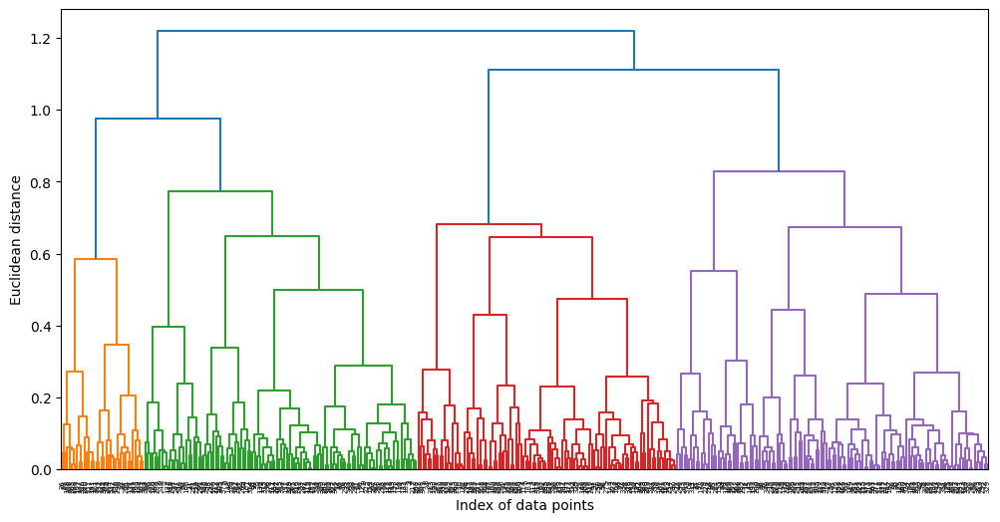

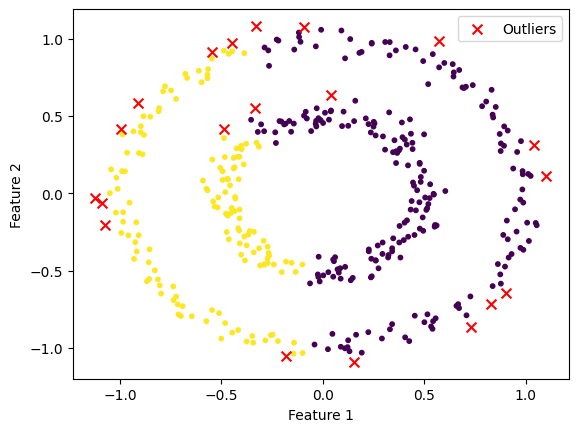

Silhouette Score: 0.3378
Dataset 2:
Without eliminating outliers:


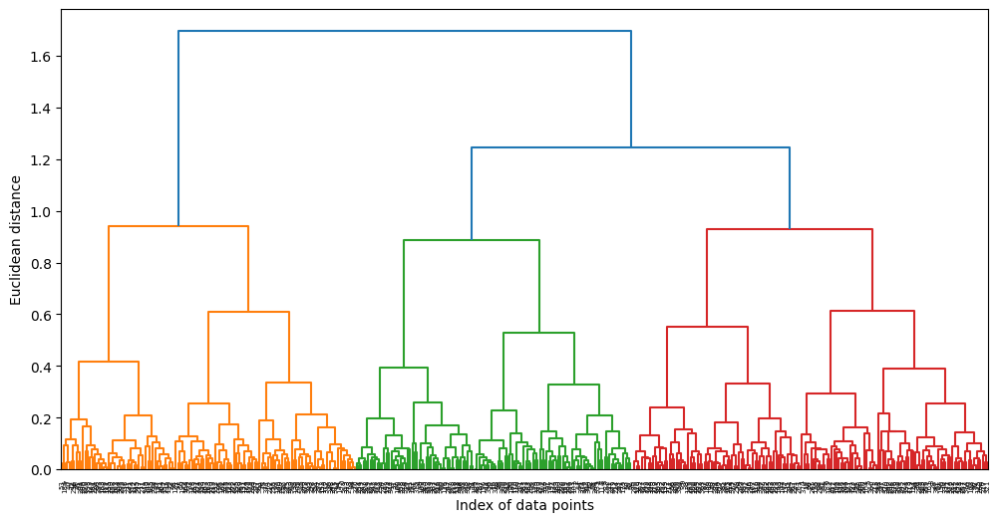

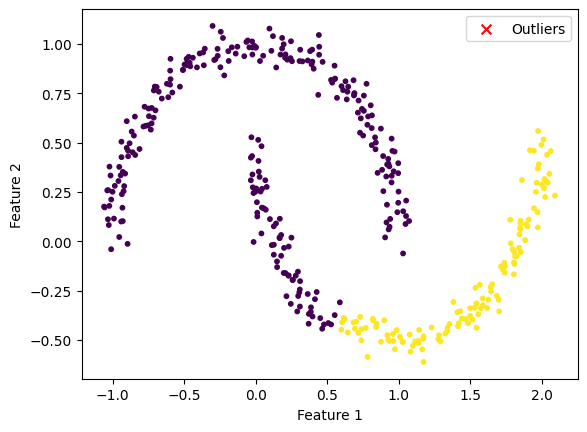

Silhouette Score: 0.4474
With eliminating outliers:


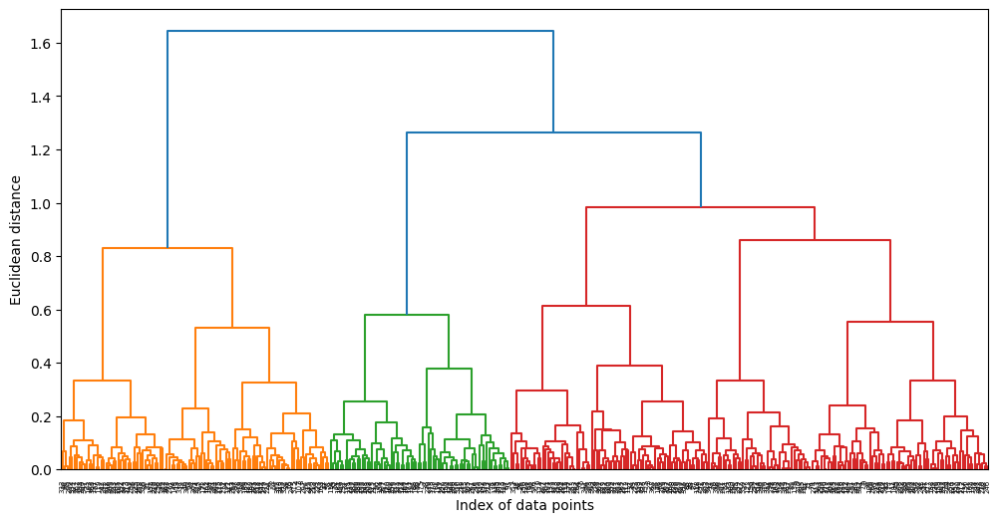

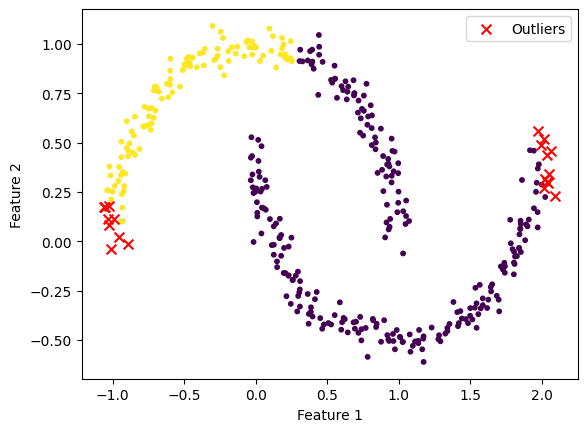

Silhouette Score: 0.4418
Dataset 3:
Without eliminating outliers:


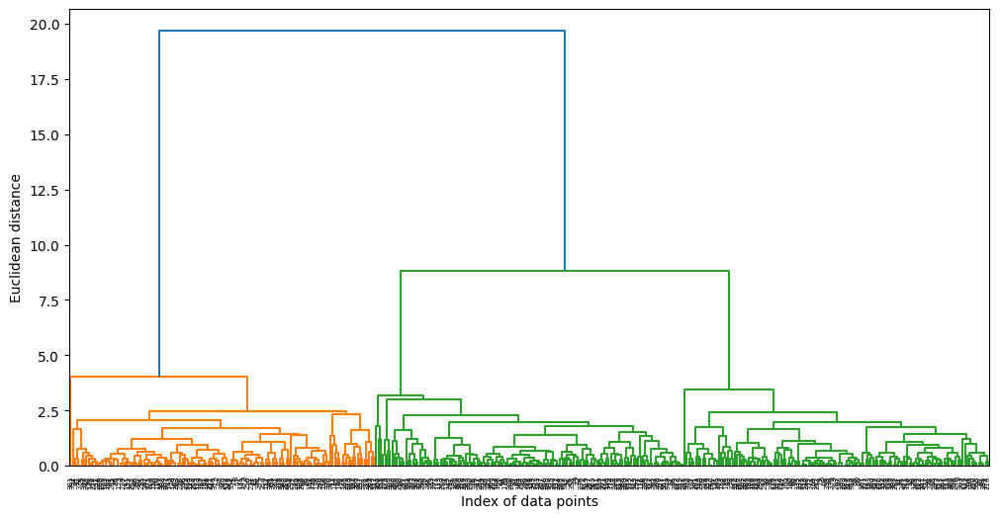

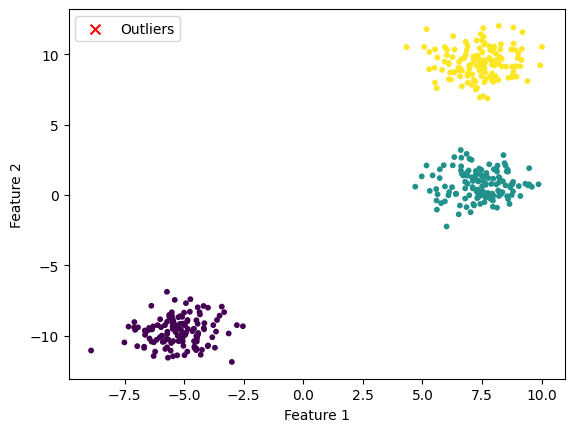

Silhouette Score: 0.8212
With eliminating outliers:


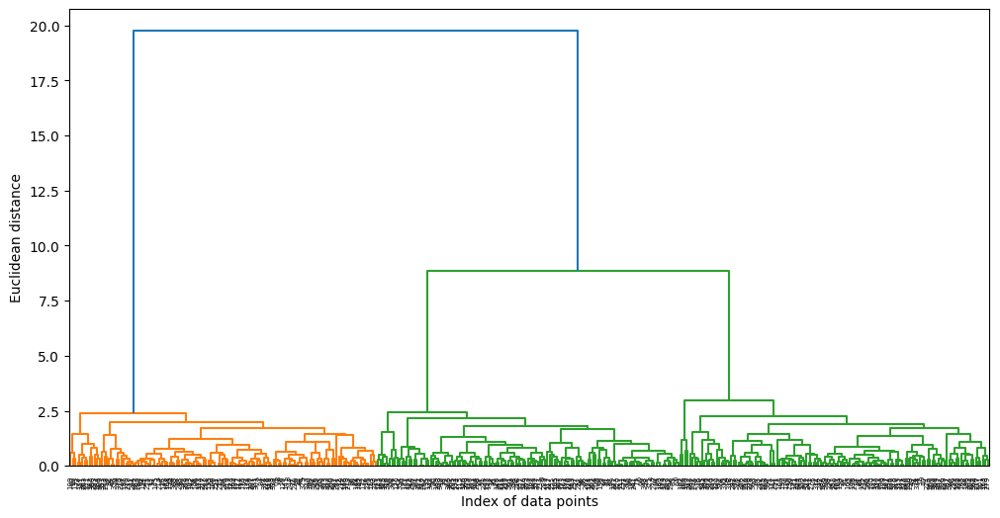

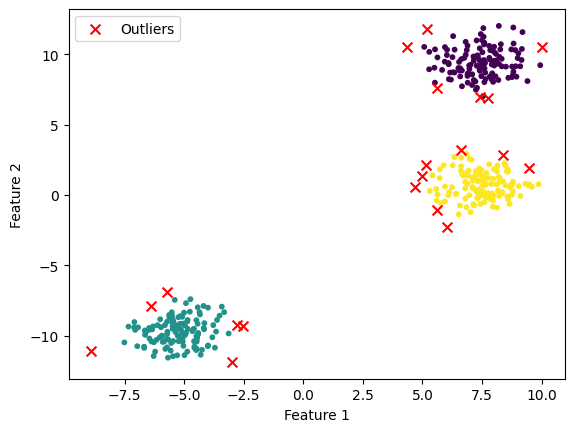

Silhouette Score: 0.8340
Dataset 4:
Without eliminating outliers:


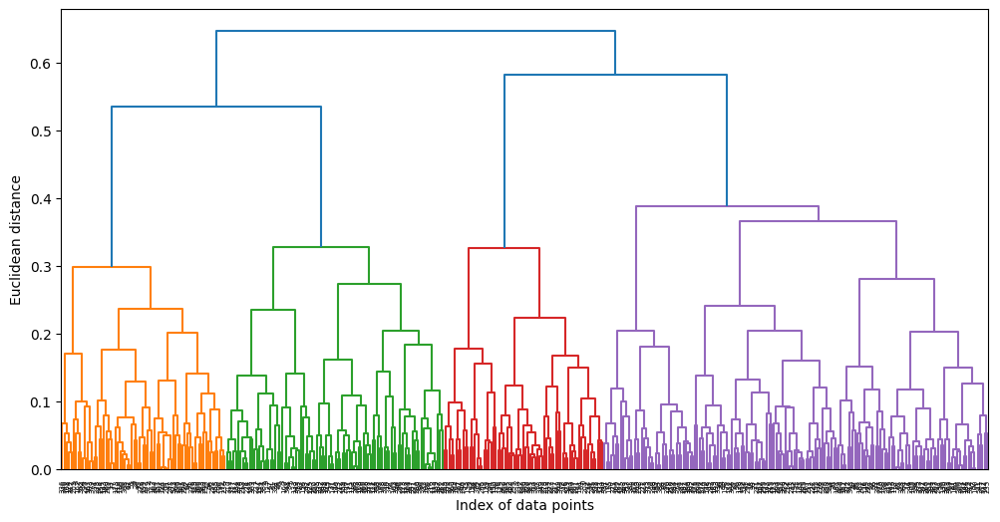

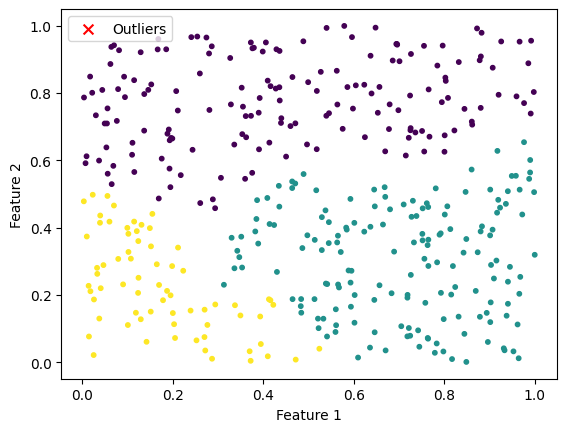

Silhouette Score: 0.3559
With eliminating outliers:


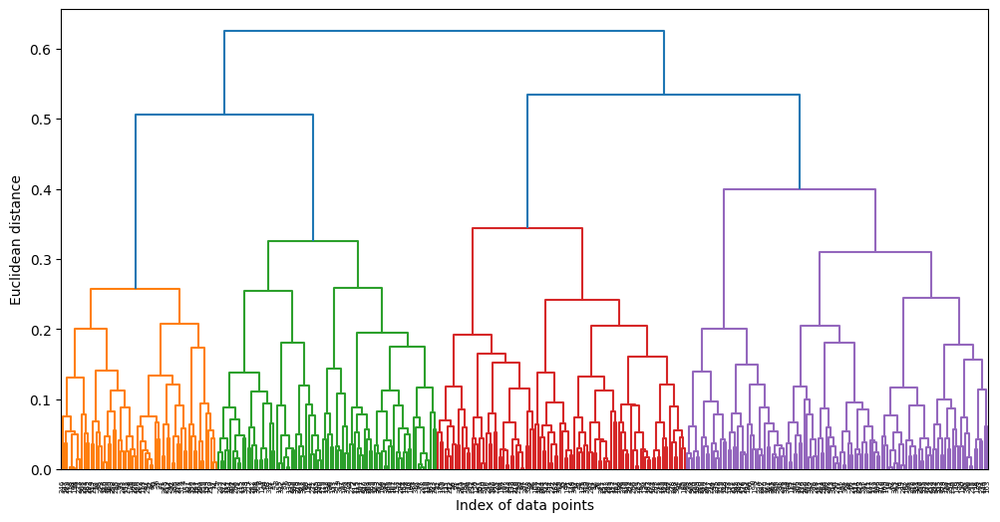

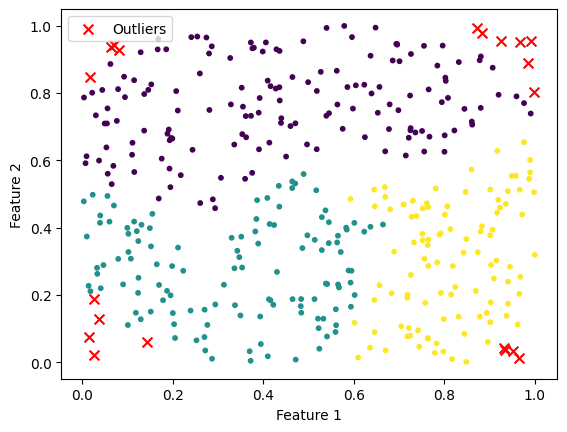

Silhouette Score: 0.3484
Dataset 5:
Without eliminating outliers:


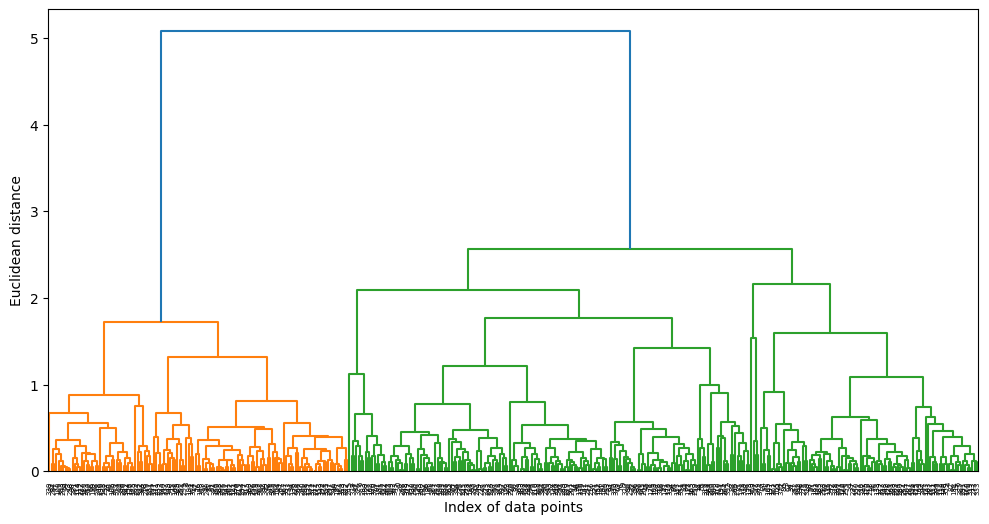

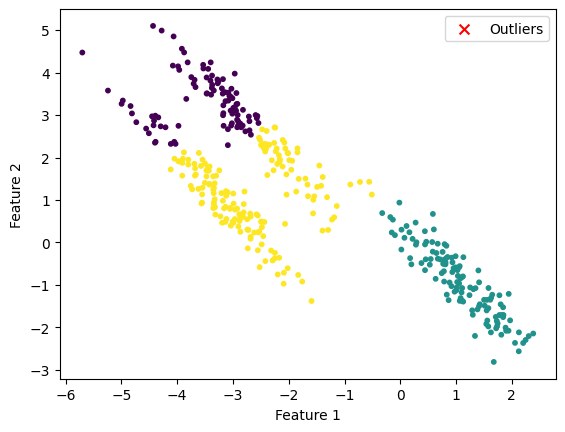

Silhouette Score: 0.5216
With eliminating outliers:


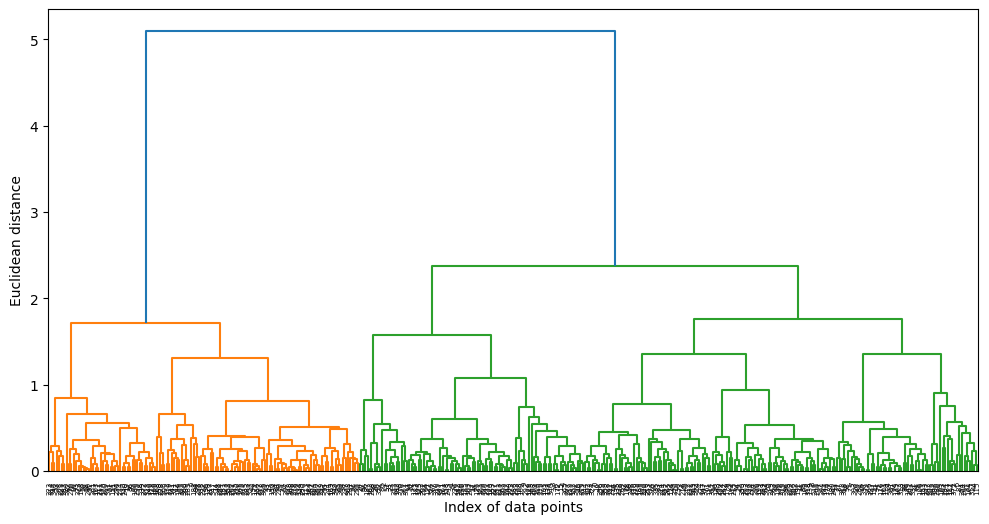

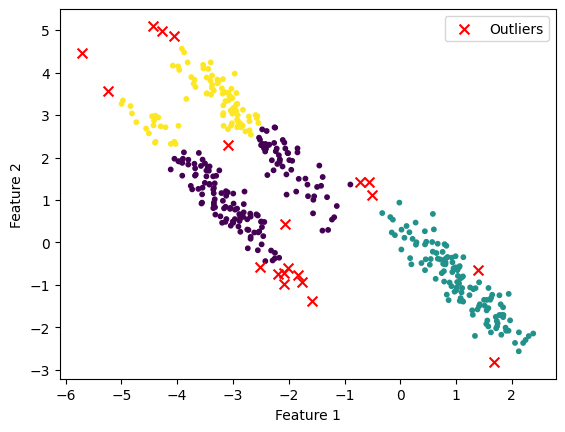

Silhouette Score: 0.5370
Dataset 6:
Without eliminating outliers:


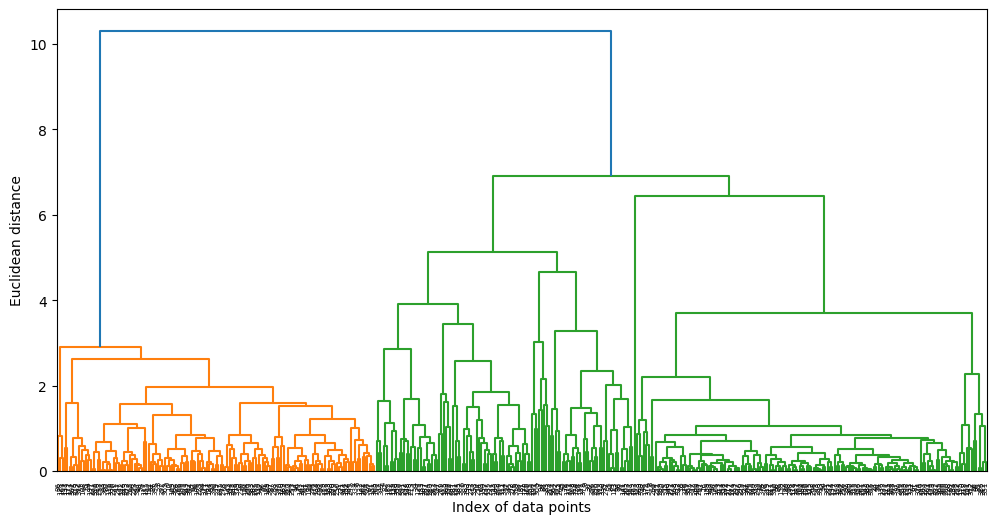

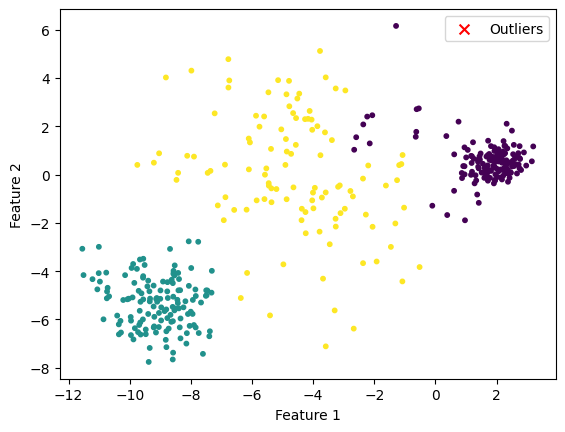

Silhouette Score: 0.6308
With eliminating outliers:


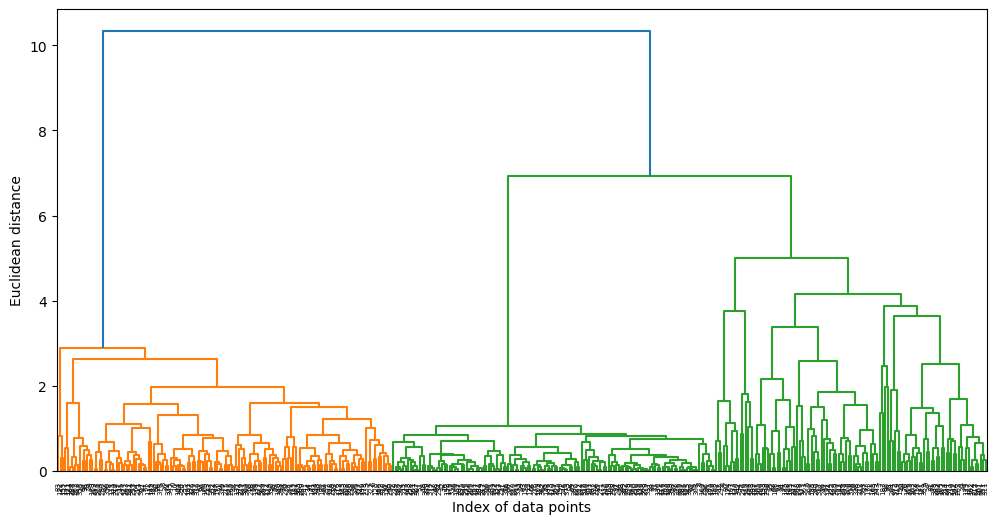

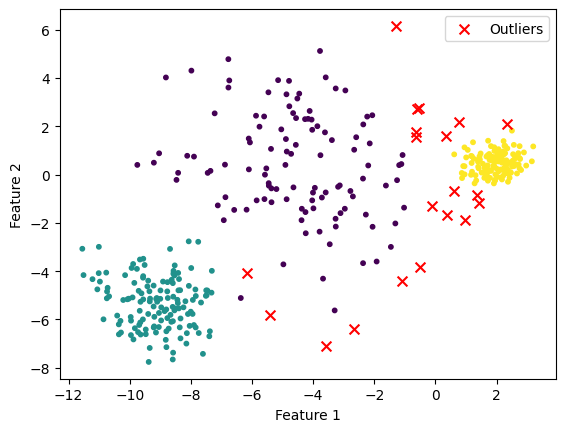

Silhouette Score: 0.6784


In [ ]:
import numpy as np
from sklearn import datasets
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Generate datasets
n_samples = 400
noisy_circles = datasets.make_circles(n_samples=n_samples, factor=0.5, noise=0.05)
noisy_moons = datasets.make_moons(n_samples=n_samples, noise=0.05)
blobs = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2), None

random_state = 170
X, y = datasets.make_blobs(n_samples=n_samples, random_state=random_state)
transformation = [[0.6, -0.6], [-0.4, 0.8]]
X_aniso = np.dot(X, transformation)
aniso = (X_aniso, y)

varied = datasets.make_blobs(
    n_samples=n_samples, cluster_std=[1.0, 2.5, 0.5], random_state=random_state
)

datasets = [noisy_circles, noisy_moons, blobs, no_structure, aniso, varied]

# Loop through each dataset, perform clustering, and visualize the results
for i, dataset in enumerate(datasets):
    print(f"Dataset {i + 1}:")
    X, y = dataset

    # Set a flag to indicate whether the dataset is either noisy_circles or noisy_moons
    is_noisy_circles_or_moons = i in [0, 1]

    # Set n_clusters to 2 if the dataset is either noisy_circles or noisy_moons, otherwise 3
    n_clusters = 2 if is_noisy_circles_or_moons else 3

    print("Without eliminating outliers:")
    labels_without_outliers_removed = hierarchical_clustering(X, n_clusters=n_clusters, linkage_method='average', plot_dendro=True)
    plot_clusters(X, X, np.arange(X.shape[0]), labels_without_outliers_removed)
    silhouette_score_without_outliers_removed = silhouette_score(X, labels_without_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_without_outliers_removed:.4f}")

    print("With eliminating outliers:")
    cleaned_data, cleaned_indices = remove_outliers(X, percentile=95)
    labels_with_outliers_removed = hierarchical_clustering(cleaned_data, n_clusters=n_clusters, linkage_method='average',plot_dendro=True)

    plot_clusters(X, cleaned_data, cleaned_indices, labels_with_outliers_removed)
    silhouette_score_with_outliers_removed = silhouette_score(cleaned_data, labels_with_outliers_removed)
    print(f"Silhouette Score: {silhouette_score_with_outliers_removed:.4f}")